In [1]:
import pandas as pd
import numpy as np
import math
import matplotlib.pyplot as plt
import tensorflow as tf
print(tf.__version__)
from keras import regularizers

2.1.0


Using TensorFlow backend.


In [2]:
full_data = pd.read_excel("/home/prajith_v/coding/datasets/stayfocused-may-13-end.xlsx")

In [3]:
for i in range(full_data.shape[0]):
    if full_data["Package"].values[i]=='SF---------------SF-----------------SF':
        cut = i-1
        break
cut

100

In [240]:
full_data[0:93]

,Package,Name,TF,TL,ST,ET,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13,Unnamed: 14
0,com.android.chrome,Chrome,7328704,29,1587469454237,1587469492824,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,com.android.contacts,Contacts,12378,1,1587014804168,1587014816546,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,com.android.dialer,Phone,48938,2,1587299953199,1587299954706,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,com.android.settings,Settings,146096,3,1587219470146,1587219474974,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,com.android.vending,Google Play Store,709493,10,1587469610661,1587469630013,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,com.google.android.apps.docs,Drive,304,1,1587366840019,1587366840323,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,com.google.android.apps.docs.editors.docs,Docs,37778,1,1584864052517,1584864090295,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,com.google.android.apps.maps,Maps,602801,1,1586267021359,1586267624160,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,com.google.android.apps.messaging,Messages,61873,3,1587106285053,1587106341803,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,com.google.android.apps.photos,Photos,6342,2,1587449982917,1587449987150,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
analyze = full_data.loc[0:cut+1,'Package':'TF']
analyze["Name"].values[61] = "YouTube"
analyze["Name"].values[62] = "Sheets"

In [5]:
lis = []
for i in range(0,cut+1):
    tmp = [analyze["Package"].values[i],analyze["Name"].values[i]]
    lis.append(tmp)
for i in range(0,cut+1):
    print(lis[i])

['com.android.chrome', 'Chrome']
['com.android.contacts', 'Contacts']
['com.android.dialer', 'Phone']
['com.android.settings', 'Settings']
['com.android.vending', 'Google Play Store']
['com.google.android.apps.docs', 'Drive']
['com.google.android.apps.docs.editors.docs', 'Docs']
['com.google.android.apps.maps', 'Maps']
['com.google.android.apps.messaging', 'Messages']
['com.google.android.apps.photos', 'Photos']
['com.google.android.apps.tachyon', 'Duo']
['com.google.android.calculator', 'Calculator']
['com.google.android.calendar', 'Calendar']
['com.google.android.deskclock', 'Clock']
['com.google.android.gm', 'Gmail']
['com.motorola.camera2', 'Camera']
['com.google.android.apps.books', 'Google Play Books']
['com.shazam.android', 'Shazam']
['com.spotify.music', 'Spotify']
['com.android.documentsui', 'Files']
['com.android.stk', 'SIM Toolkit']
['com.google.android.apps.wallpaper', 'Wallpapers']
['com.google.android.googlequicksearchbox', 'Google']
['com.linkedin.android', 'LinkedIn']
[

In [6]:
data = full_data.loc[cut+7:,'Package':'TF']

In [7]:
l = []
data = full_data.loc[cut+7:,'Package':'TF']
for i in range(data.shape[0]):
    l.append(i)
data = data.set_index([l])
data = data.rename(columns={"Package": "Package", "Name": "End_time","TF":"Utilized_time"})
data

,Package,End_time,Utilized_time
0,com.android.settings,1581665965504,310
1,com.stayfocused,1581665978201,12684
2,com.motorola.launcher3,1581665983983,5760
3,com.stayfocused.phone,1581665984265,19099
4,com.motorola.launcher3,1581665985714,914
5,com.spotify.music,1581665994192,8169
6,com.stayfocused.phone,1581665994239,9470
7,com.spotify.music,1581666415777,34788
8,com.motorola.launcher3,1581666418718,123
9,com.stayfocused.phone,1581666418738,37801


In [8]:
#this is the func which resolves how much time is assigned to each slot
def update(tmp,last_slot,end_time,utilized_time,start_day,last_date):
    
    #Finding the time slot where this process started
    start_slot =  math.floor(((end_time-utilized_time-(start_day+last_date*86400000))/(1000*60*60))/2)
    #print(start_slot)
    
    #if the process is opened in the same slot again
    if last_slot==start_slot:
        ad = ((tmp[last_slot]*1000)+utilized_time)/(2*60*60*1000)
        #if the total usage after opening the app is less than the remaining capacity of the slot
        if ad<1:
            tmp[last_slot] +=int(utilized_time/1000)
            return [tmp,0],[last_slot,0]
        #if the usage of the app extends to the next slot
        else:
            #assigning the present slot whith its max capacity and alculating the remaining usage of the app
            x = 2*60*60*1000-tmp[last_slot]*1000
            tmp[last_slot] = 2*60*60
            last_slot+=1
            #the remaining time divided by 2 hrs
            value = (utilized_time-x)/(2*60*60*1000)
            #now calculating the time which is assigned for each slot
            while(value>0):
                
                #if value is > 1 then the present slot is filled completely
                if value>1 and last_slot<12:
                    tmp[last_slot] = int(2*60*60)
                    last_slot+=1
                    value-=1
                
                #this means the present slot is not filled completely
                if value>0 and last_slot<12:
                    tmp[last_slot] = int(value*2*60*60)
                    value-=1
                    
                #if the app is used in the time slot of 12 AM and 1 AM
                if last_slot==12:
                    return [tmp,value*2*60*60*1000],[12,1]
                
            return [tmp,0],[last_slot,0]
        
    # if the process is not opened in the same slot then finalise the previous unfilled slots
    for i in range(last_slot,start_slot):
        last_slot+=1
    start_time = end_time-utilized_time
    
    #the remaining time divided by 2 hrs
    value = (utilized_time/(2*60*60*1000))
    
    #now allotting each slot with particular values
    while(value>0):
        #if value is > 1 then the present slot is filled completely
        if value>=1 and last_slot<12:
            tmp[last_slot]=2*60*60
            last_slot+=1
            value-=1
            continue
            
        #this means the present slot is not filled completely
        if value>0 and last_slot<12:        
            tmp[last_slot]=int(value*2*60*60)
            value-=1
            
        #if the app is used in the time slot of 12 AM and 1 AM    
        if last_slot==12:
            return [tmp,value*2*60*60*1000],[12,1]
        
        return [tmp,0],[last_slot,0]

In [9]:
#calculating the total time usage
def sums(ls):
    s =0
    for k in range(0,12):
        s = s + ls[k]
    return s

In [10]:
#this function is used for finalizing the previous days unfilled slots and assigning date and total time
def finalize(tmp,last_date,last_slot,):
    for i in range(last_slot,12):
        last_slot+=1
    tmp[12] = int(sums(tmp))
    tmp[13] = last_date
    last_date+=1
    return last_date,tmp

In [11]:
kl = [[1581618579091,10000],[1581628579091,1000000],[1581638579091,10000000],[1581648569091,10000000],[1581708569091,10800000]]
tmp=[0,0,0,0,0,0,0,0,0,0,0,0,0,0]
x,y = update(tmp,0,kl[0][0],kl[0][1],1581618569091,0)
tmp = x[0]
last_slot = y[0]
print(tmp,last_slot)
x,y = update(tmp,last_slot,kl[1][0],kl[1][1],1581618569091,0)
tmp = x[0]
last_slot = y[0]
print(x,y)
x,y = update(tmp,last_slot,kl[2][0],kl[2][1],1581618569091,0)
tmp = x[0]
last_slot = y[0]
print(x,y)
x,y = update(tmp,last_slot,kl[3][0],kl[3][1],1581618569091,0)
tmp = x[0]
last_slot = y[0]
print(x,y)
#last_date,tmp = finalize(tmp,0,last_slot)
#print(last_date,tmp)
x,y = update(tmp,last_slot,kl[4][0],kl[4][1],1581618569091,0)
tmp = x[0]
last_slot = y[0]
print(x,y)
last_date,tmp = finalize(tmp,0,last_slot)
print(last_date,tmp)

##correctly working

[10, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0] 0
[[10, 1000, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 0] [1, 0]
[[10, 7200, 3800, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 0] [2, 0]
[[10, 7200, 7200, 6600, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 0] [3, 0]
[[10, 7200, 7200, 6600, 0, 0, 0, 0, 0, 0, 0, 7200, 0, 0], 3600000.0] [12, 1]
1 [10, 7200, 7200, 6600, 0, 0, 0, 0, 0, 0, 0, 7200, 28210, 0]


In [12]:
lis1 = lis[0:3]+lis[4:]
print(len(lis1))
lis1
print(len(lis))

86
87


In [13]:
ml = []
for lm in range(len(lis1)):
    label = lis1[lm][0]
    time_slots = [2,4,6,8,10,12,14,16,18,20,22,24]
    start_day = 1581618569091
    last_date = 0
    main_list=[]
    tmp=[0,0,0,0,0,0,0,0,0,0,0,0,0,0]
    last_slot=0
    print(lis1[lm][0])
    for i in range(0,20350):
        #if data["End_Time"].value[i]-data["Utilized_time"].value[i]<(start_day+(last_date+1)*86400000):
        if data["Package"].values[i]==label:
            if (data["End_time"].values[i]-data["Utilized_time"].values[i])<(start_day+(last_date+1)*86400000):
                #update here
                x,y = update(tmp,last_slot,data["End_time"].values[i],data["Utilized_time"].values[i],start_day,last_date)
                tmp = x[0]
                value = x[1]
                last_slot = y[0]
                flag  = y[1]
                if flag==1:
                    ##Code here for the action if there is a residue in the last process's utilized_time
                    last_date,tmp = finalize(tmp,last_date,last_slot)
                    main_list.append(tmp)
                    tmp=[0,0,0,0,0,0,0,0,0,0,0,0,0,0]
                    last_slot = 0 
                    x,y = update(tmp,last_slot,data["End_time"].values[i],value,start_day,last_date)
                    tmp = x[0]
                    last_slot = y[0]
                    flag=0
                    continue
                if flag==0:
                    continue
            else:
                last_date,tmp = finalize(tmp,last_date,last_slot)
                main_list.append(tmp)
                tmp = [0,0,0,0,0,0,0,0,0,0,0,0,0,0]
                last_slot = 0
                x,y = update(tmp,last_slot,data["End_time"].values[i],data["Utilized_time"].values[i],start_day,last_date)
                tmp = x[0]
                value = x[1]
                last_slot = y[0]
                flag  = y[1]
                if flag==1:
                    ##Code here for the action if there is a residue in the last process's utilized_time
                    last_date,tmp = finalize(tmp,last_date,last_slot)
                    main_list.append(tmp)
                    tmp=[0,0,0,0,0,0,0,0,0,0,0,0,0,0]
                    last_slot = 0 
                    x,y = update(tmp,last_slot,data["End_time"].values[i],value,start_day,last_date)
                    tmp = x[0]
                    last_slot = y[0]
                    value = x[1]
                    flag  =0
                    continue
                if flag==0:
                    continue
    last_date,tmp = finalize(tmp,last_date,last_slot)
    main_list.append(tmp)   
    last_slot=0

    for i in range(last_date,51):
        tmp=[0,0,0,0,0,0,0,0,0,0,0,0,0,0]
        last_date,tmp = finalize(tmp,last_date,last_slot)
        main_list.append(tmp)
    ml.append(main_list)
    
'''time_slots = [2,4,6,8,10,12,14,16,18,20,22,24]
                
days = []
time = []
for i in range(0,len(main_list)):
    days.append((main_list[i][13]+1))
    time.append((main_list[i][12])/(60*60))

plt.plot(days,time)
plt.xlabel("days")
plt.ylabel("time in hrs")
plt.show()
'''

com.android.chrome
com.android.contacts
com.android.dialer
com.android.vending
com.google.android.apps.docs
com.google.android.apps.docs.editors.docs
com.google.android.apps.maps
com.google.android.apps.messaging
com.google.android.apps.photos
com.google.android.apps.tachyon
com.google.android.calculator
com.google.android.calendar
com.google.android.deskclock
com.google.android.gm
com.motorola.camera2
com.google.android.apps.books
com.shazam.android
com.spotify.music
com.android.documentsui
com.android.stk
com.google.android.apps.wallpaper
com.google.android.googlequicksearchbox
com.linkedin.android
com.microsoft.office.outlook
com.motorola.ccc.notification
com.motorola.fmplayer
com.motorola.genie
com.motorola.moto
com.aidungeon
com.application.zomato
com.century.centurylaundry
com.google.android.apps.adm
com.google.android.apps.nbu.files
com.google.android.apps.nbu.paisa.user
com.google.android.apps.paidtasks
com.google.android.play.games
com.iitms.jsstu
com.lenovo.anyshare.gps
com.m

'time_slots = [2,4,6,8,10,12,14,16,18,20,22,24]\n                \ndays = []\ntime = []\nfor i in range(0,len(main_list)):\n    days.append((main_list[i][13]+1))\n    time.append((main_list[i][12])/(60*60))\n\nplt.plot(days,time)\nplt.xlabel("days")\nplt.ylabel("time in hrs")\nplt.show()\n'

In [171]:
b = np.array(ml)
b.shape

(73, 51, 14)

<Figure size 432x288 with 0 Axes>

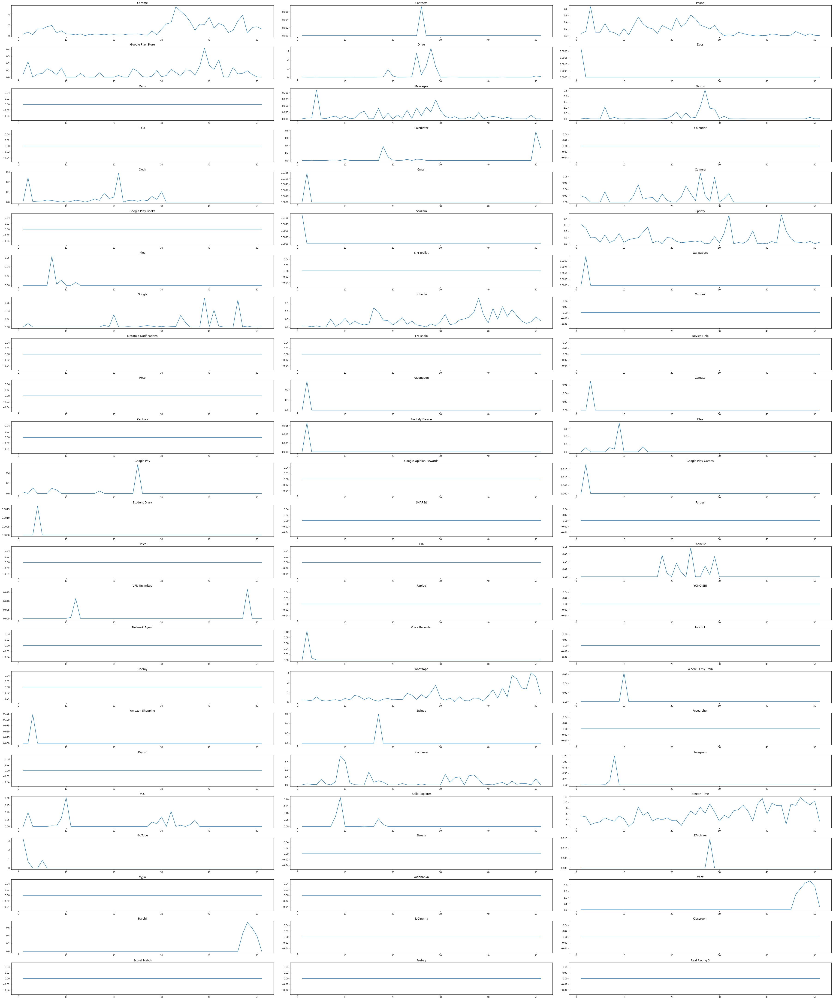

In [173]:
fig = plt.gcf()
#fig.set_size_inches(16,16)
pic , ax = plt.subplots(24,3,figsize = (50,60),constrained_layout=True)
flag=0
flag1 =0
flag2=0
for i in range(0,72):
    flag+=1
    days = []
    time = []
    for j in range(0,51):
        days.append((b[i][j][13]+1))
        time.append((b[i][j][12])/(60*60))
    ax[flag2,flag1].plot(days,time)
    ax[flag2,flag1].set_title(lis1[flag-1][1])
    flag1+=1
    if flag1==3:
        flag2+=1
        flag1=0
    

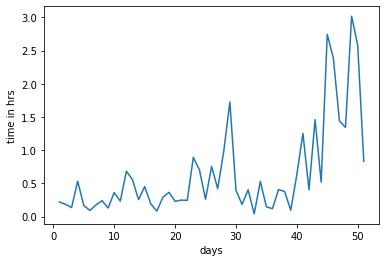

In [28]:
plt.plot(days,time)
plt.xlabel("days")
plt.ylabel("time in hrs")
plt.show()
#for chrome

In [67]:
for i in range(len(lis)):
    print(str(i+1)+" "+str(lis[i][1]))
x = int(input("Enter the number to get the stats : "))
label = lis[(x)-1][0]
print(label)

time_slots = [2,4,6,8,10,12,14,16,18,20,22,24]
start_day = 1581618569091
last_date = 0
main_list=[]


tmp=[0,0,0,0,0,0,0,0,0,0,0,0,0,0]
last_slot=0
for i in range(data.shape[0]):
    #if data["End_Time"].value[i]-data["Utilized_time"].value[i]<(start_day+(last_date+1)*86400000):
    if data["Package"].values[i]==label:
        if (data["End_time"].values[i]-data["Utilized_time"].values[i])<(start_day+(last_date+1)*86400000):
            #update here
            x,y = update(tmp,last_slot,data["End_time"].values[i],data["Utilized_time"].values[i],start_day,last_date)
            tmp = x[0]
            value = x[1]
            last_slot = y[0]
            flag  = y[1]
            if flag==1:
                ##Code here for the action if there is a residue in the last process's utilized_time
                last_date,tmp = finalize(tmp,last_date,last_slot)
                main_list.append(tmp)
                tmp=[0,0,0,0,0,0,0,0,0,0,0,0,0,0]
                last_slot = 0 
                x,y = update(tmp,last_slot,data["End_time"].values[i],value,start_day,last_date)
                tmp = x[0]
                last_slot = y[0]
                flag=0
                continue
            if flag==0:
                continue
        else:
            last_date,tmp = finalize(tmp,last_date,last_slot)
            main_list.append(tmp)
            tmp = [0,0,0,0,0,0,0,0,0,0,0,0,0,0]
            last_slot = 0
            x,y = update(tmp,last_slot,data["End_time"].values[i],data["Utilized_time"].values[i],start_day,last_date)
            tmp = x[0]
            value = x[1]
            last_slot = y[0]
            flag  = y[1]
            if flag==1:
                ##Code here for the action if there is a residue in the last process's utilized_time
                last_date,tmp = finalize(tmp,last_date,last_slot)
                main_list.append(tmp)
                tmp=[0,0,0,0,0,0,0,0,0,0,0,0,0,0]
                last_slot = 0 
                x,y = update(tmp,last_slot,data["End_time"].values[i],value,start_day,last_date)
                tmp = x[0]
                last_slot = y[0]
                value = x[1]
                flag  =0
                continue
            if flag==0:
                continue
                
                
last_date,tmp = finalize(tmp,last_date,last_slot)
main_list.append(tmp)   
last_slot=0

for i in range(last_date,51):
    tmp=[0,0,0,0,0,0,0,0,0,0,0,0,0,0]
    last_date,tmp = finalize(tmp,last_date,last_slot)
    main_list.append(tmp)
                

1 Chrome
2 Contacts
3 Phone
4 Settings
5 Google Play Store
6 Drive
7 Docs
8 Maps
9 Messages
10 Photos
11 Duo
12 Calculator
13 Calendar
14 Clock
15 Gmail
16 Camera
17 Google Play Books
18 Shazam
19 Spotify
20 Files
21 SIM Toolkit
22 Wallpapers
23 Google
24 LinkedIn
25 Outlook
26 Motorola Notifications
27 FM Radio
28 Device Help
29 Moto
30 AIDungeon
31 Zomato
32 Century
33 Find My Device
34 Files
35 Google Pay
36 Google Opinion Rewards
37 Google Play Games
38 Student Diary
39 SHAREit
40 Forbes
41 Office
42 Ola
43 PhonePe
44 VPN Unlimited
45 Rapido
46 YONO SBI
47 Network Agent
48 Voice Recorder
49 TickTick
50 Udemy
51 WhatsApp
52 Where is my Train
53 Amazon Shopping
54 Swiggy
55 Researcher
56 Paytm
57 Coursera
58 Telegram
59 VLC
60 Solid Explorer
61 Screen Time
62 YouTube
63 Sheets
64 ZArchiver
65 MyJio
66 Vodobanka
67 Meet
68 Psych!
69 JioCinema
70 Classroom
71 Score! Match
72 Psebay
73 Real Racing 3
74 Zoho Meeting
75 Mars: Mars
76 PDF Creator
77 CamScanner
78 Morph
79 Gaana
80 Stickman

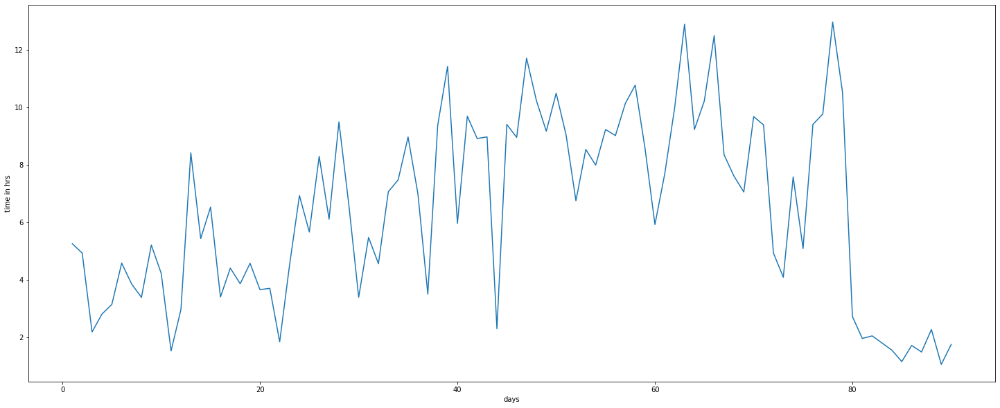

In [71]:
#%matplotlib inline
days = []
time = []
for i in range(0,len(main_list)):
    days.append((main_list[i][13]+1))
    time.append((main_list[i][12])/(60*60))

plt.figure(figsize=(25,10))
plt.plot(days,time)
plt.xlabel("days")
plt.ylabel("time in hrs")
plt.show()

In [65]:
ls =[]
print(main_list)
for i in main_list: ls.append(i[-2])

[[0, 0, 0, 0, 0, 0, 218, 0, 0, 0, 67, 0, 285, 0], [0, 0, 0, 0, 0, 0, 0, 7, 216, 0, 84, 0, 307, 1], [0, 0, 0, 0, 0, 0, 0, 68, 0, 53, 0, 0, 121, 2], [0, 0, 0, 0, 0, 0, 0, 0, 0, 74, 192, 66, 332, 3], [0, 0, 0, 0, 0, 20, 0, 13, 0, 0, 0, 53, 86, 4], [0, 0, 0, 0, 11, 0, 0, 0, 0, 83, 0, 0, 94, 5], [0, 0, 0, 0, 1320, 0, 0, 0, 0, 0, 0, 507, 1827, 6], [0, 0, 0, 0, 96, 0, 12, 0, 0, 0, 96, 0, 204, 7], [0, 0, 0, 0, 0, 22, 0, 0, 0, 0, 0, 847, 869, 8], [62, 0, 0, 0, 0, 399, 46, 993, 0, 53, 460, 0, 2013, 9], [0, 0, 0, 0, 0, 27, 0, 0, 0, 478, 94, 0, 599, 10], [113, 0, 0, 87, 126, 0, 658, 0, 0, 355, 13, 11, 1363, 11], [0, 0, 0, 0, 0, 0, 0, 0, 0, 803, 0, 0, 803, 12], [0, 0, 0, 0, 0, 10, 0, 175, 210, 1, 79, 56, 531, 13], [167, 0, 0, 0, 568, 0, 0, 0, 0, 0, 0, 0, 735, 14], [0, 0, 0, 0, 1001, 272, 196, 1, 0, 390, 295, 2163, 4318, 15], [618, 0, 0, 0, 412, 0, 1280, 0, 614, 0, 498, 7, 3429, 16], [99, 0, 0, 129, 0, 0, 0, 390, 0, 309, 365, 317, 1609, 17], [20, 0, 0, 0, 209, 30, 224, 93, 812, 105, 0, 0, 1493, 18],

In [66]:
ls = np.array(ls)
print(len(ls))
ls.sum()

90


140245

In [57]:
screen_time = 2075756
chrome = 623366
linkedin = 140245
google_searchbox = 1275
spotify = 22007
whatsapp = 276463
telegram = 5124
coursera = 43078
ls = {'chrome':chrome,'linkedin':linkedin,'google_searchbox':google_searchbox,'spotify':spotify,'whatsapp':whatsapp,'telegram':telegram,'coursera':coursera}

In [62]:
for i,j in ls.items():
    print(i,str(int(j*100/2075756))+'%')

chrome 30%
linkedin 6%
google_searchbox 0%
spotify 1%
whatsapp 13%
telegram 0%
coursera 2%


In [ ]:
plt.plot(days,ls)
plt.show

In [55]:
def windowed_dataset(series, window_size, batch_size, shuffle_buffer):
    
    dataset = tf.data.Dataset.from_tensor_slices(series)
    dataset = dataset.window(window_size + 1, shift=1, drop_remainder=True)
    dataset = dataset.flat_map(lambda window: window.batch(window_size + 1))
    dataset = dataset.shuffle(shuffle_buffer).map(lambda window: (window[:-1], window[-1]))
    dataset = dataset.batch(batch_size).prefetch(1)
    return dataset

In [151]:
c = windowed_dataset(ls,6,32,30)
print(c)

<PrefetchDataset shapes: ((None, None), (None,)), types: (tf.int64, tf.int64)>


In [90]:
plt.plot(history["loss"])

TypeError: 'History' object is not subscriptable

In [152]:
model = tf.keras.models.Sequential([
    tf.keras.layers.Dense(50, input_shape=[6], activation="relu",kernel_regularizer=regularizers.l2(0.01),
                activity_regularizer=regularizers.l1(0.01)), 
    tf.keras.layers.Dense(10, activation="relu"), 
    tf.keras.layers.Dense(1)
])

model.compile(loss="mae", optimizer=tf.keras.optimizers.SGD(lr=0.000002, momentum=0.9))
history = model.fit(c,epochs=1000,verbose=1)

Epoch 1/1000
2/2 [==============================] - 0s 135ms/step - loss: 2466.0951
Epoch 2/1000
2/2 [==============================] - 0s 12ms/step - loss: 2311.2144
Epoch 3/1000
2/2 [==============================] - 0s 15ms/step - loss: 2073.7617
Epoch 4/1000
2/2 [==============================] - 0s 19ms/step - loss: 1782.2281
Epoch 5/1000
2/2 [==============================] - 0s 19ms/step - loss: 1466.0056
Epoch 6/1000
2/2 [==============================] - 0s 16ms/step - loss: 1252.5154
Epoch 7/1000
2/2 [==============================] - 0s 14ms/step - loss: 1184.5525
Epoch 8/1000
2/2 [==============================] - 0s 15ms/step - loss: 1207.4715
Epoch 9/1000
2/2 [==============================] - 0s 20ms/step - loss: 1231.8050
Epoch 10/1000
2/2 [==============================] - 0s 19ms/step - loss: 1274.9527
Epoch 11/1000
2/2 [==============================] - 0s 21ms/step - loss: 1277.9978
Epoch 12/1000
2/2 [==============================] - 0s 17ms/step - loss: 1264.4735


2/2 [==============================] - 0s 16ms/step - loss: 923.4323
Epoch 100/1000
2/2 [==============================] - 0s 18ms/step - loss: 920.2290
Epoch 101/1000
2/2 [==============================] - 0s 22ms/step - loss: 915.9028
Epoch 102/1000
2/2 [==============================] - 0s 25ms/step - loss: 916.5824
Epoch 103/1000
2/2 [==============================] - 0s 16ms/step - loss: 914.2436
Epoch 104/1000
2/2 [==============================] - 0s 15ms/step - loss: 917.2215
Epoch 105/1000
2/2 [==============================] - 0s 12ms/step - loss: 912.5086
Epoch 106/1000
2/2 [==============================] - 0s 19ms/step - loss: 913.7243
Epoch 107/1000
2/2 [==============================] - 0s 16ms/step - loss: 914.5821
Epoch 108/1000
2/2 [==============================] - 0s 19ms/step - loss: 910.2293
Epoch 109/1000
2/2 [==============================] - 0s 17ms/step - loss: 904.3382
Epoch 110/1000
2/2 [==============================] - 0s 15ms/step - loss: 903.2256
Epoch 1

2/2 [==============================] - 0s 16ms/step - loss: 683.5188
Epoch 294/1000
2/2 [==============================] - 0s 16ms/step - loss: 687.1038
Epoch 295/1000
2/2 [==============================] - 0s 23ms/step - loss: 681.6943
Epoch 296/1000
2/2 [==============================] - 0s 16ms/step - loss: 684.2023
Epoch 297/1000
2/2 [==============================] - 0s 22ms/step - loss: 681.4423
Epoch 298/1000
2/2 [==============================] - 0s 19ms/step - loss: 680.2439
Epoch 299/1000
2/2 [==============================] - 0s 17ms/step - loss: 685.4246
Epoch 300/1000
2/2 [==============================] - 0s 20ms/step - loss: 678.1097
Epoch 301/1000
2/2 [==============================] - 0s 22ms/step - loss: 683.9502
Epoch 302/1000
2/2 [==============================] - 0s 18ms/step - loss: 680.6964
Epoch 303/1000
2/2 [==============================] - 0s 18ms/step - loss: 676.1615
Epoch 304/1000
2/2 [==============================] - 0s 22ms/step - loss: 677.4234
Epoch 3

2/2 [==============================] - 0s 21ms/step - loss: 586.3937
Epoch 488/1000
2/2 [==============================] - 0s 15ms/step - loss: 585.2489
Epoch 489/1000
2/2 [==============================] - 0s 17ms/step - loss: 587.0803
Epoch 490/1000
2/2 [==============================] - 0s 17ms/step - loss: 583.7185
Epoch 491/1000
2/2 [==============================] - 0s 15ms/step - loss: 586.9169
Epoch 492/1000
2/2 [==============================] - 0s 16ms/step - loss: 587.6735
Epoch 493/1000
2/2 [==============================] - 0s 16ms/step - loss: 584.1970
Epoch 494/1000
2/2 [==============================] - 0s 18ms/step - loss: 590.6959
Epoch 495/1000
2/2 [==============================] - 0s 24ms/step - loss: 586.2469
Epoch 496/1000
2/2 [==============================] - 0s 24ms/step - loss: 580.8878
Epoch 497/1000
2/2 [==============================] - 0s 17ms/step - loss: 587.5218
Epoch 498/1000
2/2 [==============================] - 0s 18ms/step - loss: 586.4912
Epoch 4

2/2 [==============================] - 0s 21ms/step - loss: 498.7450
Epoch 682/1000
2/2 [==============================] - 0s 21ms/step - loss: 501.8970
Epoch 683/1000
2/2 [==============================] - 0s 24ms/step - loss: 509.3439
Epoch 684/1000
2/2 [==============================] - 0s 18ms/step - loss: 499.3290
Epoch 685/1000
2/2 [==============================] - 0s 16ms/step - loss: 500.0608
Epoch 686/1000
2/2 [==============================] - 0s 20ms/step - loss: 497.6552
Epoch 687/1000
2/2 [==============================] - 0s 17ms/step - loss: 496.6275
Epoch 688/1000
2/2 [==============================] - 0s 16ms/step - loss: 505.3873
Epoch 689/1000
2/2 [==============================] - 0s 16ms/step - loss: 498.3720
Epoch 690/1000
2/2 [==============================] - 0s 18ms/step - loss: 501.6946
Epoch 691/1000
2/2 [==============================] - 0s 19ms/step - loss: 498.1950
Epoch 692/1000
2/2 [==============================] - 0s 16ms/step - loss: 491.7652
Epoch 6

2/2 [==============================] - 0s 16ms/step - loss: 462.7076
Epoch 876/1000
2/2 [==============================] - 0s 16ms/step - loss: 474.5375
Epoch 877/1000
2/2 [==============================] - 0s 18ms/step - loss: 453.3325
Epoch 878/1000
2/2 [==============================] - 0s 18ms/step - loss: 458.6521
Epoch 879/1000
2/2 [==============================] - 0s 18ms/step - loss: 451.3904
Epoch 880/1000
2/2 [==============================] - 0s 24ms/step - loss: 460.2259
Epoch 881/1000
2/2 [==============================] - 0s 23ms/step - loss: 452.7486
Epoch 882/1000
2/2 [==============================] - 0s 19ms/step - loss: 445.9376
Epoch 883/1000
2/2 [==============================] - 0s 28ms/step - loss: 449.7951
Epoch 884/1000
2/2 [==============================] - 0s 20ms/step - loss: 456.5866
Epoch 885/1000
2/2 [==============================] - 0s 21ms/step - loss: 449.4798
Epoch 886/1000
2/2 [==============================] - 0s 33ms/step - loss: 453.8391
Epoch 8

In [153]:
def plot_series(time, series, format="-", start=0, end=None):
    plt.plot(time[start:end], series[start:end], format)
    plt.xlabel("Time")
    plt.ylabel("Value")
    plt.grid(True)

In [154]:
time_train = days[:60]
x_train = ls[:60]
time_valid = days[60:]
x_valid = ls[60:]
ls = np.array(ls)


[285 307 121 332  86  94]
[ 307  121  332   86   94 1827]
[ 121  332   86   94 1827  204]
[ 332   86   94 1827  204  869]
[  86   94 1827  204  869 2013]
[  94 1827  204  869 2013  599]
[1827  204  869 2013  599 1363]
[ 204  869 2013  599 1363  803]
[ 869 2013  599 1363  803  531]
[2013  599 1363  803  531  735]
[ 599 1363  803  531  735 4318]
[1363  803  531  735 4318 3429]
[ 803  531  735 4318 3429 1609]
[ 531  735 4318 3429 1609 1493]
[ 735 4318 3429 1609 1493  510]
[4318 3429 1609 1493  510 1274]
[3429 1609 1493  510 1274 2153]
[1609 1493  510 1274 2153  658]
[1493  510 1274 2153  658 1387]
[ 510 1274 2153  658 1387  526]
[1274 2153  658 1387  526  347]
[2153  658 1387  526  347   77]
[ 658 1387  526  347   77  780]
[1387  526  347   77  780  362]
[ 526  347   77  780  362 1339]
[ 347   77  780  362 1339 2872]
[  77  780  362 1339 2872  587]
[ 780  362 1339 2872  587  803]
[ 362 1339 2872  587  803 1646]
[1339 2872  587  803 1646 1880]
[2872  587  803 1646 1880 2267]
[ 587  803 164

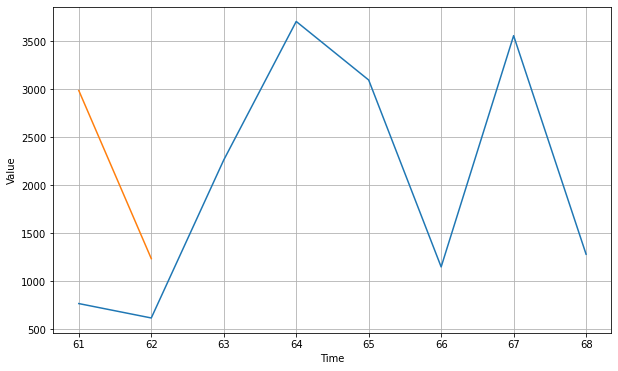

In [158]:
forecast = []
for time in range(len(ls) - 6):
    print(ls[time:time + 6])
    forecast.append((model.predict(ls[time:time + 6][np.newaxis])))
print(forecast)

#forecast = forecast[60-3:]
results = np.array(forecast)[:, 0, 0]


plt.figure(figsize=(10, 6))

plot_series(, x_valid)
plot_series(days[60:-6], results[60:])

In [ ]:
dataset = tf.data.Dataset.from_tensor_slices(ls) 
for element in dataset: 
    print(element) 

Tensor("IteratorGetNext_170354:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170355:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170356:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170357:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170358:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170359:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170360:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170361:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170362:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170363:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170364:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170365:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170366:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170367:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170368:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170369:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170370:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_170535:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170536:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170537:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170538:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170539:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170540:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170541:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170542:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170543:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170544:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170545:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170546:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170547:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170548:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170549:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170550:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170551:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_170719:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170720:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170721:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170722:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170723:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170724:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170725:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170726:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170727:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170728:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170729:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170730:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170731:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170732:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170733:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170734:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170735:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_170932:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170933:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170934:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170935:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170936:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170937:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170938:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170939:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170940:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170941:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170942:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170943:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170944:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170945:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170946:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170947:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_170948:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_171139:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171140:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171141:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171142:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171143:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171144:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171145:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171146:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171147:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171148:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171149:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171150:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171151:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171152:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171153:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171154:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171155:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_171387:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171388:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171389:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171390:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171391:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171392:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171393:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171394:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171395:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171396:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171397:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171398:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171399:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171400:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171401:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171402:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171403:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_171597:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171598:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171599:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171600:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171601:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171602:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171603:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171604:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171605:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171606:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171607:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171608:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171609:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171610:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171611:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171612:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171613:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_171769:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171770:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171771:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171772:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171773:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171774:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171775:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171776:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171777:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171778:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171779:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171780:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171781:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171782:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171783:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171784:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171785:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_171972:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171973:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171974:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171975:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171976:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171977:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171978:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171979:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171980:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171981:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171982:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171983:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171984:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171985:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171986:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171987:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_171988:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_172265:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172266:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172267:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172268:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172269:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172270:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172271:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172272:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172273:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172274:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172275:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172276:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172277:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172278:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172279:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172280:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172281:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_172431:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172432:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172433:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172434:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172435:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172436:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172437:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172438:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172439:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172440:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172441:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172442:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172443:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172444:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172445:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172446:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172447:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_172596:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172597:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172598:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172599:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172600:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172601:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172602:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172603:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172604:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172605:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172606:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172607:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172608:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172609:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172610:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172611:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172612:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_172760:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172761:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172762:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172763:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172764:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172765:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172766:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172767:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172768:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172769:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172770:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172771:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172772:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172773:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172774:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172775:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172776:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_172928:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172929:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172930:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172931:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172932:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172933:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172934:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172935:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172936:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172937:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172938:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172939:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172940:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172941:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172942:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172943:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_172944:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_173092:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173093:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173094:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173095:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173096:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173097:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173098:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173099:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173100:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173101:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173102:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173103:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173104:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173105:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173106:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173107:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173108:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_173240:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173241:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173242:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173243:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173244:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173245:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173246:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173247:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173248:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173249:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173250:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173251:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173252:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173253:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173254:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173255:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173256:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_173510:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173511:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173512:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173513:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173514:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173515:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173516:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173517:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173518:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173519:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173520:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173521:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173522:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173523:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173524:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173525:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173526:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_173668:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173669:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173670:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173671:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173672:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173673:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173674:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173675:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173676:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173677:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173678:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173679:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173680:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173681:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173682:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173683:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173684:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_173827:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173828:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173829:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173830:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173831:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173832:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173833:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173834:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173835:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173836:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173837:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173838:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173839:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173840:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173841:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173842:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_173843:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_174135:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174136:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174137:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174138:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174139:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174140:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174141:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174142:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174143:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174144:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174145:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174146:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174147:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174148:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174149:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174150:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174151:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_174296:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174297:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174298:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174299:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174300:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174301:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174302:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174303:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174304:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174305:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174306:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174307:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174308:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174309:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174310:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174311:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174312:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_174460:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174461:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174462:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174463:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174464:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174465:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174466:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174467:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174468:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174469:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174470:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174471:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174472:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174473:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174474:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174475:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174476:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_174641:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174642:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174643:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174644:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174645:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174646:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174647:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174648:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174649:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174650:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174651:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174652:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174653:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174654:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174655:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174656:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174657:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_174819:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174820:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174821:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174822:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174823:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174824:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174825:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174826:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174827:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174828:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174829:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174830:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174831:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174832:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174833:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174834:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174835:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_174983:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174984:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174985:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174986:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174987:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174988:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174989:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174990:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174991:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174992:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174993:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174994:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174995:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174996:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174997:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174998:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_174999:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_175153:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175154:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175155:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175156:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175157:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175158:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175159:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175160:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175161:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175162:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175163:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175164:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175165:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175166:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175167:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175168:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175169:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_175326:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175327:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175328:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175329:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175330:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175331:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175332:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175333:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175334:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175335:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175336:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175337:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175338:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175339:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175340:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175341:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175342:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_175486:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175487:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175488:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175489:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175490:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175491:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175492:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175493:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175494:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175495:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175496:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175497:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175498:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175499:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175500:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175501:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175502:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_175668:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175669:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175670:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175671:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175672:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175673:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175674:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175675:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175676:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175677:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175678:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175679:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175680:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175681:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175682:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175683:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175684:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_175851:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175852:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175853:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175854:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175855:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175856:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175857:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175858:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175859:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175860:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175861:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175862:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175863:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175864:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175865:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175866:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_175867:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_176037:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176038:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176039:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176040:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176041:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176042:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176043:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176044:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176045:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176046:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176047:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176048:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176049:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176050:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176051:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176052:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176053:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_176207:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176208:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176209:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176210:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176211:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176212:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176213:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176214:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176215:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176216:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176217:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176218:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176219:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176220:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176221:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176222:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176223:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_176391:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176392:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176393:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176394:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176395:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176396:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176397:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176398:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176399:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176400:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176401:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176402:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176403:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176404:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176405:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176406:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176407:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_176575:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176576:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176577:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176578:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176579:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176580:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176581:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176582:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176583:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176584:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176585:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176586:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176587:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176588:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176589:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176590:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176591:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_176779:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176780:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176781:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176782:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176783:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176784:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176785:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176786:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176787:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176788:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176789:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176790:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176791:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176792:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176793:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176794:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176795:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_176957:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176958:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176959:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176960:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176961:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176962:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176963:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176964:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176965:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176966:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176967:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176968:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176969:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176970:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176971:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176972:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_176973:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_177138:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177139:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177140:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177141:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177142:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177143:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177144:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177145:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177146:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177147:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177148:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177149:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177150:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177151:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177152:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177153:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177154:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_177315:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177316:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177317:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177318:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177319:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177320:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177321:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177322:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177323:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177324:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177325:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177326:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177327:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177328:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177329:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177330:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177331:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_177478:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177479:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177480:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177481:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177482:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177483:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177484:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177485:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177486:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177487:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177488:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177489:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177490:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177491:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177492:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177493:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177494:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_177661:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177662:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177663:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177664:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177665:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177666:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177667:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177668:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177669:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177670:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177671:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177672:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177673:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177674:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177675:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177676:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177677:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_177860:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177861:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177862:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177863:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177864:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177865:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177866:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177867:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177868:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177869:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177870:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177871:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177872:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177873:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177874:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177875:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_177876:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_178044:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178045:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178046:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178047:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178048:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178049:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178050:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178051:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178052:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178053:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178054:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178055:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178056:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178057:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178058:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178059:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178060:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_178238:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178239:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178240:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178241:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178242:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178243:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178244:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178245:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178246:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178247:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178248:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178249:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178250:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178251:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178252:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178253:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178254:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_178417:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178418:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178419:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178420:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178421:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178422:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178423:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178424:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178425:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178426:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178427:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178428:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178429:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178430:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178431:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178432:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178433:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_178601:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178602:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178603:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178604:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178605:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178606:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178607:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178608:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178609:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178610:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178611:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178612:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178613:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178614:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178615:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178616:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178617:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_178767:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178768:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178769:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178770:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178771:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178772:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178773:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178774:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178775:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178776:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178777:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178778:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178779:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178780:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178781:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178782:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178783:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_178947:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178948:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178949:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178950:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178951:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178952:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178953:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178954:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178955:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178956:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178957:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178958:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178959:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178960:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178961:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178962:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_178963:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_179122:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179123:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179124:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179125:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179126:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179127:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179128:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179129:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179130:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179131:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179132:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179133:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179134:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179135:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179136:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179137:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179138:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_179284:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179285:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179286:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179287:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179288:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179289:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179290:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179291:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179292:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179293:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179294:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179295:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179296:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179297:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179298:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179299:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179300:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_179447:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179448:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179449:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179450:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179451:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179452:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179453:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179454:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179455:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179456:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179457:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179458:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179459:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179460:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179461:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179462:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179463:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_179604:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179605:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179606:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179607:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179608:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179609:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179610:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179611:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179612:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179613:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179614:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179615:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179616:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179617:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179618:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179619:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179620:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_179760:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179761:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179762:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179763:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179764:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179765:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179766:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179767:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179768:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179769:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179770:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179771:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179772:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179773:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179774:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179775:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179776:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_179918:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179919:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179920:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179921:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179922:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179923:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179924:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179925:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179926:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179927:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179928:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179929:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179930:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179931:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179932:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179933:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_179934:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_180179:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180180:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180181:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180182:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180183:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180184:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180185:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180186:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180187:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180188:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180189:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180190:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180191:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180192:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180193:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180194:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180195:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_180369:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180370:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180371:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180372:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180373:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180374:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180375:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180376:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180377:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180378:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180379:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180380:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180381:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180382:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180383:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180384:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180385:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_180574:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180575:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180576:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180577:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180578:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180579:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180580:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180581:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180582:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180583:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180584:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180585:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180586:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180587:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180588:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180589:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180590:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_180875:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180876:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180877:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180878:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180879:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180880:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180881:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180882:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180883:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180884:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180885:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180886:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180887:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180888:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180889:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180890:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_180891:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_181102:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181103:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181104:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181105:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181106:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181107:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181108:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181109:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181110:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181111:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181112:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181113:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181114:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181115:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181116:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181117:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181118:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_181360:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181361:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181362:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181363:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181364:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181365:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181366:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181367:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181368:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181369:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181370:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181371:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181372:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181373:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181374:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181375:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181376:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_181591:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181592:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181593:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181594:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181595:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181596:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181597:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181598:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181599:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181600:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181601:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181602:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181603:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181604:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181605:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181606:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181607:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_181851:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181852:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181853:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181854:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181855:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181856:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181857:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181858:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181859:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181860:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181861:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181862:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181863:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181864:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181865:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181866:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_181867:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_182074:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182075:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182076:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182077:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182078:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182079:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182080:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182081:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182082:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182083:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182084:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182085:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182086:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182087:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182088:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182089:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182090:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_182310:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182311:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182312:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182313:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182314:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182315:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182316:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182317:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182318:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182319:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182320:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182321:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182322:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182323:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182324:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182325:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182326:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_182480:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182481:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182482:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182483:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182484:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182485:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182486:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182487:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182488:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182489:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182490:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182491:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182492:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182493:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182494:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182495:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182496:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_182727:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182728:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182729:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182730:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182731:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182732:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182733:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182734:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182735:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182736:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182737:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182738:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182739:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182740:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182741:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182742:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182743:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_182998:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_182999:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183000:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183001:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183002:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183003:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183004:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183005:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183006:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183007:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183008:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183009:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183010:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183011:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183012:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183013:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183014:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_183213:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183214:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183215:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183216:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183217:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183218:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183219:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183220:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183221:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183222:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183223:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183224:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183225:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183226:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183227:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183228:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183229:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_183360:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183361:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183362:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183363:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183364:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183365:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183366:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183367:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183368:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183369:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183370:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183371:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183372:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183373:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183374:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183375:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183376:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_183605:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183606:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183607:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183608:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183609:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183610:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183611:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183612:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183613:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183614:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183615:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183616:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183617:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183618:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183619:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183620:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183621:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_183856:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183857:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183858:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183859:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183860:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183861:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183862:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183863:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183864:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183865:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183866:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183867:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183868:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183869:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183870:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183871:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_183872:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_184089:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184090:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184091:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184092:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184093:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184094:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184095:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184096:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184097:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184098:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184099:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184100:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184101:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184102:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184103:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184104:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184105:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_184232:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184233:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184234:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184235:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184236:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184237:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184238:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184239:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184240:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184241:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184242:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184243:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184244:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184245:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184246:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184247:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184248:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_184487:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184488:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184489:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184490:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184491:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184492:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184493:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184494:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184495:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184496:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184497:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184498:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184499:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184500:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184501:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184502:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184503:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_184741:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184742:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184743:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184744:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184745:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184746:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184747:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184748:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184749:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184750:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184751:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184752:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184753:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184754:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184755:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184756:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184757:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_184996:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184997:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184998:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_184999:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185000:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185001:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185002:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185003:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185004:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185005:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185006:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185007:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185008:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185009:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185010:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185011:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185012:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_185159:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185160:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185161:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185162:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185163:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185164:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185165:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185166:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185167:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185168:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185169:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185170:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185171:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185172:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185173:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185174:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185175:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_185438:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185439:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185440:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185441:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185442:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185443:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185444:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185445:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185446:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185447:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185448:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185449:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185450:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185451:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185452:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185453:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185454:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_185700:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185701:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185702:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185703:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185704:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185705:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185706:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185707:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185708:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185709:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185710:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185711:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185712:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185713:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185714:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185715:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185716:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_185954:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185955:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185956:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185957:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185958:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185959:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185960:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185961:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185962:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185963:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185964:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185965:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185966:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185967:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185968:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185969:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_185970:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_186101:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186102:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186103:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186104:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186105:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186106:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186107:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186108:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186109:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186110:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186111:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186112:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186113:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186114:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186115:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186116:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186117:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_186366:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186367:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186368:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186369:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186370:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186371:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186372:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186373:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186374:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186375:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186376:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186377:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186378:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186379:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186380:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186381:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186382:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_186625:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186626:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186627:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186628:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186629:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186630:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186631:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186632:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186633:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186634:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186635:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186636:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186637:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186638:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186639:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186640:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186641:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_186894:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186895:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186896:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186897:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186898:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186899:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186900:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186901:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186902:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186903:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186904:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186905:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186906:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186907:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186908:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186909:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_186910:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_187175:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187176:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187177:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187178:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187179:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187180:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187181:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187182:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187183:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187184:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187185:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187186:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187187:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187188:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187189:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187190:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187191:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_187426:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187427:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187428:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187429:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187430:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187431:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187432:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187433:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187434:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187435:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187436:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187437:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187438:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187439:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187440:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187441:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187442:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_187592:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187593:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187594:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187595:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187596:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187597:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187598:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187599:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187600:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187601:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187602:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187603:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187604:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187605:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187606:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187607:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187608:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_187842:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187843:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187844:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187845:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187846:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187847:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187848:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187849:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187850:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187851:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187852:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187853:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187854:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187855:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187856:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187857:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_187858:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_188095:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188096:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188097:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188098:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188099:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188100:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188101:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188102:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188103:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188104:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188105:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188106:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188107:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188108:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188109:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188110:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188111:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_188352:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188353:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188354:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188355:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188356:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188357:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188358:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188359:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188360:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188361:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188362:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188363:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188364:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188365:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188366:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188367:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188368:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_188602:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188603:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188604:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188605:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188606:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188607:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188608:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188609:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188610:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188611:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188612:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188613:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188614:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188615:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188616:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188617:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188618:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_188835:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188836:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188837:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188838:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188839:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188840:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188841:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188842:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188843:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188844:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188845:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188846:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188847:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188848:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188849:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188850:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_188851:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_189000:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189001:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189002:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189003:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189004:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189005:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189006:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189007:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189008:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189009:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189010:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189011:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189012:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189013:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189014:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189015:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189016:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_189242:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189243:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189244:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189245:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189246:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189247:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189248:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189249:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189250:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189251:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189252:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189253:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189254:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189255:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189256:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189257:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189258:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_189505:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189506:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189507:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189508:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189509:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189510:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189511:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189512:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189513:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189514:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189515:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189516:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189517:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189518:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189519:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189520:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189521:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_189736:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189737:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189738:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189739:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189740:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189741:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189742:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189743:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189744:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189745:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189746:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189747:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189748:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189749:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189750:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189751:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189752:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_189980:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189981:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189982:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189983:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189984:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189985:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189986:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189987:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189988:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189989:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189990:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189991:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189992:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189993:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189994:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189995:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_189996:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_190208:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190209:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190210:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190211:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190212:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190213:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190214:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190215:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190216:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190217:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190218:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190219:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190220:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190221:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190222:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190223:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190224:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_190356:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190357:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190358:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190359:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190360:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190361:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190362:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190363:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190364:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190365:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190366:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190367:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190368:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190369:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190370:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190371:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190372:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_190603:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190604:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190605:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190606:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190607:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190608:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190609:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190610:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190611:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190612:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190613:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190614:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190615:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190616:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190617:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190618:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190619:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_190850:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190851:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190852:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190853:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190854:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190855:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190856:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190857:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190858:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190859:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190860:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190861:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190862:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190863:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190864:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190865:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_190866:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_191067:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191068:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191069:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191070:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191071:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191072:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191073:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191074:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191075:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191076:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191077:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191078:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191079:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191080:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191081:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191082:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191083:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_191226:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191227:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191228:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191229:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191230:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191231:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191232:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191233:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191234:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191235:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191236:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191237:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191238:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191239:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191240:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191241:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191242:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_191381:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191382:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191383:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191384:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191385:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191386:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191387:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191388:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191389:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191390:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191391:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191392:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191393:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191394:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191395:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191396:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191397:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_191550:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191551:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191552:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191553:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191554:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191555:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191556:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191557:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191558:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191559:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191560:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191561:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191562:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191563:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191564:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191565:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191566:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_191727:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191728:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191729:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191730:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191731:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191732:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191733:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191734:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191735:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191736:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191737:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191738:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191739:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191740:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191741:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191742:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191743:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_191977:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191978:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191979:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191980:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191981:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191982:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191983:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191984:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191985:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191986:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191987:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191988:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191989:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191990:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191991:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191992:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_191993:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_192241:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192242:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192243:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192244:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192245:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192246:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192247:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192248:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192249:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192250:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192251:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192252:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192253:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192254:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192255:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192256:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192257:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_192476:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192477:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192478:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192479:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192480:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192481:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192482:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192483:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192484:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192485:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192486:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192487:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192488:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192489:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192490:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192491:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192492:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_192717:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192718:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192719:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192720:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192721:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192722:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192723:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192724:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192725:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192726:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192727:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192728:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192729:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192730:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192731:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192732:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192733:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_192884:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192885:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192886:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192887:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192888:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192889:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192890:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192891:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192892:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192893:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192894:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192895:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192896:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192897:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192898:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192899:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_192900:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_193156:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193157:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193158:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193159:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193160:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193161:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193162:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193163:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193164:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193165:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193166:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193167:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193168:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193169:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193170:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193171:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193172:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_193381:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193382:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193383:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193384:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193385:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193386:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193387:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193388:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193389:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193390:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193391:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193392:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193393:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193394:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193395:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193396:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193397:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_193553:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193554:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193555:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193556:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193557:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193558:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193559:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193560:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193561:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193562:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193563:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193564:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193565:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193566:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193567:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193568:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193569:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_193830:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193831:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193832:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193833:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193834:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193835:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193836:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193837:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193838:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193839:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193840:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193841:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193842:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193843:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193844:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193845:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_193846:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_194041:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194042:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194043:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194044:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194045:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194046:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194047:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194048:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194049:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194050:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194051:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194052:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194053:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194054:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194055:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194056:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194057:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_194291:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194292:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194293:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194294:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194295:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194296:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194297:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194298:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194299:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194300:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194301:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194302:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194303:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194304:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194305:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194306:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194307:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_194446:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194447:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194448:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194449:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194450:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194451:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194452:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194453:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194454:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194455:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194456:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194457:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194458:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194459:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194460:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194461:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194462:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_194600:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194601:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194602:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194603:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194604:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194605:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194606:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194607:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194608:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194609:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194610:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194611:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194612:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194613:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194614:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194615:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194616:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_194893:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194894:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194895:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194896:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194897:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194898:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194899:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194900:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194901:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194902:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194903:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194904:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194905:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194906:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194907:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194908:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_194909:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_195085:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195086:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195087:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195088:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195089:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195090:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195091:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195092:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195093:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195094:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195095:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195096:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195097:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195098:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195099:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195100:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195101:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_195330:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195331:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195332:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195333:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195334:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195335:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195336:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195337:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195338:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195339:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195340:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195341:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195342:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195343:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195344:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195345:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195346:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_195589:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195590:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195591:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195592:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195593:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195594:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195595:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195596:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195597:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195598:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195599:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195600:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195601:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195602:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195603:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195604:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195605:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_195841:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195842:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195843:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195844:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195845:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195846:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195847:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195848:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195849:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195850:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195851:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195852:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195853:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195854:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195855:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195856:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_195857:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_196003:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196004:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196005:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196006:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196007:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196008:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196009:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196010:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196011:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196012:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196013:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196014:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196015:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196016:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196017:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196018:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196019:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_196162:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196163:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196164:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196165:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196166:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196167:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196168:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196169:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196170:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196171:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196172:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196173:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196174:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196175:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196176:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196177:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196178:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_196329:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196330:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196331:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196332:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196333:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196334:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196335:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196336:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196337:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196338:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196339:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196340:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196341:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196342:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196343:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196344:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196345:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_196486:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196487:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196488:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196489:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196490:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196491:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196492:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196493:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196494:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196495:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196496:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196497:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196498:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196499:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196500:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196501:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196502:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_196708:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196709:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196710:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196711:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196712:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196713:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196714:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196715:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196716:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196717:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196718:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196719:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196720:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196721:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196722:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196723:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196724:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_196935:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196936:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196937:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196938:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196939:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196940:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196941:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196942:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196943:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196944:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196945:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196946:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196947:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196948:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196949:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196950:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_196951:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_197152:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197153:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197154:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197155:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197156:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197157:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197158:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197159:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197160:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197161:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197162:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197163:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197164:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197165:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197166:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197167:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197168:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_197336:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197337:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197338:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197339:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197340:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197341:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197342:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197343:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197344:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197345:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197346:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197347:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197348:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197349:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197350:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197351:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197352:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_197512:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197513:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197514:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197515:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197516:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197517:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197518:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197519:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197520:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197521:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197522:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197523:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197524:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197525:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197526:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197527:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197528:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_197694:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197695:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197696:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197697:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197698:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197699:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197700:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197701:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197702:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197703:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197704:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197705:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197706:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197707:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197708:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197709:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197710:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_197871:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197872:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197873:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197874:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197875:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197876:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197877:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197878:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197879:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197880:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197881:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197882:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197883:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197884:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197885:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197886:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_197887:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_198042:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198043:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198044:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198045:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198046:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198047:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198048:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198049:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198050:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198051:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198052:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198053:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198054:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198055:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198056:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198057:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198058:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_198214:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198215:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198216:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198217:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198218:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198219:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198220:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198221:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198222:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198223:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198224:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198225:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198226:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198227:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198228:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198229:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198230:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_198375:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198376:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198377:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198378:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198379:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198380:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198381:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198382:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198383:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198384:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198385:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198386:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198387:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198388:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198389:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198390:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198391:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_198561:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198562:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198563:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198564:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198565:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198566:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198567:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198568:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198569:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198570:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198571:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198572:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198573:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198574:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198575:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198576:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198577:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_198743:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198744:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198745:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198746:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198747:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198748:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198749:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198750:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198751:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198752:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198753:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198754:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198755:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198756:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198757:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198758:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198759:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_198915:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198916:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198917:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198918:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198919:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198920:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198921:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198922:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198923:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198924:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198925:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198926:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198927:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198928:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198929:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198930:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_198931:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_199097:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199098:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199099:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199100:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199101:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199102:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199103:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199104:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199105:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199106:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199107:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199108:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199109:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199110:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199111:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199112:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199113:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_199277:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199278:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199279:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199280:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199281:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199282:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199283:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199284:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199285:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199286:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199287:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199288:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199289:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199290:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199291:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199292:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199293:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_199443:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199444:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199445:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199446:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199447:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199448:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199449:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199450:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199451:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199452:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199453:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199454:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199455:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199456:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199457:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199458:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199459:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_199628:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199629:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199630:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199631:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199632:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199633:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199634:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199635:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199636:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199637:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199638:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199639:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199640:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199641:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199642:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199643:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199644:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_199795:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199796:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199797:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199798:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199799:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199800:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199801:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199802:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199803:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199804:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199805:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199806:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199807:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199808:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199809:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199810:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199811:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_199976:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199977:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199978:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199979:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199980:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199981:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199982:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199983:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199984:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199985:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199986:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199987:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199988:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199989:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199990:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199991:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_199992:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_200156:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200157:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200158:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200159:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200160:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200161:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200162:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200163:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200164:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200165:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200166:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200167:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200168:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200169:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200170:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200171:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200172:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_200335:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200336:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200337:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200338:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200339:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200340:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200341:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200342:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200343:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200344:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200345:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200346:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200347:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200348:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200349:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200350:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200351:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_200623:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200624:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200625:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200626:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200627:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200628:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200629:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200630:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200631:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200632:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200633:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200634:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200635:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200636:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200637:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200638:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200639:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_200879:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200880:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200881:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200882:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200883:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200884:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200885:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200886:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200887:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200888:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200889:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200890:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200891:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200892:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200893:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200894:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_200895:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_201105:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201106:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201107:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201108:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201109:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201110:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201111:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201112:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201113:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201114:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201115:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201116:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201117:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201118:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201119:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201120:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201121:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_201381:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201382:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201383:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201384:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201385:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201386:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201387:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201388:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201389:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201390:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201391:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201392:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201393:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201394:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201395:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201396:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201397:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_201543:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201544:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201545:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201546:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201547:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201548:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201549:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201550:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201551:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201552:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201553:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201554:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201555:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201556:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201557:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201558:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201559:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_201740:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201741:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201742:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201743:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201744:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201745:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201746:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201747:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201748:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201749:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201750:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201751:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201752:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201753:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201754:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201755:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201756:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_201883:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201884:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201885:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201886:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201887:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201888:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201889:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201890:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201891:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201892:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201893:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201894:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201895:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201896:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201897:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201898:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_201899:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_202075:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202076:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202077:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202078:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202079:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202080:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202081:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202082:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202083:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202084:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202085:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202086:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202087:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202088:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202089:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202090:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202091:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_202245:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202246:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202247:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202248:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202249:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202250:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202251:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202252:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202253:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202254:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202255:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202256:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202257:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202258:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202259:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202260:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202261:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_202433:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202434:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202435:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202436:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202437:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202438:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202439:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202440:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202441:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202442:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202443:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202444:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202445:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202446:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202447:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202448:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202449:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_202581:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202582:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202583:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202584:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202585:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202586:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202587:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202588:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202589:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202590:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202591:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202592:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202593:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202594:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202595:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202596:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202597:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_202777:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202778:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202779:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202780:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202781:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202782:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202783:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202784:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202785:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202786:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202787:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202788:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202789:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202790:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202791:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202792:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202793:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_202990:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202991:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202992:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202993:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202994:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202995:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202996:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202997:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202998:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_202999:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203000:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203001:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203002:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203003:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203004:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203005:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203006:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_203170:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203171:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203172:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203173:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203174:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203175:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203176:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203177:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203178:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203179:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203180:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203181:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203182:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203183:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203184:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203185:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203186:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_203359:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203360:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203361:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203362:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203363:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203364:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203365:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203366:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203367:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203368:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203369:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203370:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203371:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203372:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203373:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203374:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203375:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_203609:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203610:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203611:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203612:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203613:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203614:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203615:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203616:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203617:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203618:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203619:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203620:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203621:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203622:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203623:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203624:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203625:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_203897:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203898:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203899:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203900:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203901:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203902:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203903:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203904:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203905:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203906:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203907:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203908:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203909:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203910:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203911:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203912:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_203913:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_204127:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204128:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204129:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204130:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204131:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204132:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204133:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204134:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204135:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204136:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204137:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204138:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204139:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204140:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204141:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204142:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204143:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_204364:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204365:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204366:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204367:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204368:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204369:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204370:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204371:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204372:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204373:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204374:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204375:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204376:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204377:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204378:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204379:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204380:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_204651:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204652:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204653:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204654:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204655:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204656:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204657:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204658:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204659:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204660:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204661:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204662:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204663:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204664:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204665:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204666:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204667:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_204828:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204829:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204830:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204831:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204832:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204833:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204834:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204835:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204836:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204837:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204838:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204839:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204840:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204841:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204842:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204843:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_204844:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_205005:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205006:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205007:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205008:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205009:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205010:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205011:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205012:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205013:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205014:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205015:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205016:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205017:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205018:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205019:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205020:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205021:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_205177:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205178:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205179:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205180:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205181:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205182:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205183:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205184:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205185:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205186:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205187:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205188:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205189:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205190:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205191:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205192:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205193:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_205369:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205370:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205371:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205372:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205373:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205374:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205375:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205376:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205377:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205378:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205379:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205380:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205381:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205382:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205383:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205384:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205385:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_205550:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205551:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205552:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205553:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205554:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205555:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205556:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205557:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205558:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205559:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205560:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205561:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205562:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205563:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205564:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205565:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205566:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_205737:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205738:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205739:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205740:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205741:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205742:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205743:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205744:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205745:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205746:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205747:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205748:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205749:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205750:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205751:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205752:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205753:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_205933:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205934:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205935:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205936:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205937:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205938:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205939:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205940:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205941:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205942:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205943:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205944:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205945:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205946:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205947:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205948:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_205949:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_206130:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206131:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206132:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206133:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206134:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206135:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206136:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206137:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206138:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206139:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206140:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206141:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206142:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206143:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206144:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206145:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206146:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_206327:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206328:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206329:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206330:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206331:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206332:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206333:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206334:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206335:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206336:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206337:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206338:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206339:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206340:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206341:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206342:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206343:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_206527:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206528:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206529:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206530:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206531:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206532:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206533:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206534:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206535:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206536:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206537:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206538:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206539:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206540:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206541:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206542:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206543:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_206725:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206726:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206727:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206728:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206729:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206730:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206731:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206732:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206733:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206734:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206735:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206736:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206737:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206738:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206739:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206740:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206741:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_206922:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206923:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206924:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206925:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206926:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206927:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206928:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206929:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206930:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206931:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206932:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206933:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206934:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206935:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206936:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206937:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_206938:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_207106:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207107:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207108:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207109:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207110:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207111:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207112:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207113:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207114:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207115:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207116:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207117:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207118:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207119:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207120:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207121:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207122:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_207302:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207303:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207304:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207305:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207306:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207307:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207308:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207309:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207310:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207311:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207312:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207313:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207314:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207315:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207316:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207317:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207318:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_207482:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207483:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207484:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207485:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207486:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207487:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207488:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207489:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207490:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207491:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207492:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207493:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207494:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207495:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207496:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207497:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207498:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_207675:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207676:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207677:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207678:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207679:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207680:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207681:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207682:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207683:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207684:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207685:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207686:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207687:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207688:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207689:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207690:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207691:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_207871:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207872:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207873:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207874:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207875:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207876:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207877:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207878:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207879:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207880:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207881:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207882:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207883:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207884:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207885:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207886:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_207887:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_208068:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208069:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208070:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208071:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208072:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208073:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208074:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208075:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208076:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208077:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208078:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208079:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208080:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208081:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208082:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208083:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208084:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_208268:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208269:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208270:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208271:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208272:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208273:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208274:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208275:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208276:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208277:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208278:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208279:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208280:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208281:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208282:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208283:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208284:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_208466:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208467:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208468:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208469:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208470:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208471:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208472:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208473:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208474:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208475:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208476:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208477:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208478:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208479:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208480:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208481:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208482:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_208664:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208665:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208666:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208667:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208668:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208669:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208670:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208671:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208672:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208673:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208674:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208675:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208676:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208677:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208678:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208679:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208680:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_208848:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208849:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208850:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208851:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208852:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208853:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208854:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208855:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208856:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208857:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208858:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208859:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208860:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208861:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208862:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208863:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_208864:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_209024:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209025:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209026:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209027:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209028:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209029:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209030:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209031:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209032:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209033:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209034:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209035:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209036:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209037:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209038:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209039:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209040:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_209211:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209212:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209213:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209214:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209215:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209216:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209217:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209218:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209219:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209220:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209221:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209222:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209223:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209224:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209225:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209226:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209227:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_209410:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209411:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209412:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209413:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209414:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209415:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209416:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209417:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209418:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209419:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209420:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209421:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209422:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209423:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209424:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209425:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209426:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_209603:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209604:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209605:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209606:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209607:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209608:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209609:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209610:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209611:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209612:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209613:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209614:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209615:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209616:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209617:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209618:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209619:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_209800:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209801:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209802:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209803:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209804:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209805:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209806:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209807:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209808:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209809:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209810:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209811:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209812:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209813:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209814:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209815:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_209816:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_210000:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210001:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210002:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210003:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210004:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210005:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210006:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210007:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210008:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210009:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210010:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210011:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210012:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210013:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210014:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210015:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210016:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_210198:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210199:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210200:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210201:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210202:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210203:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210204:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210205:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210206:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210207:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210208:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210209:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210210:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210211:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210212:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210213:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210214:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_210343:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210344:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210345:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210346:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210347:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210348:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210349:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210350:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210351:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210352:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210353:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210354:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210355:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210356:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210357:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210358:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210359:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_210640:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210641:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210642:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210643:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210644:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210645:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210646:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210647:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210648:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210649:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210650:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210651:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210652:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210653:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210654:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210655:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210656:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_210875:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210876:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210877:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210878:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210879:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210880:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210881:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210882:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210883:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210884:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210885:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210886:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210887:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210888:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210889:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210890:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_210891:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_211038:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211039:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211040:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211041:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211042:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211043:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211044:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211045:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211046:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211047:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211048:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211049:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211050:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211051:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211052:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211053:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211054:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_211266:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211267:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211268:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211269:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211270:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211271:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211272:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211273:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211274:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211275:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211276:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211277:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211278:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211279:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211280:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211281:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211282:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_211494:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211495:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211496:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211497:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211498:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211499:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211500:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211501:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211502:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211503:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211504:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211505:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211506:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211507:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211508:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211509:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211510:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_211644:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211645:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211646:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211647:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211648:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211649:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211650:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211651:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211652:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211653:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211654:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211655:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211656:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211657:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211658:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211659:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211660:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_211831:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211832:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211833:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211834:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211835:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211836:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211837:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211838:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211839:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211840:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211841:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211842:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211843:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211844:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211845:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211846:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_211847:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_212019:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212020:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212021:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212022:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212023:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212024:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212025:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212026:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212027:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212028:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212029:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212030:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212031:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212032:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212033:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212034:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212035:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_212204:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212205:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212206:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212207:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212208:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212209:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212210:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212211:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212212:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212213:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212214:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212215:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212216:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212217:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212218:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212219:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212220:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_212432:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212433:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212434:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212435:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212436:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212437:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212438:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212439:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212440:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212441:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212442:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212443:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212444:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212445:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212446:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212447:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212448:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_212613:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212614:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212615:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212616:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212617:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212618:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212619:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212620:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212621:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212622:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212623:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212624:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212625:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212626:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212627:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212628:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212629:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_212795:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212796:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212797:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212798:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212799:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212800:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212801:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212802:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212803:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212804:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212805:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212806:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212807:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212808:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212809:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212810:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212811:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_212979:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212980:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212981:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212982:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212983:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212984:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212985:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212986:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212987:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212988:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212989:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212990:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212991:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212992:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212993:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212994:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_212995:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_213133:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213134:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213135:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213136:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213137:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213138:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213139:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213140:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213141:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213142:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213143:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213144:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213145:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213146:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213147:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213148:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213149:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_213385:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213386:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213387:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213388:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213389:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213390:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213391:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213392:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213393:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213394:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213395:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213396:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213397:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213398:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213399:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213400:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213401:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_213527:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213528:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213529:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213530:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213531:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213532:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213533:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213534:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213535:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213536:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213537:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213538:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213539:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213540:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213541:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213542:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213543:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_213760:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213761:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213762:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213763:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213764:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213765:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213766:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213767:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213768:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213769:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213770:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213771:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213772:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213773:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213774:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213775:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_213776:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_214053:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214054:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214055:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214056:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214057:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214058:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214059:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214060:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214061:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214062:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214063:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214064:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214065:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214066:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214067:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214068:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214069:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_214220:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214221:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214222:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214223:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214224:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214225:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214226:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214227:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214228:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214229:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214230:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214231:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214232:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214233:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214234:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214235:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214236:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_214374:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214375:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214376:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214377:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214378:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214379:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214380:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214381:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214382:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214383:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214384:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214385:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214386:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214387:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214388:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214389:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214390:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_214537:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214538:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214539:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214540:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214541:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214542:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214543:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214544:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214545:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214546:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214547:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214548:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214549:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214550:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214551:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214552:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214553:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_214699:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214700:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214701:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214702:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214703:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214704:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214705:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214706:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214707:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214708:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214709:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214710:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214711:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214712:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214713:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214714:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214715:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_214860:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214861:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214862:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214863:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214864:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214865:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214866:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214867:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214868:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214869:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214870:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214871:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214872:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214873:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214874:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214875:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_214876:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_215045:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215046:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215047:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215048:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215049:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215050:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215051:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215052:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215053:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215054:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215055:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215056:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215057:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215058:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215059:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215060:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215061:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_215210:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215211:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215212:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215213:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215214:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215215:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215216:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215217:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215218:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215219:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215220:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215221:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215222:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215223:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215224:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215225:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215226:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_215384:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215385:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215386:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215387:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215388:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215389:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215390:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215391:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215392:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215393:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215394:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215395:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215396:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215397:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215398:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215399:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215400:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_215547:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215548:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215549:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215550:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215551:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215552:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215553:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215554:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215555:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215556:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215557:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215558:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215559:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215560:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215561:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215562:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215563:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_215711:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215712:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215713:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215714:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215715:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215716:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215717:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215718:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215719:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215720:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215721:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215722:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215723:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215724:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215725:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215726:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215727:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_215876:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215877:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215878:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215879:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215880:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215881:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215882:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215883:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215884:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215885:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215886:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215887:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215888:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215889:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215890:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215891:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_215892:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_216031:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216032:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216033:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216034:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216035:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216036:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216037:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216038:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216039:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216040:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216041:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216042:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216043:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216044:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216045:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216046:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216047:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_216207:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216208:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216209:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216210:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216211:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216212:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216213:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216214:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216215:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216216:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216217:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216218:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216219:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216220:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216221:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216222:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216223:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_216383:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216384:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216385:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216386:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216387:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216388:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216389:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216390:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216391:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216392:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216393:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216394:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216395:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216396:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216397:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216398:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216399:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_216687:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216688:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216689:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216690:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216691:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216692:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216693:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216694:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216695:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216696:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216697:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216698:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216699:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216700:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216701:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216702:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216703:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_216862:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216863:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216864:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216865:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216866:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216867:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216868:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216869:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216870:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216871:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216872:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216873:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216874:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216875:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216876:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216877:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_216878:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_217113:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217114:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217115:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217116:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217117:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217118:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217119:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217120:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217121:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217122:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217123:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217124:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217125:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217126:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217127:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217128:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217129:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_217388:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217389:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217390:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217391:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217392:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217393:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217394:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217395:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217396:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217397:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217398:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217399:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217400:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217401:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217402:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217403:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217404:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_217540:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217541:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217542:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217543:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217544:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217545:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217546:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217547:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217548:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217549:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217550:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217551:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217552:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217553:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217554:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217555:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217556:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_217704:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217705:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217706:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217707:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217708:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217709:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217710:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217711:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217712:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217713:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217714:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217715:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217716:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217717:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217718:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217719:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217720:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_217860:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217861:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217862:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217863:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217864:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217865:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217866:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217867:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217868:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217869:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217870:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217871:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217872:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217873:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217874:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217875:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_217876:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_218059:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218060:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218061:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218062:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218063:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218064:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218065:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218066:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218067:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218068:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218069:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218070:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218071:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218072:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218073:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218074:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218075:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_218239:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218240:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218241:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218242:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218243:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218244:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218245:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218246:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218247:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218248:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218249:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218250:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218251:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218252:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218253:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218254:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218255:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_218448:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218449:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218450:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218451:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218452:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218453:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218454:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218455:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218456:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218457:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218458:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218459:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218460:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218461:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218462:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218463:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218464:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_218630:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218631:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218632:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218633:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218634:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218635:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218636:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218637:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218638:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218639:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218640:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218641:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218642:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218643:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218644:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218645:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218646:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_218808:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218809:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218810:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218811:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218812:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218813:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218814:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218815:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218816:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218817:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218818:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218819:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218820:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218821:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218822:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218823:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218824:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_218992:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218993:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218994:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218995:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218996:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218997:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218998:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_218999:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219000:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219001:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219002:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219003:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219004:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219005:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219006:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219007:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219008:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_219175:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219176:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219177:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219178:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219179:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219180:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219181:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219182:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219183:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219184:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219185:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219186:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219187:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219188:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219189:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219190:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219191:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_219359:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219360:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219361:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219362:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219363:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219364:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219365:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219366:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219367:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219368:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219369:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219370:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219371:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219372:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219373:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219374:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219375:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_219549:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219550:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219551:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219552:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219553:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219554:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219555:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219556:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219557:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219558:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219559:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219560:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219561:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219562:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219563:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219564:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219565:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_219751:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219752:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219753:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219754:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219755:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219756:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219757:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219758:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219759:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219760:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219761:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219762:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219763:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219764:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219765:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219766:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219767:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_219906:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219907:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219908:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219909:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219910:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219911:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219912:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219913:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219914:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219915:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219916:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219917:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219918:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219919:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219920:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219921:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_219922:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_220079:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220080:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220081:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220082:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220083:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220084:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220085:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220086:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220087:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220088:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220089:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220090:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220091:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220092:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220093:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220094:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220095:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_220255:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220256:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220257:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220258:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220259:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220260:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220261:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220262:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220263:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220264:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220265:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220266:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220267:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220268:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220269:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220270:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220271:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_220486:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220487:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220488:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220489:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220490:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220491:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220492:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220493:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220494:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220495:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220496:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220497:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220498:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220499:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220500:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220501:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220502:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_220751:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220752:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220753:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220754:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220755:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220756:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220757:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220758:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220759:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220760:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220761:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220762:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220763:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220764:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220765:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220766:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_220767:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_221027:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221028:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221029:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221030:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221031:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221032:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221033:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221034:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221035:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221036:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221037:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221038:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221039:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221040:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221041:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221042:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221043:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_221214:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221215:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221216:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221217:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221218:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221219:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221220:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221221:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221222:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221223:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221224:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221225:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221226:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221227:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221228:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221229:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221230:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_221362:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221363:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221364:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221365:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221366:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221367:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221368:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221369:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221370:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221371:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221372:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221373:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221374:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221375:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221376:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221377:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221378:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_221656:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221657:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221658:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221659:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221660:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221661:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221662:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221663:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221664:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221665:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221666:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221667:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221668:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221669:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221670:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221671:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221672:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_221844:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221845:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221846:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221847:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221848:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221849:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221850:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221851:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221852:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221853:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221854:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221855:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221856:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221857:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221858:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221859:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_221860:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_222084:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222085:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222086:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222087:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222088:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222089:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222090:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222091:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222092:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222093:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222094:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222095:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222096:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222097:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222098:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222099:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222100:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_222295:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222296:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222297:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222298:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222299:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222300:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222301:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222302:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222303:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222304:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222305:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222306:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222307:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222308:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222309:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222310:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222311:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_222551:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222552:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222553:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222554:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222555:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222556:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222557:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222558:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222559:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222560:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222561:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222562:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222563:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222564:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222565:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222566:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222567:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_222753:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222754:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222755:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222756:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222757:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222758:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222759:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222760:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222761:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222762:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222763:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222764:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222765:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222766:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222767:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222768:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222769:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_222931:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222932:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222933:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222934:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222935:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222936:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222937:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222938:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222939:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222940:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222941:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222942:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222943:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222944:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222945:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222946:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_222947:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_223262:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223263:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223264:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223265:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223266:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223267:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223268:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223269:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223270:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223271:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223272:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223273:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223274:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223275:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223276:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223277:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223278:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_223481:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223482:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223483:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223484:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223485:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223486:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223487:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223488:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223489:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223490:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223491:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223492:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223493:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223494:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223495:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223496:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223497:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_223681:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223682:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223683:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223684:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223685:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223686:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223687:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223688:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223689:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223690:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223691:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223692:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223693:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223694:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223695:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223696:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223697:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_223908:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223909:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223910:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223911:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223912:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223913:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223914:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223915:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223916:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223917:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223918:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223919:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223920:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223921:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223922:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223923:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_223924:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_224140:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224141:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224142:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224143:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224144:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224145:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224146:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224147:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224148:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224149:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224150:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224151:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224152:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224153:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224154:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224155:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224156:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_224371:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224372:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224373:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224374:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224375:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224376:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224377:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224378:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224379:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224380:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224381:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224382:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224383:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224384:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224385:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224386:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224387:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_224600:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224601:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224602:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224603:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224604:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224605:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224606:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224607:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224608:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224609:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224610:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224611:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224612:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224613:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224614:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224615:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224616:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_224821:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224822:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224823:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224824:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224825:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224826:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224827:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224828:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224829:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224830:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224831:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224832:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224833:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224834:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224835:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224836:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224837:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_224994:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224995:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224996:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224997:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224998:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_224999:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225000:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225001:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225002:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225003:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225004:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225005:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225006:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225007:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225008:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225009:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225010:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_225200:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225201:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225202:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225203:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225204:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225205:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225206:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225207:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225208:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225209:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225210:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225211:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225212:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225213:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225214:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225215:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225216:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_225432:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225433:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225434:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225435:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225436:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225437:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225438:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225439:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225440:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225441:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225442:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225443:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225444:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225445:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225446:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225447:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225448:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_225648:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225649:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225650:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225651:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225652:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225653:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225654:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225655:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225656:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225657:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225658:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225659:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225660:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225661:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225662:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225663:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225664:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_225875:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225876:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225877:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225878:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225879:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225880:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225881:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225882:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225883:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225884:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225885:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225886:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225887:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225888:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225889:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225890:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_225891:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_226087:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226088:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226089:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226090:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226091:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226092:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226093:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226094:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226095:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226096:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226097:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226098:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226099:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226100:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226101:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226102:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226103:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_226318:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226319:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226320:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226321:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226322:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226323:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226324:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226325:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226326:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226327:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226328:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226329:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226330:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226331:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226332:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226333:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226334:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_226527:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226528:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226529:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226530:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226531:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226532:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226533:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226534:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226535:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226536:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226537:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226538:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226539:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226540:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226541:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226542:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226543:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_226758:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226759:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226760:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226761:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226762:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226763:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226764:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226765:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226766:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226767:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226768:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226769:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226770:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226771:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226772:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226773:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226774:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_226973:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226974:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226975:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226976:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226977:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226978:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226979:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226980:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226981:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226982:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226983:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226984:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226985:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226986:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226987:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226988:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_226989:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_227199:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227200:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227201:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227202:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227203:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227204:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227205:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227206:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227207:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227208:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227209:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227210:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227211:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227212:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227213:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227214:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227215:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_227400:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227401:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227402:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227403:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227404:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227405:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227406:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227407:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227408:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227409:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227410:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227411:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227412:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227413:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227414:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227415:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227416:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_227629:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227630:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227631:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227632:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227633:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227634:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227635:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227636:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227637:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227638:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227639:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227640:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227641:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227642:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227643:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227644:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227645:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_227846:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227847:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227848:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227849:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227850:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227851:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227852:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227853:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227854:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227855:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227856:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227857:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227858:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227859:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227860:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227861:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_227862:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_228026:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228027:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228028:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228029:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228030:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228031:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228032:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228033:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228034:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228035:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228036:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228037:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228038:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228039:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228040:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228041:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228042:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_228174:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228175:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228176:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228177:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228178:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228179:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228180:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228181:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228182:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228183:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228184:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228185:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228186:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228187:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228188:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228189:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228190:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_228388:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228389:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228390:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228391:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228392:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228393:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228394:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228395:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228396:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228397:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228398:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228399:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228400:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228401:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228402:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228403:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228404:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_228532:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228533:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228534:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228535:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228536:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228537:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228538:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228539:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228540:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228541:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228542:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228543:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228544:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228545:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228546:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228547:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228548:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_228706:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228707:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228708:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228709:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228710:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228711:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228712:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228713:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228714:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228715:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228716:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228717:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228718:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228719:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228720:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228721:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228722:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_228883:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228884:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228885:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228886:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228887:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228888:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228889:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228890:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228891:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228892:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228893:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228894:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228895:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228896:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228897:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228898:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_228899:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_229057:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229058:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229059:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229060:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229061:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229062:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229063:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229064:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229065:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229066:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229067:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229068:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229069:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229070:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229071:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229072:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229073:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_229224:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229225:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229226:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229227:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229228:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229229:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229230:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229231:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229232:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229233:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229234:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229235:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229236:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229237:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229238:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229239:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229240:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_229415:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229416:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229417:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229418:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229419:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229420:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229421:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229422:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229423:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229424:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229425:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229426:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229427:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229428:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229429:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229430:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229431:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_229592:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229593:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229594:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229595:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229596:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229597:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229598:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229599:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229600:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229601:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229602:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229603:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229604:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229605:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229606:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229607:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229608:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_229789:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229790:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229791:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229792:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229793:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229794:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229795:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229796:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229797:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229798:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229799:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229800:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229801:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229802:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229803:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229804:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229805:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_229988:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229989:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229990:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229991:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229992:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229993:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229994:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229995:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229996:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229997:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229998:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_229999:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230000:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230001:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230002:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230003:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230004:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_230182:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230183:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230184:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230185:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230186:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230187:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230188:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230189:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230190:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230191:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230192:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230193:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230194:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230195:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230196:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230197:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230198:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_230380:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230381:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230382:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230383:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230384:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230385:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230386:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230387:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230388:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230389:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230390:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230391:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230392:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230393:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230394:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230395:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230396:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_230567:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230568:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230569:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230570:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230571:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230572:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230573:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230574:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230575:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230576:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230577:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230578:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230579:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230580:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230581:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230582:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230583:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_230764:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230765:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230766:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230767:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230768:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230769:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230770:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230771:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230772:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230773:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230774:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230775:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230776:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230777:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230778:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230779:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230780:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_230964:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230965:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230966:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230967:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230968:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230969:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230970:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230971:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230972:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230973:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230974:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230975:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230976:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230977:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230978:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230979:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_230980:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_231160:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231161:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231162:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231163:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231164:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231165:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231166:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231167:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231168:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231169:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231170:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231171:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231172:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231173:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231174:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231175:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231176:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_231338:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231339:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231340:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231341:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231342:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231343:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231344:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231345:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231346:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231347:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231348:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231349:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231350:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231351:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231352:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231353:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231354:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_231532:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231533:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231534:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231535:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231536:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231537:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231538:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231539:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231540:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231541:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231542:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231543:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231544:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231545:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231546:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231547:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231548:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_231726:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231727:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231728:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231729:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231730:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231731:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231732:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231733:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231734:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231735:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231736:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231737:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231738:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231739:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231740:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231741:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231742:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_231909:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231910:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231911:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231912:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231913:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231914:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231915:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231916:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231917:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231918:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231919:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231920:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231921:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231922:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231923:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231924:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_231925:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_232053:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232054:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232055:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232056:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232057:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232058:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232059:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232060:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232061:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232062:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232063:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232064:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232065:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232066:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232067:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232068:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232069:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_232252:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232253:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232254:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232255:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232256:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232257:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232258:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232259:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232260:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232261:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232262:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232263:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232264:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232265:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232266:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232267:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232268:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_232398:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232399:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232400:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232401:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232402:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232403:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232404:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232405:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232406:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232407:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232408:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232409:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232410:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232411:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232412:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232413:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232414:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_232704:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232705:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232706:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232707:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232708:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232709:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232710:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232711:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232712:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232713:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232714:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232715:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232716:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232717:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232718:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232719:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232720:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_232880:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232881:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232882:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232883:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232884:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232885:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232886:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232887:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232888:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232889:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232890:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232891:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232892:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232893:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232894:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232895:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_232896:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_233036:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233037:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233038:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233039:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233040:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233041:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233042:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233043:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233044:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233045:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233046:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233047:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233048:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233049:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233050:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233051:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233052:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_233213:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233214:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233215:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233216:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233217:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233218:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233219:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233220:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233221:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233222:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233223:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233224:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233225:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233226:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233227:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233228:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233229:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_233409:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233410:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233411:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233412:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233413:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233414:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233415:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233416:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233417:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233418:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233419:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233420:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233421:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233422:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233423:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233424:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233425:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_233605:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233606:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233607:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233608:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233609:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233610:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233611:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233612:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233613:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233614:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233615:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233616:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233617:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233618:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233619:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233620:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233621:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_233807:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233808:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233809:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233810:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233811:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233812:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233813:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233814:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233815:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233816:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233817:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233818:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233819:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233820:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233821:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233822:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_233823:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_234003:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234004:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234005:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234006:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234007:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234008:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234009:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234010:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234011:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234012:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234013:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234014:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234015:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234016:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234017:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234018:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234019:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_234199:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234200:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234201:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234202:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234203:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234204:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234205:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234206:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234207:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234208:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234209:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234210:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234211:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234212:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234213:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234214:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234215:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_234395:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234396:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234397:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234398:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234399:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234400:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234401:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234402:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234403:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234404:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234405:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234406:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234407:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234408:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234409:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234410:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234411:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_234586:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234587:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234588:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234589:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234590:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234591:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234592:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234593:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234594:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234595:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234596:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234597:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234598:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234599:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234600:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234601:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234602:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_234767:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234768:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234769:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234770:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234771:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234772:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234773:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234774:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234775:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234776:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234777:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234778:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234779:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234780:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234781:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234782:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234783:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_234966:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234967:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234968:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234969:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234970:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234971:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234972:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234973:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234974:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234975:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234976:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234977:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234978:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234979:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234980:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234981:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_234982:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_235152:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235153:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235154:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235155:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235156:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235157:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235158:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235159:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235160:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235161:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235162:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235163:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235164:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235165:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235166:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235167:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235168:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_235303:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235304:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235305:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235306:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235307:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235308:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235309:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235310:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235311:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235312:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235313:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235314:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235315:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235316:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235317:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235318:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235319:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_235471:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235472:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235473:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235474:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235475:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235476:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235477:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235478:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235479:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235480:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235481:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235482:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235483:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235484:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235485:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235486:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235487:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_235655:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235656:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235657:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235658:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235659:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235660:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235661:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235662:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235663:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235664:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235665:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235666:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235667:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235668:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235669:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235670:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235671:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_235917:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235918:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235919:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235920:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235921:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235922:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235923:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235924:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235925:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235926:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235927:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235928:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235929:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235930:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235931:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235932:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_235933:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_236199:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236200:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236201:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236202:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236203:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236204:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236205:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236206:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236207:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236208:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236209:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236210:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236211:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236212:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236213:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236214:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236215:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_236503:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236504:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236505:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236506:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236507:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236508:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236509:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236510:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236511:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236512:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236513:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236514:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236515:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236516:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236517:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236518:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236519:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_236678:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236679:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236680:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236681:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236682:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236683:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236684:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236685:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236686:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236687:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236688:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236689:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236690:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236691:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236692:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236693:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236694:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_236848:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236849:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236850:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236851:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236852:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236853:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236854:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236855:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236856:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236857:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236858:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236859:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236860:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236861:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236862:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236863:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_236864:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_237030:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237031:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237032:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237033:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237034:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237035:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237036:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237037:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237038:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237039:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237040:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237041:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237042:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237043:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237044:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237045:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237046:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_237219:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237220:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237221:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237222:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237223:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237224:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237225:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237226:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237227:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237228:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237229:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237230:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237231:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237232:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237233:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237234:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237235:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_237419:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237420:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237421:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237422:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237423:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237424:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237425:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237426:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237427:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237428:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237429:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237430:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237431:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237432:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237433:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237434:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237435:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_237603:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237604:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237605:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237606:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237607:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237608:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237609:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237610:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237611:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237612:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237613:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237614:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237615:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237616:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237617:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237618:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237619:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_237800:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237801:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237802:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237803:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237804:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237805:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237806:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237807:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237808:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237809:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237810:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237811:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237812:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237813:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237814:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237815:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237816:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_237986:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237987:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237988:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237989:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237990:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237991:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237992:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237993:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237994:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237995:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237996:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237997:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237998:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_237999:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238000:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238001:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238002:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_238184:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238185:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238186:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238187:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238188:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238189:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238190:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238191:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238192:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238193:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238194:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238195:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238196:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238197:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238198:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238199:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238200:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_238383:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238384:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238385:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238386:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238387:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238388:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238389:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238390:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238391:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238392:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238393:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238394:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238395:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238396:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238397:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238398:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238399:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_238576:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238577:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238578:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238579:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238580:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238581:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238582:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238583:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238584:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238585:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238586:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238587:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238588:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238589:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238590:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238591:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238592:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_238772:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238773:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238774:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238775:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238776:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238777:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238778:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238779:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238780:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238781:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238782:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238783:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238784:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238785:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238786:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238787:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238788:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_238969:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238970:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238971:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238972:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238973:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238974:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238975:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238976:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238977:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238978:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238979:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238980:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238981:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238982:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238983:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238984:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_238985:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_239170:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239171:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239172:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239173:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239174:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239175:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239176:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239177:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239178:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239179:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239180:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239181:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239182:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239183:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239184:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239185:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239186:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_239370:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239371:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239372:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239373:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239374:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239375:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239376:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239377:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239378:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239379:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239380:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239381:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239382:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239383:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239384:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239385:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239386:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_239565:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239566:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239567:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239568:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239569:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239570:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239571:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239572:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239573:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239574:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239575:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239576:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239577:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239578:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239579:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239580:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239581:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_239754:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239755:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239756:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239757:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239758:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239759:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239760:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239761:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239762:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239763:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239764:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239765:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239766:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239767:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239768:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239769:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239770:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_239913:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239914:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239915:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239916:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239917:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239918:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239919:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239920:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239921:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239922:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239923:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239924:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239925:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239926:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239927:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239928:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_239929:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_240083:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240084:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240085:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240086:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240087:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240088:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240089:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240090:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240091:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240092:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240093:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240094:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240095:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240096:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240097:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240098:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240099:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_240391:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240392:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240393:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240394:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240395:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240396:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240397:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240398:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240399:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240400:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240401:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240402:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240403:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240404:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240405:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240406:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240407:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_240589:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240590:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240591:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240592:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240593:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240594:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240595:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240596:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240597:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240598:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240599:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240600:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240601:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240602:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240603:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240604:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240605:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_240758:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240759:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240760:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240761:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240762:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240763:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240764:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240765:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240766:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240767:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240768:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240769:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240770:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240771:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240772:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240773:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240774:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_240972:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240973:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240974:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240975:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240976:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240977:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240978:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240979:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240980:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240981:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240982:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240983:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240984:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240985:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240986:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240987:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_240988:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_241124:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241125:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241126:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241127:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241128:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241129:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241130:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241131:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241132:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241133:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241134:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241135:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241136:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241137:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241138:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241139:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241140:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_241320:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241321:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241322:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241323:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241324:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241325:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241326:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241327:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241328:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241329:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241330:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241331:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241332:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241333:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241334:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241335:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241336:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_241485:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241486:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241487:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241488:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241489:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241490:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241491:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241492:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241493:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241494:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241495:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241496:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241497:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241498:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241499:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241500:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241501:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_241640:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241641:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241642:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241643:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241644:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241645:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241646:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241647:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241648:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241649:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241650:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241651:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241652:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241653:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241654:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241655:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241656:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_241819:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241820:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241821:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241822:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241823:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241824:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241825:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241826:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241827:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241828:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241829:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241830:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241831:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241832:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241833:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241834:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241835:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_241987:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241988:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241989:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241990:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241991:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241992:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241993:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241994:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241995:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241996:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241997:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241998:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_241999:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242000:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242001:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242002:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242003:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_242171:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242172:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242173:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242174:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242175:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242176:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242177:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242178:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242179:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242180:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242181:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242182:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242183:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242184:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242185:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242186:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242187:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_242471:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242472:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242473:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242474:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242475:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242476:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242477:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242478:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242479:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242480:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242481:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242482:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242483:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242484:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242485:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242486:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242487:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_242659:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242660:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242661:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242662:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242663:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242664:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242665:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242666:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242667:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242668:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242669:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242670:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242671:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242672:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242673:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242674:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242675:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_242828:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242829:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242830:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242831:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242832:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242833:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242834:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242835:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242836:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242837:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242838:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242839:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242840:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242841:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242842:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242843:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242844:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_242985:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242986:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242987:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242988:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242989:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242990:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242991:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242992:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242993:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242994:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242995:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242996:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242997:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242998:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_242999:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243000:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243001:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_243161:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243162:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243163:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243164:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243165:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243166:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243167:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243168:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243169:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243170:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243171:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243172:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243173:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243174:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243175:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243176:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243177:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_243326:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243327:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243328:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243329:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243330:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243331:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243332:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243333:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243334:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243335:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243336:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243337:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243338:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243339:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243340:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243341:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243342:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_243504:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243505:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243506:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243507:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243508:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243509:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243510:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243511:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243512:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243513:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243514:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243515:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243516:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243517:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243518:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243519:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243520:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_243656:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243657:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243658:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243659:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243660:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243661:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243662:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243663:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243664:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243665:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243666:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243667:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243668:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243669:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243670:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243671:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243672:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_243836:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243837:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243838:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243839:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243840:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243841:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243842:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243843:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243844:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243845:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243846:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243847:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243848:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243849:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243850:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243851:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_243852:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_244014:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244015:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244016:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244017:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244018:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244019:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244020:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244021:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244022:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244023:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244024:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244025:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244026:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244027:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244028:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244029:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244030:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_244163:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244164:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244165:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244166:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244167:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244168:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244169:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244170:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244171:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244172:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244173:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244174:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244175:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244176:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244177:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244178:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244179:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_244309:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244310:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244311:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244312:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244313:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244314:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244315:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244316:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244317:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244318:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244319:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244320:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244321:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244322:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244323:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244324:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244325:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_244456:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244457:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244458:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244459:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244460:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244461:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244462:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244463:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244464:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244465:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244466:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244467:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244468:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244469:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244470:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244471:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244472:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_244636:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244637:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244638:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244639:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244640:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244641:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244642:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244643:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244644:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244645:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244646:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244647:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244648:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244649:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244650:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244651:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244652:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_244794:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244795:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244796:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244797:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244798:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244799:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244800:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244801:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244802:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244803:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244804:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244805:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244806:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244807:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244808:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244809:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244810:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_244969:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244970:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244971:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244972:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244973:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244974:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244975:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244976:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244977:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244978:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244979:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244980:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244981:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244982:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244983:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244984:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_244985:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_245155:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245156:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245157:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245158:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245159:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245160:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245161:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245162:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245163:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245164:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245165:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245166:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245167:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245168:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245169:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245170:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245171:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_245324:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245325:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245326:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245327:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245328:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245329:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245330:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245331:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245332:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245333:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245334:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245335:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245336:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245337:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245338:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245339:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245340:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_245502:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245503:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245504:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245505:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245506:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245507:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245508:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245509:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245510:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245511:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245512:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245513:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245514:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245515:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245516:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245517:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245518:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_245686:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245687:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245688:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245689:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245690:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245691:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245692:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245693:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245694:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245695:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245696:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245697:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245698:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245699:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245700:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245701:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245702:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_245855:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245856:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245857:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245858:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245859:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245860:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245861:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245862:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245863:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245864:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245865:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245866:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245867:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245868:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245869:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245870:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_245871:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_246035:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246036:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246037:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246038:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246039:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246040:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246041:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246042:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246043:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246044:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246045:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246046:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246047:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246048:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246049:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246050:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246051:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_246209:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246210:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246211:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246212:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246213:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246214:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246215:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246216:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246217:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246218:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246219:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246220:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246221:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246222:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246223:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246224:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246225:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_246390:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246391:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246392:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246393:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246394:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246395:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246396:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246397:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246398:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246399:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246400:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246401:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246402:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246403:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246404:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246405:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246406:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_246572:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246573:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246574:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246575:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246576:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246577:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246578:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246579:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246580:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246581:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246582:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246583:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246584:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246585:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246586:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246587:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246588:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_246843:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246844:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246845:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246846:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246847:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246848:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246849:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246850:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246851:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246852:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246853:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246854:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246855:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246856:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246857:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246858:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_246859:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_247035:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247036:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247037:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247038:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247039:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247040:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247041:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247042:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247043:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247044:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247045:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247046:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247047:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247048:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247049:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247050:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247051:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_247229:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247230:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247231:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247232:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247233:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247234:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247235:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247236:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247237:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247238:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247239:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247240:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247241:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247242:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247243:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247244:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247245:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_247474:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247475:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247476:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247477:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247478:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247479:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247480:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247481:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247482:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247483:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247484:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247485:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247486:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247487:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247488:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247489:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247490:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_247638:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247639:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247640:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247641:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247642:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247643:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247644:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247645:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247646:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247647:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247648:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247649:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247650:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247651:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247652:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247653:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247654:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_247821:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247822:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247823:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247824:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247825:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247826:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247827:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247828:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247829:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247830:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247831:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247832:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247833:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247834:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247835:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247836:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247837:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_247979:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247980:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247981:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247982:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247983:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247984:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247985:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247986:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247987:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247988:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247989:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247990:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247991:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247992:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247993:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247994:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_247995:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_248131:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248132:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248133:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248134:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248135:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248136:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248137:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248138:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248139:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248140:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248141:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248142:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248143:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248144:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248145:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248146:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248147:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_248278:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248279:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248280:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248281:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248282:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248283:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248284:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248285:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248286:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248287:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248288:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248289:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248290:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248291:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248292:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248293:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248294:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_248433:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248434:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248435:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248436:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248437:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248438:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248439:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248440:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248441:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248442:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248443:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248444:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248445:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248446:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248447:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248448:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248449:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_248596:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248597:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248598:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248599:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248600:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248601:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248602:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248603:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248604:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248605:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248606:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248607:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248608:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248609:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248610:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248611:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248612:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_248757:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248758:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248759:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248760:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248761:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248762:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248763:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248764:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248765:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248766:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248767:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248768:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248769:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248770:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248771:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248772:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248773:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_248959:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248960:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248961:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248962:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248963:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248964:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248965:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248966:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248967:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248968:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248969:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248970:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248971:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248972:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248973:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248974:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_248975:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_249155:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249156:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249157:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249158:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249159:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249160:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249161:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249162:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249163:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249164:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249165:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249166:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249167:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249168:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249169:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249170:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249171:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_249349:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249350:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249351:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249352:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249353:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249354:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249355:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249356:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249357:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249358:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249359:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249360:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249361:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249362:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249363:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249364:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249365:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_249521:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249522:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249523:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249524:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249525:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249526:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249527:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249528:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249529:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249530:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249531:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249532:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249533:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249534:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249535:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249536:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249537:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_249791:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249792:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249793:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249794:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249795:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249796:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249797:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249798:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249799:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249800:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249801:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249802:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249803:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249804:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249805:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249806:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_249807:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_250056:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250057:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250058:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250059:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250060:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250061:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250062:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250063:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250064:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250065:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250066:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250067:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250068:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250069:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250070:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250071:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250072:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_250293:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250294:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250295:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250296:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250297:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250298:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250299:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250300:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250301:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250302:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250303:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250304:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250305:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250306:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250307:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250308:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250309:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_250448:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250449:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250450:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250451:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250452:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250453:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250454:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250455:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250456:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250457:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250458:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250459:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250460:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250461:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250462:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250463:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250464:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_250672:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250673:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250674:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250675:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250676:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250677:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250678:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250679:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250680:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250681:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250682:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250683:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250684:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250685:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250686:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250687:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250688:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_250874:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250875:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250876:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250877:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250878:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250879:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250880:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250881:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250882:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250883:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250884:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250885:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250886:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250887:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250888:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250889:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_250890:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_251037:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251038:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251039:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251040:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251041:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251042:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251043:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251044:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251045:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251046:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251047:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251048:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251049:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251050:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251051:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251052:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251053:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_251236:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251237:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251238:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251239:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251240:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251241:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251242:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251243:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251244:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251245:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251246:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251247:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251248:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251249:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251250:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251251:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251252:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_251436:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251437:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251438:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251439:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251440:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251441:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251442:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251443:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251444:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251445:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251446:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251447:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251448:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251449:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251450:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251451:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251452:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_251637:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251638:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251639:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251640:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251641:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251642:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251643:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251644:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251645:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251646:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251647:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251648:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251649:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251650:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251651:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251652:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251653:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_251819:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251820:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251821:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251822:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251823:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251824:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251825:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251826:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251827:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251828:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251829:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251830:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251831:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251832:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251833:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251834:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_251835:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_252009:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252010:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252011:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252012:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252013:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252014:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252015:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252016:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252017:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252018:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252019:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252020:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252021:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252022:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252023:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252024:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252025:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_252207:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252208:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252209:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252210:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252211:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252212:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252213:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252214:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252215:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252216:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252217:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252218:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252219:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252220:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252221:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252222:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252223:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_252401:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252402:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252403:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252404:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252405:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252406:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252407:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252408:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252409:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252410:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252411:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252412:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252413:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252414:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252415:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252416:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252417:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_252598:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252599:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252600:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252601:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252602:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252603:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252604:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252605:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252606:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252607:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252608:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252609:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252610:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252611:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252612:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252613:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252614:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_252780:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252781:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252782:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252783:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252784:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252785:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252786:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252787:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252788:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252789:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252790:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252791:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252792:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252793:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252794:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252795:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_252796:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_253020:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253021:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253022:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253023:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253024:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253025:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253026:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253027:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253028:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253029:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253030:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253031:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253032:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253033:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253034:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253035:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253036:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_253278:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253279:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253280:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253281:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253282:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253283:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253284:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253285:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253286:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253287:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253288:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253289:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253290:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253291:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253292:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253293:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253294:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_253505:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253506:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253507:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253508:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253509:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253510:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253511:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253512:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253513:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253514:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253515:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253516:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253517:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253518:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253519:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253520:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253521:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_253735:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253736:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253737:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253738:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253739:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253740:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253741:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253742:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253743:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253744:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253745:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253746:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253747:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253748:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253749:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253750:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253751:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_253946:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253947:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253948:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253949:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253950:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253951:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253952:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253953:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253954:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253955:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253956:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253957:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253958:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253959:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253960:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253961:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_253962:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_254164:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254165:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254166:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254167:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254168:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254169:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254170:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254171:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254172:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254173:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254174:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254175:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254176:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254177:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254178:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254179:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254180:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_254396:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254397:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254398:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254399:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254400:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254401:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254402:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254403:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254404:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254405:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254406:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254407:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254408:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254409:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254410:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254411:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254412:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_254623:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254624:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254625:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254626:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254627:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254628:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254629:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254630:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254631:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254632:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254633:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254634:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254635:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254636:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254637:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254638:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254639:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_254854:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254855:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254856:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254857:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254858:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254859:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254860:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254861:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254862:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254863:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254864:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254865:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254866:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254867:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254868:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254869:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_254870:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_255081:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255082:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255083:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255084:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255085:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255086:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255087:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255088:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255089:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255090:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255091:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255092:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255093:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255094:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255095:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255096:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255097:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_255310:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255311:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255312:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255313:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255314:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255315:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255316:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255317:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255318:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255319:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255320:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255321:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255322:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255323:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255324:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255325:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255326:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_255466:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255467:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255468:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255469:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255470:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255471:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255472:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255473:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255474:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255475:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255476:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255477:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255478:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255479:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255480:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255481:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255482:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_255691:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255692:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255693:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255694:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255695:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255696:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255697:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255698:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255699:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255700:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255701:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255702:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255703:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255704:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255705:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255706:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255707:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_255918:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255919:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255920:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255921:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255922:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255923:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255924:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255925:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255926:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255927:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255928:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255929:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255930:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255931:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255932:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255933:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_255934:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_256115:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256116:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256117:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256118:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256119:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256120:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256121:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256122:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256123:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256124:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256125:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256126:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256127:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256128:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256129:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256130:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256131:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_256302:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256303:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256304:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256305:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256306:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256307:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256308:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256309:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256310:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256311:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256312:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256313:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256314:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256315:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256316:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256317:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256318:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_256526:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256527:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256528:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256529:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256530:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256531:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256532:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256533:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256534:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256535:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256536:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256537:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256538:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256539:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256540:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256541:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256542:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_256728:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256729:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256730:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256731:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256732:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256733:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256734:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256735:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256736:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256737:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256738:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256739:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256740:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256741:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256742:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256743:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256744:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_256933:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256934:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256935:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256936:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256937:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256938:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256939:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256940:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256941:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256942:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256943:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256944:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256945:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256946:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256947:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256948:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_256949:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_257159:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_257160:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_257161:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_257162:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_257163:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_257164:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_257165:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_257166:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_257167:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_257168:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_257169:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_257170:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_257171:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_257172:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_257173:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_257174:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_257175:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_257443:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_257444:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_257445:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_257446:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_257447:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_257448:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_257449:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_257450:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_257451:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_257452:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_257453:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_257454:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_257455:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_257456:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_257457:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_257458:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_257459:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_257726:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_257727:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_257728:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_257729:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_257730:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_257731:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_257732:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_257733:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_257734:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_257735:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_257736:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_257737:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_257738:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_257739:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_257740:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_257741:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_257742:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_258010:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258011:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258012:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258013:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258014:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258015:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258016:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258017:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258018:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258019:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258020:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258021:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258022:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258023:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258024:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258025:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258026:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_258289:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258290:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258291:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258292:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258293:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258294:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258295:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258296:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258297:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258298:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258299:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258300:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258301:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258302:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258303:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258304:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258305:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_258563:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258564:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258565:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258566:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258567:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258568:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258569:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258570:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258571:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258572:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258573:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258574:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258575:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258576:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258577:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258578:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258579:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_258750:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258751:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258752:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258753:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258754:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258755:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258756:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258757:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258758:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258759:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258760:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258761:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258762:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258763:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258764:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258765:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258766:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_258965:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258966:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258967:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258968:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258969:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258970:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258971:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258972:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258973:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258974:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258975:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258976:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258977:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258978:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258979:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258980:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_258981:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_259171:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259172:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259173:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259174:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259175:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259176:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259177:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259178:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259179:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259180:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259181:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259182:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259183:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259184:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259185:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259186:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259187:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_259397:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259398:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259399:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259400:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259401:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259402:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259403:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259404:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259405:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259406:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259407:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259408:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259409:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259410:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259411:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259412:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259413:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_259601:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259602:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259603:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259604:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259605:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259606:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259607:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259608:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259609:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259610:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259611:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259612:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259613:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259614:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259615:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259616:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259617:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_259750:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259751:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259752:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259753:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259754:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259755:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259756:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259757:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259758:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259759:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259760:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259761:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259762:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259763:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259764:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259765:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259766:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_259910:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259911:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259912:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259913:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259914:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259915:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259916:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259917:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259918:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259919:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259920:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259921:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259922:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259923:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259924:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259925:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_259926:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_260137:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260138:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260139:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260140:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260141:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260142:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260143:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260144:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260145:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260146:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260147:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260148:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260149:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260150:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260151:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260152:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260153:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_260339:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260340:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260341:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260342:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260343:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260344:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260345:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260346:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260347:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260348:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260349:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260350:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260351:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260352:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260353:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260354:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260355:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_260654:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260655:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260656:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260657:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260658:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260659:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260660:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260661:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260662:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260663:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260664:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260665:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260666:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260667:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260668:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260669:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260670:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_260802:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260803:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260804:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260805:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260806:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260807:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260808:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260809:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260810:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260811:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260812:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260813:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260814:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260815:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260816:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260817:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260818:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_260971:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260972:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260973:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260974:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260975:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260976:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260977:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260978:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260979:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260980:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260981:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260982:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260983:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260984:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260985:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260986:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_260987:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_261156:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261157:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261158:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261159:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261160:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261161:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261162:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261163:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261164:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261165:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261166:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261167:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261168:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261169:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261170:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261171:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261172:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_261335:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261336:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261337:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261338:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261339:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261340:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261341:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261342:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261343:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261344:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261345:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261346:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261347:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261348:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261349:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261350:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261351:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_261510:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261511:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261512:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261513:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261514:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261515:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261516:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261517:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261518:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261519:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261520:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261521:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261522:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261523:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261524:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261525:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261526:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_261700:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261701:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261702:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261703:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261704:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261705:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261706:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261707:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261708:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261709:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261710:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261711:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261712:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261713:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261714:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261715:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261716:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_261881:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261882:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261883:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261884:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261885:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261886:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261887:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261888:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261889:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261890:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261891:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261892:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261893:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261894:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261895:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261896:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_261897:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_262069:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262070:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262071:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262072:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262073:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262074:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262075:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262076:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262077:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262078:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262079:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262080:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262081:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262082:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262083:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262084:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262085:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_262239:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262240:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262241:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262242:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262243:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262244:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262245:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262246:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262247:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262248:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262249:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262250:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262251:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262252:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262253:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262254:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262255:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_262407:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262408:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262409:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262410:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262411:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262412:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262413:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262414:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262415:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262416:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262417:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262418:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262419:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262420:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262421:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262422:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262423:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_262589:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262590:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262591:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262592:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262593:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262594:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262595:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262596:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262597:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262598:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262599:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262600:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262601:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262602:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262603:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262604:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262605:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_262860:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262861:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262862:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262863:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262864:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262865:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262866:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262867:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262868:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262869:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262870:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262871:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262872:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262873:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262874:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262875:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_262876:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_263057:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263058:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263059:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263060:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263061:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263062:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263063:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263064:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263065:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263066:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263067:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263068:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263069:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263070:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263071:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263072:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263073:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_263255:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263256:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263257:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263258:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263259:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263260:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263261:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263262:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263263:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263264:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263265:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263266:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263267:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263268:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263269:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263270:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263271:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_263440:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263441:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263442:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263443:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263444:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263445:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263446:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263447:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263448:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263449:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263450:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263451:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263452:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263453:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263454:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263455:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263456:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_263612:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263613:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263614:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263615:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263616:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263617:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263618:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263619:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263620:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263621:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263622:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263623:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263624:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263625:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263626:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263627:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263628:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_263788:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263789:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263790:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263791:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263792:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263793:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263794:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263795:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263796:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263797:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263798:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263799:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263800:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263801:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263802:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263803:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263804:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_263964:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263965:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263966:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263967:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263968:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263969:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263970:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263971:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263972:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263973:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263974:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263975:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263976:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263977:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263978:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263979:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_263980:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_264140:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264141:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264142:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264143:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264144:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264145:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264146:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264147:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264148:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264149:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264150:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264151:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264152:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264153:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264154:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264155:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264156:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_264317:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264318:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264319:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264320:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264321:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264322:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264323:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264324:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264325:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264326:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264327:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264328:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264329:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264330:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264331:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264332:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264333:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_264496:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264497:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264498:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264499:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264500:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264501:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264502:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264503:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264504:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264505:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264506:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264507:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264508:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264509:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264510:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264511:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264512:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_264679:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264680:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264681:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264682:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264683:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264684:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264685:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264686:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264687:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264688:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264689:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264690:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264691:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264692:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264693:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264694:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264695:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_264877:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264878:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264879:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264880:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264881:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264882:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264883:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264884:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264885:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264886:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264887:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264888:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264889:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264890:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264891:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264892:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_264893:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_265076:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265077:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265078:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265079:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265080:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265081:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265082:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265083:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265084:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265085:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265086:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265087:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265088:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265089:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265090:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265091:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265092:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_265273:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265274:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265275:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265276:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265277:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265278:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265279:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265280:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265281:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265282:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265283:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265284:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265285:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265286:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265287:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265288:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265289:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_265460:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265461:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265462:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265463:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265464:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265465:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265466:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265467:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265468:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265469:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265470:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265471:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265472:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265473:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265474:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265475:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265476:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_265730:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265731:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265732:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265733:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265734:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265735:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265736:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265737:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265738:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265739:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265740:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265741:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265742:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265743:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265744:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265745:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_265746:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_266039:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266040:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266041:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266042:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266043:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266044:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266045:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266046:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266047:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266048:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266049:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266050:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266051:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266052:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266053:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266054:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266055:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_266212:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266213:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266214:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266215:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266216:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266217:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266218:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266219:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266220:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266221:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266222:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266223:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266224:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266225:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266226:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266227:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266228:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_266401:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266402:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266403:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266404:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266405:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266406:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266407:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266408:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266409:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266410:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266411:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266412:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266413:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266414:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266415:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266416:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266417:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_266585:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266586:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266587:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266588:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266589:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266590:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266591:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266592:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266593:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266594:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266595:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266596:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266597:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266598:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266599:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266600:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266601:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_266795:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266796:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266797:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266798:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266799:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266800:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266801:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266802:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266803:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266804:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266805:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266806:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266807:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266808:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266809:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266810:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266811:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_266967:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266968:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266969:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266970:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266971:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266972:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266973:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266974:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266975:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266976:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266977:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266978:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266979:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266980:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266981:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266982:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_266983:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_267140:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267141:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267142:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267143:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267144:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267145:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267146:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267147:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267148:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267149:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267150:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267151:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267152:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267153:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267154:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267155:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267156:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_267331:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267332:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267333:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267334:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267335:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267336:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267337:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267338:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267339:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267340:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267341:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267342:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267343:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267344:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267345:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267346:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267347:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_267513:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267514:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267515:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267516:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267517:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267518:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267519:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267520:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267521:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267522:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267523:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267524:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267525:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267526:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267527:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267528:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267529:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_267706:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267707:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267708:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267709:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267710:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267711:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267712:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267713:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267714:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267715:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267716:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267717:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267718:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267719:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267720:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267721:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267722:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_267882:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267883:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267884:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267885:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267886:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267887:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267888:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267889:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267890:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267891:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267892:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267893:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267894:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267895:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267896:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267897:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_267898:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_268063:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268064:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268065:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268066:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268067:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268068:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268069:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268070:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268071:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268072:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268073:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268074:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268075:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268076:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268077:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268078:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268079:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_268232:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268233:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268234:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268235:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268236:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268237:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268238:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268239:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268240:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268241:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268242:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268243:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268244:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268245:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268246:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268247:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268248:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_268427:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268428:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268429:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268430:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268431:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268432:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268433:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268434:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268435:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268436:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268437:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268438:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268439:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268440:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268441:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268442:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268443:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_268623:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268624:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268625:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268626:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268627:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268628:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268629:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268630:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268631:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268632:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268633:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268634:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268635:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268636:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268637:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268638:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268639:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_268820:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268821:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268822:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268823:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268824:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268825:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268826:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268827:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268828:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268829:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268830:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268831:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268832:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268833:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268834:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268835:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_268836:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_269017:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269018:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269019:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269020:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269021:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269022:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269023:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269024:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269025:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269026:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269027:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269028:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269029:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269030:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269031:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269032:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269033:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_269219:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269220:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269221:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269222:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269223:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269224:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269225:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269226:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269227:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269228:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269229:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269230:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269231:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269232:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269233:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269234:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269235:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_269414:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269415:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269416:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269417:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269418:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269419:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269420:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269421:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269422:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269423:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269424:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269425:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269426:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269427:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269428:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269429:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269430:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_269611:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269612:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269613:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269614:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269615:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269616:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269617:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269618:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269619:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269620:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269621:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269622:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269623:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269624:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269625:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269626:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269627:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_269806:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269807:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269808:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269809:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269810:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269811:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269812:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269813:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269814:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269815:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269816:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269817:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269818:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269819:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269820:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269821:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_269822:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_270007:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270008:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270009:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270010:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270011:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270012:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270013:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270014:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270015:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270016:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270017:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270018:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270019:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270020:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270021:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270022:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270023:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_270204:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270205:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270206:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270207:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270208:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270209:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270210:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270211:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270212:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270213:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270214:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270215:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270216:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270217:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270218:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270219:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270220:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_270405:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270406:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270407:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270408:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270409:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270410:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270411:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270412:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270413:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270414:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270415:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270416:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270417:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270418:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270419:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270420:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270421:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_270603:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270604:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270605:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270606:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270607:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270608:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270609:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270610:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270611:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270612:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270613:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270614:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270615:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270616:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270617:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270618:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270619:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_270802:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270803:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270804:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270805:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270806:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270807:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270808:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270809:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270810:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270811:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270812:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270813:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270814:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270815:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270816:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270817:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_270818:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_271000:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271001:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271002:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271003:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271004:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271005:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271006:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271007:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271008:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271009:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271010:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271011:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271012:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271013:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271014:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271015:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271016:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_271200:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271201:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271202:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271203:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271204:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271205:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271206:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271207:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271208:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271209:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271210:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271211:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271212:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271213:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271214:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271215:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271216:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_271401:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271402:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271403:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271404:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271405:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271406:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271407:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271408:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271409:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271410:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271411:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271412:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271413:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271414:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271415:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271416:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271417:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_271600:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271601:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271602:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271603:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271604:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271605:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271606:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271607:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271608:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271609:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271610:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271611:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271612:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271613:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271614:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271615:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271616:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_271800:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271801:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271802:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271803:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271804:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271805:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271806:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271807:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271808:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271809:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271810:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271811:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271812:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271813:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271814:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271815:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271816:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_271994:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271995:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271996:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271997:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271998:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_271999:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272000:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272001:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272002:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272003:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272004:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272005:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272006:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272007:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272008:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272009:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272010:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_272193:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272194:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272195:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272196:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272197:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272198:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272199:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272200:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272201:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272202:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272203:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272204:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272205:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272206:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272207:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272208:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272209:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_272391:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272392:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272393:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272394:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272395:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272396:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272397:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272398:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272399:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272400:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272401:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272402:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272403:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272404:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272405:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272406:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272407:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_272585:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272586:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272587:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272588:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272589:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272590:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272591:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272592:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272593:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272594:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272595:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272596:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272597:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272598:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272599:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272600:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272601:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_272784:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272785:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272786:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272787:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272788:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272789:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272790:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272791:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272792:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272793:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272794:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272795:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272796:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272797:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272798:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272799:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272800:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_272982:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272983:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272984:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272985:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272986:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272987:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272988:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272989:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272990:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272991:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272992:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272993:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272994:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272995:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272996:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272997:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_272998:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_273181:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273182:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273183:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273184:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273185:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273186:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273187:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273188:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273189:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273190:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273191:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273192:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273193:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273194:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273195:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273196:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273197:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_273380:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273381:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273382:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273383:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273384:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273385:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273386:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273387:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273388:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273389:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273390:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273391:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273392:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273393:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273394:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273395:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273396:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_273578:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273579:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273580:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273581:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273582:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273583:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273584:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273585:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273586:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273587:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273588:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273589:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273590:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273591:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273592:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273593:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273594:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_273778:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273779:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273780:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273781:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273782:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273783:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273784:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273785:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273786:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273787:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273788:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273789:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273790:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273791:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273792:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273793:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273794:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_273971:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273972:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273973:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273974:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273975:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273976:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273977:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273978:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273979:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273980:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273981:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273982:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273983:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273984:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273985:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273986:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_273987:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_274170:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274171:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274172:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274173:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274174:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274175:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274176:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274177:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274178:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274179:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274180:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274181:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274182:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274183:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274184:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274185:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274186:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_274368:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274369:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274370:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274371:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274372:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274373:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274374:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274375:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274376:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274377:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274378:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274379:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274380:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274381:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274382:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274383:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274384:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_274567:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274568:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274569:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274570:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274571:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274572:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274573:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274574:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274575:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274576:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274577:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274578:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274579:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274580:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274581:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274582:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274583:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_274767:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274768:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274769:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274770:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274771:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274772:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274773:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274774:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274775:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274776:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274777:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274778:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274779:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274780:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274781:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274782:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274783:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_274962:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274963:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274964:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274965:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274966:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274967:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274968:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274969:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274970:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274971:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274972:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274973:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274974:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274975:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274976:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274977:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_274978:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_275164:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275165:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275166:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275167:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275168:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275169:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275170:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275171:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275172:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275173:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275174:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275175:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275176:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275177:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275178:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275179:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275180:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_275360:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275361:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275362:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275363:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275364:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275365:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275366:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275367:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275368:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275369:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275370:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275371:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275372:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275373:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275374:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275375:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275376:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_275557:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275558:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275559:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275560:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275561:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275562:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275563:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275564:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275565:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275566:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275567:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275568:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275569:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275570:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275571:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275572:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275573:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_275752:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275753:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275754:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275755:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275756:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275757:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275758:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275759:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275760:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275761:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275762:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275763:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275764:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275765:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275766:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275767:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275768:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_275954:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275955:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275956:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275957:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275958:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275959:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275960:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275961:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275962:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275963:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275964:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275965:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275966:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275967:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275968:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275969:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_275970:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_276146:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276147:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276148:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276149:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276150:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276151:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276152:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276153:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276154:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276155:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276156:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276157:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276158:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276159:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276160:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276161:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276162:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_276321:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276322:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276323:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276324:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276325:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276326:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276327:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276328:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276329:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276330:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276331:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276332:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276333:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276334:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276335:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276336:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276337:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_276527:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276528:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276529:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276530:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276531:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276532:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276533:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276534:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276535:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276536:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276537:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276538:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276539:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276540:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276541:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276542:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276543:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_276723:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276724:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276725:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276726:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276727:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276728:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276729:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276730:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276731:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276732:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276733:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276734:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276735:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276736:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276737:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276738:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276739:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_276919:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276920:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276921:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276922:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276923:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276924:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276925:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276926:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276927:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276928:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276929:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276930:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276931:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276932:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276933:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276934:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_276935:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_277117:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277118:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277119:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277120:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277121:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277122:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277123:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277124:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277125:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277126:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277127:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277128:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277129:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277130:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277131:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277132:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277133:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_277316:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277317:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277318:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277319:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277320:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277321:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277322:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277323:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277324:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277325:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277326:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277327:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277328:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277329:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277330:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277331:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277332:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_277513:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277514:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277515:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277516:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277517:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277518:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277519:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277520:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277521:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277522:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277523:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277524:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277525:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277526:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277527:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277528:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277529:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_277711:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277712:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277713:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277714:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277715:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277716:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277717:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277718:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277719:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277720:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277721:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277722:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277723:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277724:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277725:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277726:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277727:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_277908:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277909:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277910:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277911:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277912:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277913:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277914:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277915:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277916:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277917:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277918:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277919:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277920:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277921:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277922:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277923:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_277924:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_278107:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278108:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278109:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278110:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278111:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278112:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278113:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278114:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278115:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278116:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278117:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278118:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278119:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278120:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278121:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278122:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278123:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_278296:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278297:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278298:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278299:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278300:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278301:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278302:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278303:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278304:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278305:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278306:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278307:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278308:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278309:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278310:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278311:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278312:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_278492:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278493:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278494:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278495:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278496:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278497:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278498:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278499:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278500:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278501:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278502:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278503:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278504:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278505:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278506:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278507:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278508:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_278689:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278690:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278691:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278692:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278693:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278694:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278695:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278696:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278697:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278698:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278699:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278700:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278701:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278702:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278703:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278704:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278705:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_278887:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278888:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278889:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278890:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278891:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278892:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278893:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278894:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278895:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278896:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278897:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278898:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278899:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278900:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278901:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278902:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_278903:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_279083:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279084:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279085:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279086:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279087:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279088:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279089:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279090:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279091:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279092:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279093:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279094:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279095:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279096:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279097:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279098:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279099:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_279283:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279284:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279285:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279286:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279287:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279288:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279289:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279290:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279291:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279292:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279293:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279294:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279295:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279296:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279297:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279298:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279299:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_279480:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279481:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279482:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279483:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279484:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279485:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279486:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279487:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279488:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279489:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279490:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279491:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279492:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279493:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279494:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279495:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279496:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_279680:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279681:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279682:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279683:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279684:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279685:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279686:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279687:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279688:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279689:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279690:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279691:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279692:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279693:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279694:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279695:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279696:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_279879:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279880:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279881:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279882:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279883:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279884:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279885:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279886:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279887:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279888:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279889:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279890:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279891:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279892:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279893:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279894:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_279895:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_280079:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280080:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280081:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280082:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280083:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280084:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280085:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280086:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280087:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280088:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280089:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280090:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280091:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280092:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280093:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280094:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280095:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_280276:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280277:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280278:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280279:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280280:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280281:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280282:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280283:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280284:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280285:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280286:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280287:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280288:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280289:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280290:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280291:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280292:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_280457:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280458:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280459:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280460:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280461:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280462:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280463:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280464:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280465:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280466:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280467:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280468:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280469:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280470:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280471:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280472:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280473:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_280640:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280641:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280642:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280643:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280644:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280645:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280646:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280647:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280648:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280649:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280650:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280651:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280652:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280653:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280654:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280655:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280656:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_280839:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280840:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280841:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280842:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280843:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280844:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280845:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280846:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280847:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280848:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280849:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280850:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280851:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280852:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280853:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280854:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_280855:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_281038:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281039:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281040:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281041:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281042:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281043:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281044:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281045:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281046:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281047:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281048:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281049:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281050:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281051:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281052:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281053:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281054:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_281236:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281237:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281238:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281239:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281240:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281241:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281242:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281243:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281244:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281245:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281246:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281247:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281248:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281249:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281250:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281251:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281252:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_281435:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281436:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281437:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281438:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281439:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281440:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281441:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281442:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281443:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281444:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281445:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281446:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281447:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281448:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281449:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281450:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281451:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_281632:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281633:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281634:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281635:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281636:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281637:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281638:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281639:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281640:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281641:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281642:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281643:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281644:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281645:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281646:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281647:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281648:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_281832:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281833:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281834:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281835:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281836:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281837:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281838:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281839:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281840:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281841:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281842:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281843:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281844:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281845:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281846:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281847:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_281848:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_282026:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282027:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282028:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282029:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282030:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282031:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282032:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282033:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282034:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282035:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282036:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282037:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282038:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282039:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282040:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282041:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282042:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_282223:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282224:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282225:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282226:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282227:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282228:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282229:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282230:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282231:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282232:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282233:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282234:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282235:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282236:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282237:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282238:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282239:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_282424:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282425:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282426:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282427:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282428:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282429:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282430:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282431:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282432:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282433:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282434:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282435:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282436:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282437:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282438:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282439:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282440:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_282622:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282623:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282624:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282625:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282626:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282627:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282628:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282629:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282630:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282631:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282632:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282633:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282634:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282635:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282636:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282637:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282638:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_282821:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282822:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282823:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282824:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282825:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282826:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282827:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282828:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282829:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282830:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282831:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282832:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282833:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282834:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282835:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282836:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_282837:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_283019:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283020:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283021:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283022:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283023:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283024:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283025:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283026:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283027:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283028:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283029:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283030:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283031:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283032:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283033:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283034:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283035:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_283198:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283199:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283200:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283201:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283202:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283203:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283204:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283205:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283206:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283207:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283208:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283209:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283210:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283211:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283212:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283213:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283214:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_283382:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283383:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283384:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283385:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283386:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283387:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283388:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283389:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283390:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283391:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283392:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283393:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283394:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283395:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283396:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283397:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283398:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_283579:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283580:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283581:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283582:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283583:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283584:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283585:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283586:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283587:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283588:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283589:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283590:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283591:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283592:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283593:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283594:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283595:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_283757:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283758:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283759:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283760:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283761:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283762:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283763:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283764:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283765:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283766:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283767:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283768:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283769:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283770:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283771:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283772:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283773:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_283955:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283956:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283957:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283958:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283959:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283960:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283961:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283962:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283963:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283964:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283965:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283966:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283967:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283968:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283969:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283970:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_283971:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_284152:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284153:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284154:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284155:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284156:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284157:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284158:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284159:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284160:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284161:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284162:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284163:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284164:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284165:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284166:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284167:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284168:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_284352:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284353:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284354:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284355:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284356:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284357:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284358:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284359:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284360:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284361:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284362:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284363:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284364:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284365:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284366:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284367:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284368:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_284523:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284524:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284525:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284526:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284527:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284528:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284529:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284530:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284531:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284532:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284533:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284534:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284535:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284536:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284537:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284538:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284539:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_284717:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284718:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284719:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284720:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284721:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284722:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284723:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284724:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284725:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284726:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284727:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284728:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284729:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284730:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284731:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284732:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284733:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_284913:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284914:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284915:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284916:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284917:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284918:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284919:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284920:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284921:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284922:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284923:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284924:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284925:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284926:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284927:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284928:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_284929:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_285109:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285110:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285111:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285112:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285113:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285114:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285115:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285116:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285117:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285118:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285119:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285120:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285121:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285122:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285123:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285124:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285125:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_285306:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285307:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285308:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285309:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285310:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285311:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285312:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285313:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285314:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285315:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285316:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285317:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285318:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285319:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285320:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285321:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285322:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_285488:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285489:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285490:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285491:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285492:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285493:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285494:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285495:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285496:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285497:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285498:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285499:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285500:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285501:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285502:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285503:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285504:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_285685:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285686:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285687:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285688:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285689:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285690:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285691:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285692:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285693:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285694:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285695:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285696:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285697:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285698:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285699:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285700:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285701:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_285879:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285880:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285881:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285882:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285883:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285884:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285885:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285886:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285887:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285888:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285889:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285890:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285891:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285892:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285893:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285894:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_285895:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_286077:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286078:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286079:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286080:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286081:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286082:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286083:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286084:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286085:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286086:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286087:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286088:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286089:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286090:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286091:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286092:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286093:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_286273:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286274:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286275:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286276:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286277:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286278:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286279:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286280:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286281:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286282:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286283:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286284:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286285:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286286:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286287:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286288:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286289:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_286469:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286470:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286471:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286472:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286473:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286474:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286475:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286476:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286477:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286478:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286479:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286480:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286481:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286482:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286483:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286484:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286485:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_286665:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286666:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286667:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286668:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286669:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286670:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286671:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286672:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286673:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286674:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286675:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286676:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286677:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286678:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286679:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286680:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286681:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_286860:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286861:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286862:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286863:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286864:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286865:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286866:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286867:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286868:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286869:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286870:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286871:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286872:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286873:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286874:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286875:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_286876:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_287057:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287058:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287059:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287060:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287061:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287062:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287063:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287064:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287065:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287066:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287067:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287068:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287069:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287070:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287071:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287072:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287073:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_287251:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287252:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287253:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287254:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287255:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287256:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287257:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287258:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287259:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287260:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287261:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287262:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287263:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287264:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287265:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287266:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287267:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_287444:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287445:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287446:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287447:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287448:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287449:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287450:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287451:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287452:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287453:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287454:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287455:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287456:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287457:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287458:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287459:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287460:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_287640:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287641:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287642:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287643:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287644:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287645:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287646:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287647:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287648:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287649:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287650:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287651:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287652:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287653:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287654:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287655:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287656:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_287837:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287838:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287839:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287840:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287841:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287842:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287843:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287844:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287845:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287846:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287847:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287848:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287849:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287850:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287851:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287852:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_287853:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_288046:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288047:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288048:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288049:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288050:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288051:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288052:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288053:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288054:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288055:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288056:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288057:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288058:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288059:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288060:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288061:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288062:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_288244:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288245:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288246:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288247:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288248:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288249:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288250:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288251:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288252:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288253:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288254:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288255:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288256:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288257:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288258:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288259:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288260:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_288439:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288440:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288441:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288442:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288443:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288444:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288445:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288446:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288447:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288448:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288449:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288450:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288451:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288452:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288453:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288454:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288455:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_288633:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288634:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288635:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288636:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288637:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288638:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288639:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288640:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288641:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288642:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288643:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288644:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288645:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288646:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288647:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288648:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288649:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_288827:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288828:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288829:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288830:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288831:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288832:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288833:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288834:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288835:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288836:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288837:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288838:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288839:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288840:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288841:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288842:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_288843:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_289021:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289022:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289023:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289024:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289025:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289026:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289027:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289028:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289029:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289030:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289031:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289032:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289033:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289034:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289035:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289036:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289037:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_289218:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289219:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289220:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289221:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289222:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289223:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289224:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289225:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289226:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289227:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289228:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289229:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289230:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289231:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289232:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289233:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289234:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_289397:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289398:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289399:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289400:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289401:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289402:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289403:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289404:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289405:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289406:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289407:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289408:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289409:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289410:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289411:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289412:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289413:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_289577:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289578:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289579:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289580:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289581:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289582:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289583:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289584:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289585:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289586:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289587:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289588:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289589:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289590:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289591:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289592:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289593:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_289754:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289755:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289756:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289757:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289758:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289759:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289760:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289761:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289762:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289763:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289764:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289765:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289766:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289767:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289768:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289769:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289770:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_289950:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289951:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289952:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289953:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289954:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289955:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289956:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289957:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289958:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289959:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289960:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289961:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289962:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289963:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289964:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289965:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_289966:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_290144:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290145:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290146:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290147:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290148:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290149:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290150:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290151:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290152:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290153:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290154:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290155:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290156:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290157:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290158:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290159:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290160:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_290338:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290339:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290340:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290341:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290342:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290343:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290344:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290345:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290346:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290347:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290348:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290349:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290350:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290351:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290352:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290353:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290354:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_290533:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290534:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290535:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290536:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290537:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290538:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290539:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290540:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290541:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290542:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290543:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290544:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290545:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290546:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290547:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290548:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290549:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_290730:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290731:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290732:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290733:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290734:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290735:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290736:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290737:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290738:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290739:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290740:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290741:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290742:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290743:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290744:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290745:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290746:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_290926:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290927:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290928:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290929:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290930:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290931:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290932:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290933:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290934:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290935:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290936:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290937:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290938:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290939:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290940:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290941:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_290942:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_291114:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291115:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291116:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291117:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291118:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291119:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291120:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291121:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291122:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291123:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291124:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291125:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291126:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291127:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291128:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291129:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291130:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_291310:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291311:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291312:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291313:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291314:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291315:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291316:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291317:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291318:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291319:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291320:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291321:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291322:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291323:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291324:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291325:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291326:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_291510:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291511:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291512:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291513:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291514:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291515:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291516:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291517:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291518:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291519:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291520:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291521:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291522:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291523:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291524:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291525:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291526:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_291704:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291705:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291706:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291707:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291708:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291709:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291710:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291711:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291712:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291713:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291714:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291715:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291716:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291717:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291718:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291719:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291720:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_291886:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291887:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291888:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291889:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291890:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291891:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291892:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291893:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291894:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291895:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291896:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291897:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291898:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291899:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291900:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291901:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_291902:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_292063:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292064:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292065:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292066:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292067:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292068:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292069:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292070:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292071:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292072:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292073:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292074:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292075:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292076:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292077:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292078:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292079:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_292249:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292250:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292251:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292252:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292253:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292254:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292255:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292256:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292257:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292258:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292259:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292260:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292261:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292262:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292263:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292264:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292265:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_292458:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292459:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292460:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292461:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292462:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292463:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292464:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292465:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292466:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292467:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292468:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292469:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292470:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292471:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292472:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292473:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292474:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_292658:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292659:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292660:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292661:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292662:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292663:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292664:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292665:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292666:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292667:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292668:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292669:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292670:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292671:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292672:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292673:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292674:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_292855:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292856:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292857:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292858:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292859:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292860:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292861:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292862:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292863:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292864:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292865:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292866:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292867:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292868:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292869:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292870:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_292871:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_293053:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293054:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293055:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293056:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293057:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293058:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293059:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293060:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293061:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293062:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293063:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293064:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293065:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293066:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293067:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293068:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293069:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_293254:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293255:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293256:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293257:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293258:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293259:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293260:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293261:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293262:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293263:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293264:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293265:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293266:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293267:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293268:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293269:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293270:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_293456:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293457:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293458:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293459:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293460:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293461:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293462:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293463:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293464:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293465:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293466:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293467:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293468:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293469:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293470:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293471:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293472:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_293656:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293657:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293658:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293659:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293660:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293661:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293662:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293663:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293664:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293665:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293666:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293667:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293668:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293669:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293670:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293671:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293672:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_293852:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293853:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293854:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293855:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293856:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293857:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293858:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293859:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293860:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293861:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293862:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293863:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293864:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293865:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293866:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293867:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_293868:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_294047:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294048:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294049:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294050:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294051:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294052:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294053:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294054:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294055:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294056:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294057:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294058:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294059:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294060:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294061:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294062:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294063:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_294238:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294239:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294240:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294241:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294242:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294243:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294244:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294245:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294246:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294247:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294248:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294249:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294250:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294251:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294252:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294253:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294254:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_294424:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294425:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294426:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294427:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294428:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294429:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294430:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294431:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294432:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294433:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294434:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294435:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294436:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294437:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294438:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294439:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294440:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_294622:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294623:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294624:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294625:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294626:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294627:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294628:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294629:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294630:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294631:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294632:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294633:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294634:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294635:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294636:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294637:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294638:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_294800:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294801:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294802:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294803:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294804:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294805:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294806:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294807:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294808:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294809:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294810:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294811:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294812:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294813:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294814:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294815:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_294816:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_295000:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295001:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295002:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295003:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295004:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295005:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295006:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295007:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295008:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295009:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295010:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295011:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295012:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295013:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295014:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295015:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295016:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_295198:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295199:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295200:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295201:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295202:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295203:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295204:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295205:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295206:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295207:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295208:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295209:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295210:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295211:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295212:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295213:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295214:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_295395:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295396:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295397:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295398:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295399:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295400:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295401:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295402:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295403:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295404:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295405:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295406:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295407:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295408:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295409:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295410:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295411:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_295590:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295591:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295592:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295593:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295594:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295595:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295596:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295597:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295598:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295599:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295600:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295601:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295602:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295603:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295604:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295605:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295606:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_295768:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295769:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295770:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295771:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295772:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295773:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295774:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295775:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295776:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295777:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295778:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295779:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295780:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295781:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295782:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295783:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295784:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_295962:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295963:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295964:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295965:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295966:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295967:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295968:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295969:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295970:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295971:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295972:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295973:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295974:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295975:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295976:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295977:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_295978:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_296161:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296162:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296163:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296164:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296165:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296166:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296167:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296168:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296169:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296170:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296171:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296172:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296173:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296174:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296175:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296176:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296177:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_296356:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296357:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296358:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296359:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296360:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296361:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296362:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296363:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296364:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296365:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296366:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296367:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296368:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296369:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296370:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296371:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296372:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_296552:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296553:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296554:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296555:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296556:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296557:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296558:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296559:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296560:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296561:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296562:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296563:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296564:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296565:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296566:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296567:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296568:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_296740:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296741:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296742:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296743:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296744:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296745:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296746:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296747:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296748:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296749:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296750:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296751:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296752:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296753:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296754:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296755:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296756:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_296937:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296938:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296939:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296940:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296941:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296942:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296943:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296944:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296945:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296946:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296947:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296948:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296949:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296950:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296951:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296952:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_296953:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_297134:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297135:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297136:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297137:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297138:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297139:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297140:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297141:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297142:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297143:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297144:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297145:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297146:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297147:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297148:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297149:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297150:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_297329:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297330:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297331:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297332:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297333:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297334:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297335:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297336:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297337:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297338:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297339:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297340:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297341:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297342:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297343:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297344:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297345:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_297515:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297516:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297517:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297518:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297519:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297520:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297521:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297522:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297523:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297524:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297525:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297526:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297527:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297528:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297529:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297530:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297531:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_297679:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297680:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297681:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297682:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297683:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297684:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297685:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297686:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297687:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297688:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297689:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297690:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297691:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297692:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297693:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297694:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297695:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_297957:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297958:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297959:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297960:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297961:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297962:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297963:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297964:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297965:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297966:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297967:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297968:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297969:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297970:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297971:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297972:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_297973:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_298157:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298158:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298159:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298160:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298161:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298162:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298163:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298164:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298165:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298166:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298167:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298168:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298169:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298170:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298171:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298172:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298173:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_298340:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298341:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298342:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298343:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298344:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298345:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298346:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298347:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298348:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298349:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298350:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298351:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298352:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298353:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298354:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298355:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298356:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_298541:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298542:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298543:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298544:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298545:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298546:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298547:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298548:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298549:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298550:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298551:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298552:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298553:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298554:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298555:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298556:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298557:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_298737:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298738:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298739:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298740:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298741:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298742:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298743:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298744:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298745:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298746:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298747:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298748:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298749:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298750:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298751:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298752:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298753:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_298934:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298935:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298936:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298937:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298938:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298939:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298940:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298941:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298942:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298943:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298944:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298945:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298946:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298947:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298948:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298949:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_298950:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_299129:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299130:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299131:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299132:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299133:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299134:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299135:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299136:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299137:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299138:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299139:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299140:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299141:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299142:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299143:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299144:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299145:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_299313:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299314:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299315:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299316:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299317:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299318:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299319:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299320:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299321:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299322:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299323:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299324:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299325:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299326:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299327:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299328:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299329:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_299484:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299485:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299486:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299487:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299488:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299489:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299490:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299491:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299492:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299493:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299494:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299495:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299496:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299497:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299498:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299499:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299500:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_299662:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299663:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299664:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299665:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299666:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299667:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299668:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299669:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299670:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299671:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299672:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299673:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299674:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299675:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299676:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299677:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299678:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_299827:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299828:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299829:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299830:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299831:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299832:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299833:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299834:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299835:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299836:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299837:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299838:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299839:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299840:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299841:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299842:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_299843:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_300026:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300027:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300028:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300029:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300030:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300031:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300032:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300033:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300034:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300035:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300036:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300037:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300038:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300039:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300040:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300041:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300042:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_300214:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300215:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300216:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300217:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300218:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300219:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300220:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300221:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300222:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300223:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300224:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300225:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300226:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300227:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300228:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300229:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300230:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_300382:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300383:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300384:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300385:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300386:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300387:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300388:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300389:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300390:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300391:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300392:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300393:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300394:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300395:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300396:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300397:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300398:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_300557:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300558:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300559:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300560:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300561:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300562:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300563:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300564:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300565:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300566:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300567:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300568:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300569:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300570:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300571:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300572:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300573:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_300757:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300758:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300759:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300760:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300761:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300762:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300763:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300764:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300765:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300766:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300767:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300768:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300769:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300770:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300771:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300772:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300773:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_300956:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300957:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300958:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300959:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300960:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300961:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300962:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300963:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300964:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300965:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300966:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300967:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300968:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300969:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300970:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300971:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_300972:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_301155:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301156:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301157:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301158:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301159:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301160:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301161:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301162:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301163:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301164:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301165:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301166:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301167:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301168:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301169:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301170:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301171:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_301353:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301354:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301355:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301356:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301357:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301358:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301359:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301360:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301361:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301362:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301363:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301364:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301365:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301366:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301367:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301368:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301369:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_301550:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301551:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301552:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301553:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301554:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301555:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301556:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301557:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301558:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301559:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301560:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301561:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301562:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301563:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301564:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301565:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301566:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_301749:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301750:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301751:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301752:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301753:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301754:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301755:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301756:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301757:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301758:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301759:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301760:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301761:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301762:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301763:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301764:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301765:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_301947:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301948:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301949:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301950:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301951:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301952:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301953:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301954:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301955:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301956:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301957:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301958:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301959:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301960:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301961:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301962:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_301963:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_302140:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302141:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302142:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302143:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302144:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302145:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302146:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302147:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302148:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302149:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302150:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302151:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302152:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302153:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302154:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302155:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302156:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_302341:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302342:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302343:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302344:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302345:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302346:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302347:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302348:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302349:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302350:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302351:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302352:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302353:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302354:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302355:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302356:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302357:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_302535:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302536:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302537:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302538:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302539:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302540:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302541:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302542:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302543:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302544:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302545:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302546:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302547:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302548:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302549:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302550:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302551:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_302734:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302735:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302736:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302737:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302738:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302739:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302740:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302741:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302742:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302743:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302744:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302745:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302746:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302747:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302748:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302749:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302750:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_302934:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302935:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302936:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302937:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302938:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302939:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302940:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302941:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302942:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302943:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302944:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302945:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302946:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302947:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302948:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302949:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_302950:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_303131:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303132:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303133:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303134:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303135:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303136:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303137:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303138:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303139:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303140:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303141:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303142:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303143:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303144:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303145:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303146:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303147:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_303325:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303326:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303327:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303328:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303329:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303330:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303331:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303332:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303333:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303334:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303335:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303336:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303337:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303338:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303339:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303340:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303341:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_303509:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303510:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303511:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303512:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303513:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303514:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303515:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303516:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303517:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303518:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303519:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303520:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303521:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303522:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303523:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303524:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303525:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_303686:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303687:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303688:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303689:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303690:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303691:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303692:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303693:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303694:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303695:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303696:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303697:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303698:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303699:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303700:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303701:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303702:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_303865:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303866:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303867:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303868:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303869:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303870:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303871:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303872:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303873:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303874:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303875:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303876:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303877:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303878:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303879:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303880:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_303881:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_304042:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304043:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304044:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304045:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304046:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304047:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304048:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304049:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304050:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304051:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304052:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304053:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304054:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304055:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304056:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304057:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304058:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_304220:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304221:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304222:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304223:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304224:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304225:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304226:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304227:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304228:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304229:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304230:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304231:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304232:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304233:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304234:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304235:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304236:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_304416:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304417:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304418:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304419:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304420:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304421:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304422:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304423:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304424:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304425:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304426:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304427:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304428:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304429:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304430:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304431:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304432:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_304615:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304616:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304617:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304618:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304619:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304620:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304621:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304622:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304623:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304624:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304625:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304626:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304627:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304628:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304629:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304630:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304631:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_304812:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304813:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304814:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304815:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304816:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304817:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304818:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304819:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304820:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304821:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304822:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304823:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304824:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304825:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304826:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304827:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_304828:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_305010:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305011:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305012:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305013:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305014:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305015:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305016:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305017:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305018:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305019:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305020:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305021:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305022:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305023:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305024:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305025:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305026:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_305208:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305209:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305210:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305211:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305212:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305213:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305214:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305215:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305216:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305217:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305218:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305219:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305220:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305221:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305222:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305223:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305224:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_305405:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305406:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305407:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305408:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305409:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305410:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305411:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305412:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305413:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305414:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305415:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305416:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305417:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305418:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305419:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305420:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305421:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_305604:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305605:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305606:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305607:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305608:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305609:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305610:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305611:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305612:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305613:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305614:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305615:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305616:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305617:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305618:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305619:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305620:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_305805:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305806:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305807:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305808:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305809:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305810:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305811:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305812:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305813:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305814:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305815:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305816:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305817:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305818:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305819:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305820:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_305821:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_306004:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306005:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306006:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306007:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306008:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306009:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306010:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306011:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306012:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306013:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306014:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306015:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306016:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306017:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306018:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306019:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306020:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_306180:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306181:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306182:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306183:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306184:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306185:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306186:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306187:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306188:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306189:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306190:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306191:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306192:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306193:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306194:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306195:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306196:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_306370:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306371:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306372:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306373:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306374:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306375:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306376:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306377:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306378:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306379:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306380:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306381:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306382:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306383:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306384:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306385:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306386:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_306567:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306568:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306569:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306570:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306571:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306572:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306573:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306574:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306575:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306576:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306577:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306578:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306579:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306580:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306581:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306582:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306583:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_306765:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306766:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306767:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306768:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306769:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306770:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306771:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306772:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306773:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306774:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306775:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306776:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306777:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306778:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306779:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306780:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306781:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_306953:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306954:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306955:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306956:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306957:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306958:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306959:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306960:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306961:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306962:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306963:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306964:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306965:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306966:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306967:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306968:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_306969:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_307142:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307143:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307144:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307145:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307146:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307147:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307148:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307149:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307150:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307151:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307152:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307153:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307154:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307155:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307156:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307157:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307158:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_307340:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307341:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307342:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307343:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307344:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307345:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307346:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307347:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307348:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307349:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307350:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307351:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307352:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307353:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307354:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307355:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307356:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_307536:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307537:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307538:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307539:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307540:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307541:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307542:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307543:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307544:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307545:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307546:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307547:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307548:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307549:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307550:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307551:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307552:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_307733:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307734:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307735:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307736:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307737:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307738:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307739:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307740:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307741:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307742:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307743:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307744:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307745:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307746:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307747:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307748:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307749:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_307929:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307930:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307931:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307932:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307933:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307934:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307935:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307936:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307937:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307938:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307939:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307940:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307941:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307942:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307943:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307944:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_307945:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_308131:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308132:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308133:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308134:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308135:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308136:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308137:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308138:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308139:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308140:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308141:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308142:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308143:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308144:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308145:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308146:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308147:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_308333:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308334:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308335:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308336:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308337:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308338:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308339:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308340:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308341:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308342:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308343:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308344:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308345:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308346:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308347:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308348:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308349:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_308532:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308533:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308534:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308535:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308536:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308537:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308538:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308539:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308540:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308541:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308542:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308543:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308544:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308545:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308546:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308547:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308548:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_308729:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308730:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308731:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308732:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308733:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308734:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308735:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308736:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308737:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308738:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308739:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308740:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308741:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308742:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308743:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308744:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308745:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_308912:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308913:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308914:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308915:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308916:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308917:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308918:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308919:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308920:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308921:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308922:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308923:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308924:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308925:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308926:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308927:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_308928:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_309108:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309109:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309110:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309111:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309112:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309113:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309114:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309115:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309116:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309117:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309118:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309119:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309120:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309121:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309122:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309123:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309124:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_309306:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309307:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309308:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309309:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309310:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309311:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309312:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309313:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309314:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309315:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309316:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309317:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309318:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309319:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309320:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309321:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309322:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_309502:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309503:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309504:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309505:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309506:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309507:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309508:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309509:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309510:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309511:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309512:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309513:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309514:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309515:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309516:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309517:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309518:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_309701:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309702:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309703:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309704:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309705:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309706:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309707:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309708:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309709:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309710:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309711:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309712:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309713:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309714:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309715:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309716:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309717:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_309899:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309900:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309901:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309902:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309903:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309904:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309905:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309906:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309907:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309908:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309909:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309910:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309911:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309912:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309913:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309914:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_309915:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_310096:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310097:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310098:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310099:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310100:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310101:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310102:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310103:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310104:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310105:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310106:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310107:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310108:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310109:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310110:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310111:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310112:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_310293:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310294:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310295:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310296:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310297:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310298:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310299:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310300:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310301:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310302:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310303:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310304:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310305:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310306:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310307:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310308:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310309:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_310489:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310490:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310491:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310492:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310493:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310494:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310495:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310496:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310497:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310498:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310499:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310500:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310501:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310502:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310503:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310504:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310505:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_310683:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310684:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310685:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310686:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310687:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310688:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310689:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310690:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310691:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310692:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310693:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310694:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310695:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310696:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310697:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310698:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310699:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_310866:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310867:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310868:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310869:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310870:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310871:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310872:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310873:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310874:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310875:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310876:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310877:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310878:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310879:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310880:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310881:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_310882:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_311061:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311062:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311063:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311064:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311065:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311066:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311067:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311068:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311069:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311070:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311071:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311072:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311073:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311074:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311075:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311076:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311077:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_311255:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311256:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311257:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311258:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311259:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311260:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311261:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311262:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311263:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311264:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311265:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311266:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311267:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311268:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311269:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311270:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311271:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_311448:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311449:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311450:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311451:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311452:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311453:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311454:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311455:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311456:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311457:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311458:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311459:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311460:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311461:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311462:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311463:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311464:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_311643:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311644:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311645:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311646:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311647:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311648:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311649:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311650:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311651:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311652:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311653:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311654:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311655:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311656:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311657:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311658:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311659:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_311838:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311839:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311840:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311841:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311842:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311843:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311844:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311845:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311846:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311847:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311848:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311849:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311850:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311851:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311852:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311853:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_311854:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_312031:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312032:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312033:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312034:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312035:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312036:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312037:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312038:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312039:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312040:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312041:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312042:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312043:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312044:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312045:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312046:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312047:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_312227:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312228:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312229:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312230:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312231:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312232:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312233:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312234:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312235:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312236:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312237:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312238:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312239:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312240:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312241:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312242:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312243:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_312421:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312422:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312423:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312424:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312425:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312426:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312427:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312428:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312429:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312430:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312431:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312432:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312433:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312434:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312435:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312436:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312437:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_312614:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312615:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312616:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312617:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312618:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312619:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312620:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312621:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312622:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312623:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312624:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312625:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312626:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312627:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312628:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312629:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312630:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_312813:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312814:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312815:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312816:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312817:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312818:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312819:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312820:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312821:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312822:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312823:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312824:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312825:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312826:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312827:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312828:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_312829:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_313011:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313012:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313013:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313014:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313015:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313016:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313017:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313018:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313019:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313020:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313021:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313022:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313023:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313024:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313025:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313026:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313027:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_313204:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313205:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313206:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313207:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313208:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313209:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313210:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313211:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313212:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313213:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313214:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313215:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313216:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313217:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313218:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313219:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313220:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_313398:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313399:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313400:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313401:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313402:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313403:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313404:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313405:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313406:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313407:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313408:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313409:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313410:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313411:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313412:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313413:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313414:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_313594:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313595:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313596:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313597:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313598:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313599:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313600:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313601:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313602:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313603:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313604:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313605:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313606:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313607:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313608:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313609:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313610:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_313790:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313791:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313792:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313793:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313794:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313795:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313796:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313797:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313798:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313799:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313800:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313801:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313802:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313803:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313804:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313805:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313806:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_313986:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313987:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313988:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313989:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313990:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313991:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313992:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313993:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313994:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313995:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313996:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313997:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313998:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_313999:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314000:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314001:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314002:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_314181:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314182:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314183:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314184:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314185:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314186:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314187:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314188:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314189:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314190:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314191:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314192:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314193:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314194:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314195:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314196:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314197:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_314377:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314378:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314379:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314380:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314381:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314382:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314383:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314384:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314385:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314386:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314387:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314388:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314389:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314390:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314391:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314392:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314393:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_314571:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314572:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314573:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314574:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314575:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314576:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314577:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314578:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314579:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314580:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314581:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314582:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314583:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314584:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314585:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314586:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314587:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_314767:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314768:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314769:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314770:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314771:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314772:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314773:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314774:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314775:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314776:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314777:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314778:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314779:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314780:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314781:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314782:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314783:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_314972:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314973:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314974:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314975:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314976:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314977:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314978:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314979:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314980:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314981:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314982:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314983:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314984:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314985:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314986:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314987:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_314988:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_315157:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315158:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315159:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315160:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315161:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315162:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315163:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315164:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315165:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315166:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315167:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315168:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315169:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315170:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315171:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315172:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315173:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_315353:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315354:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315355:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315356:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315357:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315358:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315359:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315360:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315361:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315362:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315363:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315364:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315365:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315366:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315367:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315368:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315369:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_315548:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315549:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315550:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315551:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315552:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315553:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315554:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315555:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315556:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315557:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315558:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315559:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315560:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315561:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315562:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315563:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315564:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_315734:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315735:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315736:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315737:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315738:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315739:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315740:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315741:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315742:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315743:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315744:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315745:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315746:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315747:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315748:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315749:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315750:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_315930:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315931:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315932:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315933:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315934:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315935:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315936:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315937:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315938:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315939:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315940:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315941:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315942:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315943:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315944:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315945:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_315946:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_316124:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316125:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316126:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316127:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316128:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316129:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316130:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316131:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316132:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316133:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316134:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316135:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316136:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316137:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316138:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316139:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316140:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_316320:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316321:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316322:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316323:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316324:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316325:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316326:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316327:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316328:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316329:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316330:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316331:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316332:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316333:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316334:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316335:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316336:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_316512:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316513:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316514:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316515:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316516:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316517:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316518:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316519:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316520:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316521:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316522:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316523:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316524:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316525:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316526:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316527:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316528:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_316707:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316708:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316709:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316710:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316711:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316712:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316713:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316714:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316715:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316716:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316717:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316718:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316719:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316720:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316721:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316722:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316723:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_316902:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316903:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316904:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316905:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316906:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316907:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316908:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316909:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316910:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316911:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316912:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316913:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316914:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316915:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316916:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316917:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_316918:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_317099:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317100:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317101:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317102:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317103:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317104:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317105:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317106:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317107:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317108:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317109:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317110:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317111:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317112:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317113:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317114:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317115:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_317294:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317295:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317296:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317297:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317298:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317299:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317300:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317301:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317302:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317303:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317304:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317305:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317306:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317307:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317308:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317309:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317310:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_317490:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317491:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317492:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317493:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317494:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317495:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317496:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317497:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317498:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317499:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317500:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317501:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317502:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317503:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317504:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317505:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317506:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_317687:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317688:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317689:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317690:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317691:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317692:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317693:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317694:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317695:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317696:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317697:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317698:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317699:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317700:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317701:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317702:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317703:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_317884:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317885:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317886:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317887:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317888:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317889:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317890:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317891:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317892:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317893:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317894:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317895:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317896:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317897:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317898:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317899:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_317900:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_318080:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318081:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318082:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318083:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318084:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318085:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318086:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318087:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318088:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318089:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318090:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318091:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318092:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318093:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318094:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318095:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318096:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_318272:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318273:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318274:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318275:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318276:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318277:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318278:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318279:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318280:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318281:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318282:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318283:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318284:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318285:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318286:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318287:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318288:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_318467:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318468:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318469:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318470:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318471:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318472:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318473:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318474:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318475:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318476:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318477:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318478:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318479:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318480:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318481:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318482:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318483:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_318662:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318663:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318664:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318665:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318666:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318667:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318668:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318669:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318670:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318671:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318672:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318673:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318674:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318675:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318676:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318677:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318678:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_318884:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318885:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318886:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318887:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318888:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318889:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318890:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318891:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318892:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318893:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318894:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318895:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318896:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318897:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318898:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318899:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_318900:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_319157:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319158:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319159:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319160:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319161:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319162:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319163:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319164:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319165:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319166:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319167:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319168:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319169:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319170:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319171:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319172:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319173:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_319383:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319384:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319385:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319386:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319387:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319388:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319389:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319390:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319391:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319392:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319393:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319394:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319395:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319396:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319397:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319398:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319399:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_319602:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319603:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319604:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319605:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319606:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319607:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319608:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319609:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319610:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319611:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319612:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319613:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319614:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319615:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319616:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319617:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319618:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_319883:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319884:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319885:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319886:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319887:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319888:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319889:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319890:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319891:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319892:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319893:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319894:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319895:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319896:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319897:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319898:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_319899:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_320159:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320160:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320161:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320162:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320163:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320164:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320165:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320166:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320167:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320168:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320169:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320170:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320171:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320172:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320173:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320174:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320175:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_320439:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320440:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320441:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320442:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320443:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320444:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320445:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320446:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320447:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320448:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320449:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320450:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320451:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320452:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320453:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320454:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320455:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_320718:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320719:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320720:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320721:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320722:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320723:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320724:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320725:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320726:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320727:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320728:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320729:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320730:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320731:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320732:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320733:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320734:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_320954:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320955:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320956:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320957:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320958:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320959:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320960:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320961:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320962:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320963:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320964:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320965:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320966:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320967:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320968:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320969:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_320970:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_321193:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321194:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321195:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321196:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321197:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321198:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321199:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321200:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321201:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321202:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321203:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321204:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321205:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321206:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321207:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321208:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321209:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_321400:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321401:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321402:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321403:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321404:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321405:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321406:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321407:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321408:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321409:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321410:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321411:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321412:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321413:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321414:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321415:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321416:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_321632:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321633:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321634:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321635:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321636:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321637:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321638:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321639:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321640:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321641:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321642:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321643:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321644:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321645:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321646:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321647:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321648:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_321864:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321865:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321866:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321867:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321868:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321869:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321870:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321871:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321872:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321873:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321874:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321875:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321876:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321877:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321878:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321879:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_321880:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_322083:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322084:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322085:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322086:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322087:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322088:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322089:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322090:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322091:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322092:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322093:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322094:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322095:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322096:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322097:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322098:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322099:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_322313:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322314:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322315:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322316:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322317:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322318:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322319:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322320:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322321:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322322:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322323:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322324:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322325:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322326:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322327:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322328:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322329:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_322532:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322533:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322534:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322535:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322536:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322537:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322538:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322539:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322540:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322541:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322542:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322543:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322544:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322545:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322546:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322547:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322548:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_322761:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322762:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322763:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322764:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322765:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322766:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322767:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322768:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322769:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322770:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322771:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322772:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322773:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322774:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322775:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322776:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322777:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_322991:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322992:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322993:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322994:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322995:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322996:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322997:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322998:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_322999:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323000:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323001:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323002:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323003:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323004:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323005:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323006:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323007:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_323196:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323197:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323198:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323199:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323200:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323201:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323202:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323203:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323204:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323205:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323206:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323207:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323208:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323209:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323210:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323211:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323212:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_323398:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323399:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323400:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323401:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323402:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323403:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323404:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323405:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323406:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323407:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323408:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323409:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323410:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323411:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323412:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323413:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323414:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_323600:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323601:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323602:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323603:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323604:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323605:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323606:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323607:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323608:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323609:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323610:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323611:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323612:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323613:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323614:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323615:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323616:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_323827:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323828:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323829:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323830:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323831:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323832:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323833:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323834:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323835:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323836:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323837:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323838:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323839:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323840:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323841:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323842:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_323843:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_324051:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324052:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324053:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324054:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324055:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324056:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324057:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324058:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324059:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324060:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324061:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324062:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324063:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324064:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324065:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324066:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324067:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_324279:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324280:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324281:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324282:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324283:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324284:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324285:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324286:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324287:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324288:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324289:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324290:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324291:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324292:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324293:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324294:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324295:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_324507:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324508:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324509:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324510:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324511:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324512:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324513:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324514:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324515:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324516:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324517:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324518:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324519:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324520:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324521:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324522:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324523:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_324736:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324737:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324738:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324739:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324740:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324741:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324742:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324743:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324744:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324745:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324746:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324747:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324748:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324749:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324750:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324751:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324752:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_324966:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324967:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324968:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324969:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324970:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324971:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324972:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324973:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324974:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324975:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324976:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324977:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324978:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324979:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324980:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324981:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_324982:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_325197:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325198:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325199:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325200:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325201:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325202:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325203:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325204:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325205:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325206:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325207:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325208:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325209:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325210:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325211:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325212:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325213:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_325426:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325427:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325428:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325429:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325430:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325431:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325432:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325433:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325434:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325435:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325436:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325437:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325438:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325439:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325440:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325441:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325442:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_325656:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325657:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325658:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325659:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325660:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325661:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325662:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325663:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325664:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325665:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325666:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325667:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325668:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325669:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325670:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325671:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325672:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_325855:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325856:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325857:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325858:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325859:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325860:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325861:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325862:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325863:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325864:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325865:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325866:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325867:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325868:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325869:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325870:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_325871:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_326055:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326056:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326057:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326058:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326059:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326060:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326061:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326062:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326063:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326064:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326065:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326066:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326067:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326068:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326069:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326070:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326071:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_326283:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326284:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326285:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326286:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326287:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326288:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326289:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326290:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326291:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326292:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326293:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326294:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326295:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326296:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326297:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326298:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326299:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_326510:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326511:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326512:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326513:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326514:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326515:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326516:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326517:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326518:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326519:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326520:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326521:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326522:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326523:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326524:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326525:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326526:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_326738:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326739:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326740:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326741:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326742:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326743:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326744:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326745:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326746:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326747:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326748:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326749:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326750:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326751:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326752:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326753:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326754:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_326947:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326948:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326949:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326950:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326951:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326952:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326953:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326954:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326955:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326956:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326957:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326958:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326959:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326960:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326961:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326962:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_326963:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_327176:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327177:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327178:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327179:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327180:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327181:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327182:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327183:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327184:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327185:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327186:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327187:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327188:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327189:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327190:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327191:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327192:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_327405:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327406:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327407:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327408:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327409:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327410:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327411:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327412:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327413:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327414:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327415:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327416:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327417:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327418:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327419:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327420:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327421:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_327634:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327635:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327636:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327637:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327638:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327639:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327640:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327641:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327642:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327643:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327644:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327645:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327646:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327647:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327648:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327649:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327650:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_327859:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327860:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327861:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327862:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327863:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327864:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327865:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327866:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327867:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327868:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327869:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327870:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327871:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327872:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327873:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327874:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_327875:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_328068:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328069:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328070:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328071:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328072:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328073:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328074:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328075:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328076:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328077:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328078:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328079:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328080:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328081:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328082:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328083:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328084:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_328270:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328271:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328272:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328273:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328274:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328275:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328276:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328277:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328278:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328279:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328280:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328281:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328282:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328283:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328284:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328285:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328286:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_328500:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328501:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328502:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328503:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328504:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328505:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328506:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328507:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328508:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328509:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328510:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328511:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328512:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328513:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328514:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328515:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328516:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_328730:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328731:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328732:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328733:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328734:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328735:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328736:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328737:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328738:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328739:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328740:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328741:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328742:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328743:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328744:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328745:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328746:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_328960:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328961:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328962:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328963:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328964:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328965:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328966:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328967:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328968:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328969:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328970:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328971:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328972:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328973:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328974:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328975:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_328976:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_329190:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329191:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329192:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329193:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329194:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329195:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329196:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329197:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329198:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329199:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329200:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329201:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329202:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329203:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329204:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329205:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329206:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_329420:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329421:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329422:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329423:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329424:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329425:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329426:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329427:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329428:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329429:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329430:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329431:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329432:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329433:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329434:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329435:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329436:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_329647:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329648:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329649:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329650:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329651:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329652:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329653:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329654:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329655:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329656:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329657:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329658:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329659:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329660:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329661:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329662:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329663:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_329873:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329874:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329875:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329876:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329877:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329878:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329879:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329880:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329881:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329882:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329883:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329884:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329885:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329886:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329887:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329888:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_329889:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_330103:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330104:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330105:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330106:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330107:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330108:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330109:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330110:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330111:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330112:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330113:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330114:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330115:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330116:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330117:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330118:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330119:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_330329:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330330:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330331:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330332:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330333:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330334:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330335:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330336:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330337:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330338:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330339:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330340:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330341:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330342:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330343:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330344:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330345:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_330560:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330561:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330562:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330563:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330564:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330565:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330566:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330567:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330568:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330569:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330570:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330571:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330572:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330573:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330574:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330575:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330576:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_330789:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330790:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330791:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330792:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330793:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330794:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330795:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330796:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330797:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330798:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330799:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330800:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330801:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330802:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330803:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330804:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_330805:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_331022:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331023:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331024:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331025:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331026:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331027:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331028:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331029:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331030:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331031:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331032:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331033:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331034:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331035:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331036:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331037:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331038:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_331250:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331251:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331252:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331253:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331254:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331255:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331256:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331257:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331258:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331259:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331260:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331261:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331262:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331263:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331264:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331265:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331266:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_331478:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331479:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331480:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331481:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331482:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331483:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331484:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331485:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331486:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331487:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331488:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331489:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331490:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331491:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331492:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331493:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331494:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_331709:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331710:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331711:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331712:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331713:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331714:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331715:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331716:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331717:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331718:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331719:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331720:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331721:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331722:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331723:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331724:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331725:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_331942:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331943:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331944:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331945:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331946:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331947:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331948:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331949:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331950:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331951:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331952:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331953:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331954:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331955:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331956:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331957:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_331958:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_332162:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332163:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332164:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332165:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332166:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332167:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332168:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332169:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332170:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332171:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332172:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332173:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332174:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332175:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332176:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332177:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332178:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_332350:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332351:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332352:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332353:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332354:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332355:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332356:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332357:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332358:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332359:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332360:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332361:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332362:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332363:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332364:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332365:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332366:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_332557:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332558:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332559:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332560:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332561:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332562:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332563:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332564:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332565:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332566:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332567:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332568:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332569:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332570:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332571:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332572:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332573:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_332765:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332766:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332767:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332768:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332769:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332770:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332771:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332772:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332773:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332774:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332775:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332776:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332777:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332778:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332779:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332780:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332781:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_332966:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332967:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332968:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332969:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332970:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332971:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332972:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332973:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332974:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332975:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332976:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332977:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332978:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332979:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332980:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332981:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_332982:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_333169:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333170:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333171:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333172:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333173:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333174:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333175:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333176:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333177:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333178:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333179:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333180:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333181:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333182:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333183:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333184:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333185:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_333397:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333398:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333399:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333400:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333401:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333402:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333403:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333404:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333405:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333406:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333407:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333408:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333409:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333410:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333411:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333412:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333413:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_333619:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333620:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333621:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333622:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333623:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333624:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333625:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333626:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333627:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333628:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333629:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333630:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333631:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333632:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333633:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333634:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333635:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_333852:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333853:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333854:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333855:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333856:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333857:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333858:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333859:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333860:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333861:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333862:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333863:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333864:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333865:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333866:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333867:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_333868:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_334073:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334074:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334075:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334076:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334077:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334078:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334079:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334080:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334081:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334082:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334083:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334084:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334085:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334086:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334087:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334088:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334089:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_334306:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334307:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334308:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334309:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334310:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334311:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334312:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334313:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334314:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334315:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334316:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334317:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334318:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334319:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334320:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334321:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334322:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_334538:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334539:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334540:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334541:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334542:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334543:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334544:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334545:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334546:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334547:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334548:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334549:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334550:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334551:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334552:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334553:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334554:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_334770:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334771:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334772:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334773:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334774:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334775:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334776:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334777:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334778:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334779:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334780:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334781:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334782:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334783:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334784:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334785:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_334786:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_335002:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335003:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335004:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335005:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335006:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335007:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335008:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335009:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335010:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335011:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335012:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335013:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335014:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335015:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335016:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335017:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335018:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_335222:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335223:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335224:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335225:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335226:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335227:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335228:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335229:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335230:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335231:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335232:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335233:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335234:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335235:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335236:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335237:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335238:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_335452:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335453:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335454:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335455:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335456:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335457:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335458:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335459:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335460:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335461:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335462:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335463:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335464:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335465:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335466:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335467:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335468:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_335682:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335683:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335684:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335685:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335686:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335687:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335688:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335689:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335690:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335691:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335692:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335693:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335694:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335695:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335696:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335697:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335698:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_335884:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335885:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335886:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335887:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335888:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335889:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335890:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335891:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335892:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335893:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335894:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335895:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335896:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335897:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335898:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335899:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_335900:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_336105:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336106:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336107:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336108:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336109:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336110:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336111:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336112:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336113:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336114:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336115:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336116:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336117:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336118:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336119:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336120:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336121:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_336333:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336334:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336335:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336336:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336337:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336338:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336339:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336340:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336341:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336342:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336343:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336344:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336345:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336346:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336347:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336348:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336349:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_336562:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336563:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336564:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336565:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336566:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336567:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336568:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336569:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336570:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336571:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336572:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336573:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336574:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336575:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336576:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336577:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336578:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_336792:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336793:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336794:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336795:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336796:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336797:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336798:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336799:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336800:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336801:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336802:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336803:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336804:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336805:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336806:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336807:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_336808:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_337020:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337021:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337022:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337023:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337024:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337025:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337026:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337027:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337028:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337029:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337030:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337031:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337032:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337033:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337034:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337035:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337036:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_337219:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337220:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337221:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337222:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337223:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337224:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337225:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337226:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337227:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337228:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337229:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337230:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337231:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337232:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337233:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337234:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337235:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_337450:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337451:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337452:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337453:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337454:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337455:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337456:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337457:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337458:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337459:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337460:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337461:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337462:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337463:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337464:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337465:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337466:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_337679:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337680:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337681:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337682:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337683:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337684:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337685:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337686:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337687:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337688:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337689:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337690:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337691:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337692:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337693:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337694:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337695:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_337903:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337904:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337905:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337906:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337907:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337908:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337909:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337910:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337911:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337912:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337913:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337914:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337915:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337916:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337917:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337918:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_337919:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_338087:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338088:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338089:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338090:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338091:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338092:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338093:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338094:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338095:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338096:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338097:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338098:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338099:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338100:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338101:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338102:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338103:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_338310:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338311:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338312:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338313:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338314:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338315:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338316:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338317:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338318:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338319:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338320:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338321:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338322:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338323:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338324:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338325:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338326:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_338541:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338542:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338543:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338544:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338545:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338546:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338547:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338548:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338549:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338550:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338551:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338552:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338553:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338554:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338555:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338556:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338557:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_338771:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338772:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338773:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338774:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338775:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338776:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338777:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338778:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338779:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338780:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338781:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338782:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338783:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338784:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338785:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338786:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_338787:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_339000:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339001:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339002:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339003:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339004:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339005:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339006:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339007:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339008:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339009:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339010:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339011:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339012:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339013:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339014:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339015:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339016:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_339224:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339225:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339226:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339227:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339228:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339229:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339230:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339231:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339232:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339233:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339234:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339235:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339236:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339237:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339238:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339239:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339240:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_339454:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339455:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339456:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339457:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339458:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339459:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339460:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339461:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339462:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339463:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339464:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339465:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339466:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339467:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339468:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339469:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339470:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_339683:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339684:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339685:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339686:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339687:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339688:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339689:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339690:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339691:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339692:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339693:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339694:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339695:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339696:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339697:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339698:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339699:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_339889:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339890:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339891:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339892:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339893:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339894:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339895:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339896:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339897:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339898:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339899:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339900:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339901:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339902:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339903:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339904:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_339905:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_340107:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340108:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340109:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340110:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340111:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340112:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340113:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340114:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340115:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340116:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340117:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340118:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340119:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340120:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340121:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340122:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340123:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_340337:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340338:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340339:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340340:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340341:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340342:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340343:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340344:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340345:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340346:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340347:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340348:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340349:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340350:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340351:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340352:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340353:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_340567:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340568:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340569:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340570:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340571:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340572:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340573:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340574:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340575:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340576:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340577:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340578:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340579:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340580:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340581:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340582:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340583:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_340794:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340795:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340796:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340797:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340798:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340799:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340800:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340801:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340802:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340803:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340804:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340805:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340806:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340807:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340808:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340809:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_340810:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_341022:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341023:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341024:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341025:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341026:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341027:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341028:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341029:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341030:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341031:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341032:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341033:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341034:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341035:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341036:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341037:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341038:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_341250:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341251:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341252:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341253:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341254:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341255:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341256:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341257:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341258:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341259:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341260:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341261:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341262:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341263:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341264:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341265:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341266:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_341479:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341480:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341481:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341482:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341483:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341484:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341485:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341486:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341487:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341488:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341489:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341490:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341491:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341492:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341493:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341494:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341495:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_341711:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341712:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341713:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341714:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341715:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341716:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341717:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341718:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341719:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341720:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341721:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341722:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341723:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341724:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341725:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341726:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341727:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_341942:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341943:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341944:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341945:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341946:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341947:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341948:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341949:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341950:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341951:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341952:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341953:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341954:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341955:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341956:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341957:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_341958:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_342172:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342173:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342174:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342175:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342176:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342177:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342178:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342179:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342180:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342181:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342182:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342183:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342184:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342185:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342186:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342187:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342188:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_342410:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342411:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342412:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342413:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342414:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342415:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342416:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342417:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342418:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342419:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342420:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342421:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342422:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342423:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342424:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342425:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342426:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_342612:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342613:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342614:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342615:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342616:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342617:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342618:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342619:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342620:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342621:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342622:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342623:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342624:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342625:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342626:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342627:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342628:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_342828:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342829:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342830:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342831:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342832:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342833:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342834:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342835:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342836:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342837:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342838:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342839:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342840:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342841:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342842:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342843:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_342844:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_343055:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343056:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343057:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343058:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343059:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343060:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343061:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343062:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343063:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343064:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343065:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343066:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343067:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343068:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343069:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343070:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343071:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_343284:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343285:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343286:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343287:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343288:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343289:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343290:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343291:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343292:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343293:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343294:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343295:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343296:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343297:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343298:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343299:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343300:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_343505:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343506:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343507:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343508:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343509:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343510:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343511:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343512:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343513:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343514:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343515:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343516:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343517:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343518:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343519:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343520:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343521:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_343735:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343736:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343737:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343738:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343739:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343740:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343741:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343742:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343743:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343744:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343745:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343746:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343747:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343748:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343749:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343750:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343751:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_343966:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343967:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343968:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343969:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343970:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343971:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343972:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343973:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343974:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343975:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343976:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343977:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343978:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343979:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343980:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343981:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_343982:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_344199:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344200:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344201:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344202:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344203:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344204:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344205:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344206:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344207:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344208:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344209:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344210:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344211:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344212:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344213:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344214:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344215:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_344427:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344428:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344429:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344430:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344431:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344432:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344433:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344434:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344435:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344436:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344437:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344438:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344439:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344440:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344441:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344442:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344443:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_344656:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344657:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344658:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344659:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344660:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344661:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344662:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344663:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344664:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344665:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344666:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344667:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344668:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344669:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344670:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344671:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344672:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_344888:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344889:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344890:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344891:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344892:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344893:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344894:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344895:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344896:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344897:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344898:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344899:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344900:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344901:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344902:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344903:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_344904:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_345119:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345120:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345121:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345122:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345123:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345124:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345125:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345126:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345127:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345128:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345129:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345130:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345131:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345132:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345133:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345134:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345135:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_345349:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345350:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345351:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345352:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345353:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345354:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345355:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345356:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345357:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345358:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345359:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345360:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345361:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345362:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345363:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345364:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345365:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_345581:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345582:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345583:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345584:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345585:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345586:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345587:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345588:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345589:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345590:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345591:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345592:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345593:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345594:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345595:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345596:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345597:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_345794:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345795:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345796:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345797:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345798:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345799:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345800:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345801:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345802:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345803:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345804:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345805:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345806:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345807:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345808:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345809:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_345810:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_346023:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346024:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346025:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346026:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346027:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346028:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346029:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346030:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346031:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346032:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346033:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346034:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346035:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346036:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346037:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346038:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346039:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_346254:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346255:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346256:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346257:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346258:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346259:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346260:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346261:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346262:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346263:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346264:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346265:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346266:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346267:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346268:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346269:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346270:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_346481:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346482:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346483:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346484:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346485:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346486:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346487:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346488:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346489:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346490:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346491:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346492:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346493:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346494:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346495:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346496:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346497:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_346710:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346711:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346712:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346713:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346714:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346715:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346716:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346717:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346718:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346719:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346720:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346721:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346722:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346723:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346724:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346725:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346726:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_346968:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346969:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346970:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346971:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346972:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346973:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346974:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346975:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346976:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346977:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346978:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346979:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346980:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346981:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346982:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346983:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_346984:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_347247:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_347248:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_347249:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_347250:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_347251:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_347252:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_347253:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_347254:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_347255:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_347256:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_347257:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_347258:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_347259:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_347260:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_347261:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_347262:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_347263:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_347525:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_347526:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_347527:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_347528:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_347529:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_347530:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_347531:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_347532:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_347533:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_347534:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_347535:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_347536:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_347537:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_347538:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_347539:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_347540:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_347541:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_347807:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_347808:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_347809:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_347810:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_347811:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_347812:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_347813:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_347814:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_347815:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_347816:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_347817:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_347818:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_347819:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_347820:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_347821:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_347822:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_347823:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_348085:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348086:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348087:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348088:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348089:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348090:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348091:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348092:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348093:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348094:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348095:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348096:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348097:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348098:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348099:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348100:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348101:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_348309:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348310:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348311:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348312:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348313:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348314:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348315:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348316:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348317:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348318:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348319:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348320:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348321:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348322:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348323:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348324:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348325:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_348504:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348505:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348506:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348507:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348508:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348509:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348510:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348511:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348512:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348513:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348514:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348515:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348516:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348517:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348518:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348519:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348520:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_348705:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348706:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348707:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348708:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348709:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348710:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348711:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348712:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348713:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348714:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348715:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348716:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348717:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348718:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348719:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348720:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348721:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_348879:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348880:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348881:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348882:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348883:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348884:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348885:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348886:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348887:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348888:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348889:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348890:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348891:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348892:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348893:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348894:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_348895:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_349104:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349105:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349106:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349107:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349108:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349109:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349110:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349111:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349112:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349113:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349114:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349115:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349116:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349117:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349118:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349119:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349120:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_349323:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349324:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349325:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349326:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349327:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349328:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349329:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349330:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349331:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349332:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349333:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349334:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349335:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349336:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349337:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349338:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349339:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_349536:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349537:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349538:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349539:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349540:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349541:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349542:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349543:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349544:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349545:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349546:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349547:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349548:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349549:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349550:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349551:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349552:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_349760:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349761:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349762:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349763:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349764:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349765:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349766:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349767:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349768:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349769:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349770:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349771:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349772:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349773:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349774:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349775:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349776:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_349981:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349982:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349983:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349984:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349985:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349986:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349987:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349988:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349989:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349990:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349991:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349992:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349993:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349994:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349995:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349996:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_349997:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_350190:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350191:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350192:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350193:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350194:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350195:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350196:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350197:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350198:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350199:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350200:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350201:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350202:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350203:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350204:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350205:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350206:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_350394:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350395:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350396:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350397:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350398:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350399:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350400:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350401:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350402:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350403:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350404:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350405:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350406:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350407:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350408:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350409:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350410:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_350589:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350590:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350591:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350592:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350593:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350594:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350595:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350596:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350597:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350598:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350599:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350600:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350601:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350602:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350603:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350604:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350605:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_350807:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350808:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350809:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350810:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350811:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350812:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350813:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350814:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350815:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350816:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350817:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350818:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350819:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350820:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350821:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350822:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_350823:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_351018:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351019:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351020:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351021:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351022:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351023:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351024:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351025:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351026:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351027:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351028:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351029:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351030:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351031:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351032:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351033:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351034:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_351247:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351248:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351249:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351250:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351251:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351252:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351253:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351254:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351255:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351256:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351257:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351258:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351259:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351260:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351261:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351262:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351263:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_351456:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351457:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351458:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351459:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351460:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351461:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351462:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351463:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351464:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351465:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351466:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351467:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351468:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351469:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351470:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351471:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351472:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_351652:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351653:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351654:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351655:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351656:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351657:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351658:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351659:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351660:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351661:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351662:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351663:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351664:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351665:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351666:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351667:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351668:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_351873:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351874:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351875:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351876:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351877:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351878:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351879:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351880:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351881:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351882:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351883:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351884:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351885:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351886:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351887:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351888:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_351889:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_352074:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352075:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352076:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352077:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352078:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352079:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352080:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352081:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352082:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352083:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352084:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352085:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352086:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352087:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352088:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352089:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352090:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_352399:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352400:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352401:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352402:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352403:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352404:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352405:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352406:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352407:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352408:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352409:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352410:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352411:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352412:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352413:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352414:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352415:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_352600:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352601:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352602:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352603:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352604:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352605:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352606:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352607:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352608:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352609:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352610:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352611:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352612:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352613:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352614:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352615:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352616:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_352823:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352824:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352825:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352826:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352827:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352828:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352829:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352830:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352831:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352832:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352833:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352834:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352835:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352836:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352837:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352838:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_352839:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_353050:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353051:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353052:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353053:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353054:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353055:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353056:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353057:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353058:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353059:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353060:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353061:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353062:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353063:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353064:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353065:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353066:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_353240:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353241:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353242:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353243:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353244:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353245:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353246:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353247:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353248:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353249:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353250:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353251:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353252:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353253:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353254:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353255:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353256:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_353429:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353430:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353431:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353432:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353433:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353434:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353435:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353436:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353437:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353438:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353439:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353440:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353441:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353442:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353443:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353444:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353445:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_353625:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353626:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353627:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353628:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353629:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353630:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353631:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353632:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353633:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353634:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353635:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353636:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353637:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353638:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353639:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353640:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353641:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_353833:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353834:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353835:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353836:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353837:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353838:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353839:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353840:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353841:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353842:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353843:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353844:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353845:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353846:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353847:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353848:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_353849:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_354049:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354050:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354051:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354052:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354053:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354054:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354055:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354056:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354057:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354058:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354059:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354060:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354061:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354062:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354063:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354064:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354065:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_354272:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354273:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354274:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354275:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354276:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354277:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354278:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354279:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354280:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354281:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354282:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354283:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354284:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354285:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354286:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354287:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354288:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_354502:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354503:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354504:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354505:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354506:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354507:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354508:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354509:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354510:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354511:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354512:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354513:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354514:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354515:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354516:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354517:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354518:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_354731:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354732:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354733:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354734:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354735:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354736:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354737:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354738:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354739:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354740:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354741:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354742:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354743:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354744:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354745:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354746:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354747:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_354960:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354961:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354962:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354963:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354964:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354965:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354966:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354967:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354968:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354969:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354970:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354971:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354972:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354973:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354974:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354975:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_354976:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_355143:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355144:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355145:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355146:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355147:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355148:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355149:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355150:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355151:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355152:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355153:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355154:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355155:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355156:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355157:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355158:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355159:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_355345:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355346:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355347:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355348:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355349:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355350:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355351:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355352:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355353:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355354:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355355:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355356:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355357:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355358:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355359:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355360:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355361:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_355553:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355554:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355555:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355556:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355557:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355558:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355559:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355560:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355561:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355562:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355563:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355564:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355565:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355566:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355567:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355568:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355569:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_355785:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355786:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355787:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355788:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355789:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355790:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355791:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355792:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355793:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355794:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355795:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355796:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355797:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355798:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355799:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355800:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_355801:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_356011:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356012:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356013:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356014:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356015:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356016:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356017:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356018:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356019:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356020:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356021:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356022:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356023:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356024:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356025:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356026:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356027:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_356241:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356242:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356243:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356244:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356245:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356246:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356247:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356248:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356249:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356250:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356251:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356252:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356253:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356254:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356255:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356256:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356257:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_356457:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356458:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356459:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356460:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356461:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356462:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356463:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356464:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356465:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356466:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356467:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356468:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356469:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356470:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356471:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356472:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356473:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_356675:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356676:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356677:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356678:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356679:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356680:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356681:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356682:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356683:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356684:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356685:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356686:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356687:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356688:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356689:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356690:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356691:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_356876:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356877:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356878:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356879:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356880:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356881:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356882:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356883:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356884:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356885:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356886:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356887:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356888:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356889:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356890:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356891:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_356892:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_357105:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357106:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357107:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357108:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357109:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357110:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357111:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357112:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357113:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357114:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357115:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357116:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357117:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357118:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357119:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357120:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357121:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_357332:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357333:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357334:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357335:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357336:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357337:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357338:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357339:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357340:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357341:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357342:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357343:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357344:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357345:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357346:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357347:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357348:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_357563:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357564:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357565:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357566:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357567:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357568:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357569:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357570:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357571:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357572:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357573:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357574:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357575:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357576:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357577:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357578:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357579:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_357752:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357753:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357754:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357755:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357756:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357757:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357758:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357759:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357760:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357761:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357762:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357763:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357764:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357765:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357766:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357767:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357768:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_357964:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357965:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357966:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357967:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357968:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357969:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357970:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357971:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357972:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357973:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357974:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357975:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357976:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357977:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357978:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357979:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_357980:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_358168:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358169:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358170:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358171:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358172:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358173:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358174:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358175:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358176:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358177:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358178:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358179:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358180:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358181:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358182:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358183:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358184:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_358398:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358399:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358400:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358401:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358402:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358403:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358404:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358405:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358406:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358407:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358408:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358409:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358410:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358411:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358412:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358413:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358414:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_358628:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358629:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358630:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358631:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358632:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358633:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358634:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358635:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358636:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358637:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358638:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358639:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358640:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358641:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358642:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358643:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358644:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_358854:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358855:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358856:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358857:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358858:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358859:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358860:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358861:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358862:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358863:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358864:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358865:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358866:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358867:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358868:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358869:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_358870:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_359148:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359149:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359150:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359151:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359152:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359153:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359154:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359155:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359156:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359157:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359158:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359159:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359160:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359161:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359162:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359163:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359164:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_359374:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359375:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359376:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359377:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359378:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359379:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359380:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359381:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359382:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359383:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359384:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359385:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359386:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359387:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359388:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359389:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359390:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_359605:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359606:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359607:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359608:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359609:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359610:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359611:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359612:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359613:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359614:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359615:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359616:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359617:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359618:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359619:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359620:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359621:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_359899:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359900:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359901:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359902:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359903:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359904:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359905:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359906:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359907:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359908:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359909:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359910:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359911:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359912:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359913:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359914:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_359915:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_360114:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360115:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360116:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360117:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360118:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360119:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360120:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360121:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360122:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360123:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360124:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360125:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360126:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360127:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360128:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360129:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360130:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_360332:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360333:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360334:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360335:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360336:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360337:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360338:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360339:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360340:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360341:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360342:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360343:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360344:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360345:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360346:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360347:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360348:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_360565:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360566:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360567:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360568:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360569:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360570:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360571:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360572:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360573:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360574:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360575:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360576:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360577:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360578:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360579:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360580:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360581:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_360766:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360767:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360768:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360769:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360770:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360771:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360772:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360773:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360774:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360775:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360776:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360777:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360778:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360779:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360780:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360781:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360782:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_360988:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360989:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360990:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360991:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360992:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360993:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360994:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360995:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360996:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360997:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360998:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_360999:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361000:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361001:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361002:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361003:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361004:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_361204:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361205:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361206:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361207:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361208:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361209:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361210:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361211:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361212:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361213:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361214:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361215:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361216:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361217:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361218:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361219:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361220:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_361425:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361426:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361427:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361428:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361429:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361430:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361431:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361432:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361433:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361434:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361435:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361436:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361437:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361438:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361439:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361440:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361441:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_361682:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361683:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361684:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361685:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361686:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361687:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361688:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361689:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361690:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361691:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361692:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361693:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361694:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361695:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361696:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361697:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361698:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_361900:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361901:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361902:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361903:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361904:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361905:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361906:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361907:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361908:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361909:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361910:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361911:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361912:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361913:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361914:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361915:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_361916:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_362125:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362126:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362127:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362128:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362129:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362130:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362131:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362132:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362133:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362134:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362135:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362136:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362137:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362138:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362139:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362140:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362141:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_362344:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362345:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362346:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362347:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362348:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362349:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362350:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362351:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362352:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362353:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362354:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362355:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362356:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362357:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362358:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362359:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362360:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_362577:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362578:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362579:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362580:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362581:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362582:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362583:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362584:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362585:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362586:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362587:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362588:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362589:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362590:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362591:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362592:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362593:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_362850:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362851:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362852:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362853:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362854:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362855:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362856:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362857:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362858:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362859:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362860:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362861:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362862:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362863:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362864:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362865:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_362866:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_363063:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363064:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363065:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363066:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363067:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363068:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363069:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363070:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363071:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363072:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363073:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363074:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363075:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363076:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363077:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363078:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363079:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_363254:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363255:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363256:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363257:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363258:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363259:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363260:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363261:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363262:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363263:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363264:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363265:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363266:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363267:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363268:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363269:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363270:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_363444:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363445:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363446:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363447:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363448:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363449:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363450:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363451:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363452:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363453:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363454:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363455:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363456:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363457:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363458:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363459:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363460:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_363670:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363671:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363672:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363673:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363674:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363675:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363676:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363677:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363678:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363679:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363680:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363681:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363682:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363683:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363684:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363685:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363686:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_363887:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363888:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363889:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363890:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363891:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363892:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363893:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363894:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363895:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363896:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363897:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363898:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363899:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363900:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363901:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363902:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_363903:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_364119:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364120:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364121:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364122:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364123:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364124:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364125:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364126:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364127:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364128:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364129:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364130:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364131:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364132:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364133:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364134:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364135:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_364334:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364335:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364336:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364337:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364338:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364339:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364340:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364341:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364342:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364343:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364344:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364345:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364346:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364347:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364348:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364349:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364350:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_364544:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364545:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364546:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364547:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364548:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364549:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364550:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364551:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364552:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364553:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364554:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364555:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364556:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364557:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364558:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364559:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364560:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_364757:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364758:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364759:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364760:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364761:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364762:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364763:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364764:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364765:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364766:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364767:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364768:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364769:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364770:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364771:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364772:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364773:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_364977:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364978:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364979:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364980:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364981:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364982:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364983:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364984:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364985:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364986:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364987:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364988:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364989:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364990:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364991:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364992:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_364993:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_365209:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365210:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365211:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365212:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365213:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365214:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365215:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365216:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365217:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365218:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365219:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365220:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365221:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365222:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365223:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365224:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365225:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_365435:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365436:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365437:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365438:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365439:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365440:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365441:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365442:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365443:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365444:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365445:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365446:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365447:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365448:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365449:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365450:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365451:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_365740:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365741:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365742:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365743:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365744:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365745:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365746:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365747:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365748:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365749:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365750:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365751:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365752:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365753:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365754:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365755:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365756:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_365957:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365958:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365959:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365960:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365961:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365962:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365963:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365964:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365965:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365966:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365967:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365968:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365969:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365970:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365971:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365972:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_365973:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_366178:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366179:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366180:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366181:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366182:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366183:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366184:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366185:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366186:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366187:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366188:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366189:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366190:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366191:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366192:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366193:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366194:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_366410:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366411:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366412:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366413:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366414:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366415:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366416:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366417:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366418:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366419:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366420:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366421:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366422:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366423:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366424:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366425:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366426:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_366642:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366643:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366644:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366645:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366646:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366647:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366648:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366649:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366650:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366651:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366652:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366653:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366654:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366655:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366656:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366657:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366658:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_366853:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366854:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366855:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366856:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366857:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366858:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366859:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366860:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366861:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366862:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366863:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366864:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366865:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366866:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366867:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366868:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_366869:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_367086:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367087:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367088:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367089:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367090:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367091:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367092:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367093:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367094:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367095:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367096:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367097:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367098:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367099:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367100:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367101:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367102:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_367299:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367300:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367301:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367302:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367303:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367304:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367305:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367306:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367307:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367308:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367309:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367310:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367311:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367312:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367313:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367314:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367315:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_367530:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367531:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367532:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367533:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367534:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367535:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367536:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367537:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367538:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367539:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367540:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367541:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367542:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367543:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367544:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367545:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367546:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_367820:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367821:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367822:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367823:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367824:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367825:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367826:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367827:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367828:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367829:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367830:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367831:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367832:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367833:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367834:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367835:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_367836:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_368045:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368046:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368047:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368048:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368049:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368050:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368051:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368052:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368053:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368054:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368055:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368056:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368057:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368058:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368059:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368060:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368061:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_368277:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368278:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368279:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368280:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368281:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368282:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368283:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368284:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368285:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368286:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368287:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368288:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368289:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368290:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368291:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368292:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368293:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_368497:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368498:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368499:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368500:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368501:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368502:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368503:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368504:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368505:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368506:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368507:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368508:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368509:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368510:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368511:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368512:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368513:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_368716:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368717:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368718:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368719:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368720:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368721:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368722:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368723:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368724:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368725:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368726:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368727:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368728:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368729:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368730:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368731:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_368732:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_369042:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369043:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369044:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369045:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369046:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369047:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369048:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369049:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369050:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369051:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369052:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369053:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369054:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369055:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369056:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369057:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369058:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_369258:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369259:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369260:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369261:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369262:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369263:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369264:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369265:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369266:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369267:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369268:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369269:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369270:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369271:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369272:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369273:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369274:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_369478:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369479:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369480:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369481:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369482:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369483:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369484:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369485:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369486:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369487:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369488:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369489:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369490:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369491:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369492:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369493:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369494:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_369663:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369664:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369665:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369666:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369667:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369668:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369669:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369670:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369671:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369672:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369673:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369674:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369675:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369676:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369677:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369678:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369679:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_369865:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369866:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369867:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369868:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369869:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369870:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369871:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369872:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369873:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369874:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369875:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369876:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369877:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369878:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369879:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369880:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_369881:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_370091:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370092:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370093:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370094:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370095:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370096:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370097:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370098:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370099:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370100:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370101:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370102:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370103:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370104:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370105:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370106:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370107:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_370292:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370293:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370294:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370295:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370296:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370297:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370298:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370299:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370300:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370301:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370302:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370303:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370304:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370305:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370306:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370307:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370308:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_370508:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370509:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370510:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370511:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370512:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370513:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370514:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370515:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370516:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370517:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370518:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370519:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370520:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370521:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370522:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370523:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370524:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_370725:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370726:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370727:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370728:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370729:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370730:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370731:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370732:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370733:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370734:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370735:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370736:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370737:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370738:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370739:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370740:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370741:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_370920:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370921:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370922:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370923:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370924:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370925:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370926:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370927:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370928:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370929:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370930:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370931:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370932:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370933:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370934:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370935:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_370936:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_371142:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371143:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371144:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371145:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371146:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371147:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371148:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371149:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371150:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371151:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371152:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371153:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371154:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371155:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371156:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371157:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371158:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_371313:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371314:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371315:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371316:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371317:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371318:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371319:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371320:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371321:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371322:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371323:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371324:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371325:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371326:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371327:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371328:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371329:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_371530:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371531:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371532:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371533:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371534:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371535:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371536:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371537:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371538:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371539:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371540:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371541:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371542:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371543:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371544:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371545:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371546:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_371754:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371755:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371756:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371757:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371758:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371759:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371760:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371761:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371762:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371763:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371764:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371765:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371766:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371767:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371768:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371769:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_371770:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_372004:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372005:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372006:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372007:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372008:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372009:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372010:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372011:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372012:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372013:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372014:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372015:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372016:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372017:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372018:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372019:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372020:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_372218:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372219:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372220:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372221:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372222:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372223:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372224:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372225:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372226:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372227:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372228:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372229:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372230:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372231:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372232:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372233:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372234:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_372410:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372411:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372412:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372413:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372414:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372415:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372416:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372417:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372418:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372419:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372420:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372421:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372422:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372423:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372424:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372425:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372426:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_372613:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372614:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372615:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372616:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372617:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372618:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372619:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372620:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372621:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372622:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372623:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372624:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372625:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372626:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372627:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372628:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372629:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_372826:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372827:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372828:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372829:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372830:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372831:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372832:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372833:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372834:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372835:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372836:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372837:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372838:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372839:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372840:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372841:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_372842:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_373030:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373031:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373032:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373033:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373034:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373035:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373036:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373037:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373038:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373039:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373040:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373041:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373042:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373043:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373044:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373045:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373046:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_373244:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373245:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373246:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373247:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373248:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373249:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373250:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373251:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373252:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373253:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373254:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373255:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373256:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373257:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373258:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373259:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373260:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_373447:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373448:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373449:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373450:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373451:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373452:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373453:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373454:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373455:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373456:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373457:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373458:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373459:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373460:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373461:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373462:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373463:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_373655:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373656:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373657:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373658:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373659:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373660:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373661:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373662:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373663:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373664:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373665:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373666:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373667:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373668:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373669:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373670:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373671:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_373874:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373875:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373876:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373877:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373878:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373879:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373880:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373881:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373882:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373883:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373884:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373885:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373886:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373887:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373888:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373889:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_373890:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_374093:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374094:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374095:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374096:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374097:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374098:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374099:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374100:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374101:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374102:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374103:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374104:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374105:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374106:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374107:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374108:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374109:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_374273:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374274:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374275:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374276:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374277:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374278:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374279:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374280:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374281:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374282:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374283:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374284:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374285:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374286:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374287:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374288:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374289:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_374483:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374484:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374485:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374486:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374487:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374488:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374489:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374490:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374491:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374492:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374493:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374494:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374495:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374496:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374497:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374498:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374499:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_374711:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374712:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374713:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374714:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374715:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374716:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374717:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374718:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374719:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374720:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374721:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374722:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374723:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374724:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374725:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374726:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374727:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_374909:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374910:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374911:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374912:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374913:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374914:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374915:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374916:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374917:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374918:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374919:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374920:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374921:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374922:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374923:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374924:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_374925:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_375110:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375111:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375112:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375113:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375114:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375115:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375116:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375117:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375118:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375119:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375120:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375121:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375122:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375123:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375124:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375125:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375126:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_375334:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375335:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375336:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375337:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375338:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375339:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375340:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375341:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375342:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375343:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375344:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375345:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375346:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375347:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375348:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375349:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375350:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_375596:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375597:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375598:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375599:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375600:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375601:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375602:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375603:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375604:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375605:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375606:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375607:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375608:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375609:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375610:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375611:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375612:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_375826:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375827:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375828:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375829:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375830:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375831:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375832:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375833:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375834:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375835:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375836:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375837:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375838:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375839:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375840:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375841:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_375842:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_376041:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376042:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376043:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376044:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376045:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376046:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376047:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376048:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376049:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376050:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376051:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376052:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376053:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376054:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376055:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376056:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376057:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_376262:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376263:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376264:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376265:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376266:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376267:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376268:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376269:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376270:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376271:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376272:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376273:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376274:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376275:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376276:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376277:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376278:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_376499:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376500:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376501:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376502:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376503:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376504:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376505:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376506:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376507:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376508:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376509:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376510:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376511:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376512:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376513:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376514:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376515:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_376722:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376723:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376724:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376725:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376726:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376727:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376728:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376729:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376730:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376731:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376732:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376733:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376734:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376735:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376736:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376737:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376738:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_376938:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376939:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376940:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376941:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376942:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376943:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376944:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376945:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376946:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376947:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376948:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376949:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376950:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376951:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376952:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376953:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_376954:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_377160:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377161:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377162:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377163:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377164:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377165:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377166:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377167:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377168:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377169:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377170:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377171:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377172:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377173:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377174:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377175:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377176:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_377388:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377389:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377390:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377391:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377392:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377393:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377394:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377395:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377396:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377397:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377398:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377399:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377400:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377401:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377402:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377403:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377404:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_377607:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377608:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377609:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377610:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377611:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377612:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377613:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377614:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377615:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377616:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377617:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377618:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377619:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377620:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377621:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377622:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377623:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_377833:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377834:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377835:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377836:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377837:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377838:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377839:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377840:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377841:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377842:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377843:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377844:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377845:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377846:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377847:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377848:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_377849:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_378138:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378139:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378140:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378141:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378142:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378143:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378144:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378145:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378146:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378147:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378148:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378149:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378150:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378151:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378152:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378153:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378154:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_378354:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378355:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378356:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378357:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378358:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378359:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378360:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378361:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378362:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378363:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378364:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378365:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378366:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378367:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378368:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378369:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378370:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_378614:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378615:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378616:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378617:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378618:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378619:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378620:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378621:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378622:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378623:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378624:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378625:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378626:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378627:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378628:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378629:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378630:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_378888:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378889:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378890:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378891:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378892:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378893:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378894:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378895:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378896:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378897:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378898:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378899:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378900:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378901:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378902:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378903:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_378904:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_379162:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379163:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379164:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379165:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379166:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379167:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379168:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379169:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379170:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379171:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379172:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379173:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379174:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379175:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379176:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379177:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379178:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_379437:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379438:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379439:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379440:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379441:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379442:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379443:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379444:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379445:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379446:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379447:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379448:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379449:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379450:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379451:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379452:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379453:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_379697:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379698:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379699:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379700:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379701:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379702:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379703:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379704:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379705:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379706:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379707:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379708:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379709:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379710:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379711:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379712:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379713:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_379967:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379968:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379969:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379970:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379971:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379972:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379973:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379974:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379975:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379976:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379977:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379978:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379979:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379980:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379981:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379982:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_379983:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_380227:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380228:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380229:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380230:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380231:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380232:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380233:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380234:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380235:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380236:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380237:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380238:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380239:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380240:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380241:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380242:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380243:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_380492:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380493:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380494:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380495:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380496:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380497:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380498:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380499:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380500:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380501:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380502:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380503:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380504:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380505:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380506:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380507:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380508:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_380711:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380712:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380713:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380714:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380715:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380716:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380717:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380718:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380719:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380720:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380721:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380722:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380723:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380724:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380725:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380726:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380727:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_380939:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380940:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380941:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380942:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380943:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380944:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380945:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380946:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380947:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380948:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380949:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380950:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380951:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380952:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380953:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380954:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_380955:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_381170:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381171:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381172:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381173:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381174:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381175:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381176:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381177:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381178:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381179:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381180:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381181:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381182:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381183:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381184:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381185:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381186:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_381395:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381396:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381397:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381398:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381399:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381400:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381401:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381402:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381403:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381404:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381405:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381406:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381407:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381408:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381409:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381410:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381411:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_381617:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381618:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381619:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381620:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381621:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381622:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381623:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381624:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381625:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381626:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381627:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381628:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381629:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381630:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381631:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381632:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381633:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_381840:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381841:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381842:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381843:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381844:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381845:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381846:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381847:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381848:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381849:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381850:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381851:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381852:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381853:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381854:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381855:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_381856:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_382066:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382067:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382068:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382069:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382070:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382071:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382072:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382073:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382074:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382075:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382076:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382077:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382078:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382079:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382080:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382081:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382082:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_382292:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382293:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382294:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382295:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382296:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382297:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382298:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382299:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382300:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382301:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382302:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382303:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382304:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382305:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382306:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382307:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382308:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_382508:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382509:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382510:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382511:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382512:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382513:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382514:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382515:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382516:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382517:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382518:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382519:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382520:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382521:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382522:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382523:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382524:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_382736:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382737:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382738:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382739:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382740:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382741:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382742:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382743:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382744:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382745:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382746:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382747:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382748:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382749:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382750:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382751:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_382752:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_383027:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383028:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383029:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383030:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383031:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383032:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383033:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383034:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383035:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383036:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383037:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383038:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383039:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383040:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383041:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383042:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383043:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_383245:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383246:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383247:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383248:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383249:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383250:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383251:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383252:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383253:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383254:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383255:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383256:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383257:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383258:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383259:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383260:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383261:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_383467:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383468:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383469:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383470:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383471:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383472:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383473:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383474:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383475:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383476:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383477:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383478:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383479:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383480:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383481:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383482:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383483:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_383686:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383687:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383688:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383689:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383690:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383691:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383692:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383693:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383694:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383695:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383696:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383697:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383698:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383699:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383700:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383701:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383702:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_383917:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383918:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383919:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383920:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383921:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383922:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383923:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383924:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383925:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383926:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383927:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383928:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383929:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383930:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383931:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383932:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_383933:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_384150:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384151:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384152:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384153:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384154:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384155:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384156:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384157:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384158:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384159:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384160:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384161:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384162:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384163:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384164:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384165:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384166:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_384382:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384383:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384384:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384385:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384386:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384387:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384388:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384389:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384390:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384391:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384392:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384393:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384394:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384395:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384396:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384397:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384398:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_384613:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384614:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384615:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384616:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384617:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384618:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384619:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384620:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384621:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384622:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384623:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384624:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384625:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384626:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384627:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384628:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384629:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_384838:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384839:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384840:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384841:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384842:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384843:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384844:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384845:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384846:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384847:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384848:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384849:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384850:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384851:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384852:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384853:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_384854:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_385071:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385072:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385073:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385074:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385075:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385076:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385077:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385078:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385079:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385080:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385081:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385082:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385083:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385084:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385085:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385086:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385087:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_385308:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385309:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385310:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385311:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385312:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385313:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385314:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385315:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385316:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385317:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385318:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385319:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385320:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385321:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385322:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385323:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385324:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_385541:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385542:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385543:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385544:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385545:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385546:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385547:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385548:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385549:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385550:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385551:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385552:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385553:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385554:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385555:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385556:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385557:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_385776:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385777:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385778:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385779:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385780:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385781:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385782:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385783:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385784:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385785:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385786:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385787:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385788:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385789:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385790:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385791:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385792:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_385985:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385986:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385987:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385988:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385989:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385990:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385991:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385992:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385993:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385994:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385995:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385996:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385997:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385998:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_385999:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386000:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386001:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_386165:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386166:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386167:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386168:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386169:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386170:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386171:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386172:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386173:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386174:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386175:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386176:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386177:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386178:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386179:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386180:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386181:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_386360:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386361:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386362:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386363:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386364:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386365:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386366:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386367:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386368:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386369:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386370:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386371:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386372:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386373:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386374:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386375:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386376:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_386581:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386582:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386583:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386584:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386585:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386586:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386587:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386588:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386589:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386590:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386591:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386592:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386593:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386594:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386595:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386596:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386597:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_386809:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386810:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386811:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386812:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386813:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386814:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386815:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386816:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386817:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386818:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386819:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386820:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386821:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386822:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386823:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386824:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_386825:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_387032:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387033:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387034:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387035:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387036:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387037:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387038:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387039:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387040:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387041:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387042:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387043:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387044:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387045:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387046:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387047:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387048:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_387257:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387258:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387259:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387260:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387261:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387262:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387263:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387264:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387265:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387266:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387267:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387268:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387269:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387270:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387271:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387272:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387273:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_387485:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387486:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387487:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387488:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387489:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387490:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387491:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387492:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387493:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387494:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387495:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387496:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387497:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387498:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387499:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387500:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387501:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_387699:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387700:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387701:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387702:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387703:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387704:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387705:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387706:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387707:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387708:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387709:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387710:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387711:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387712:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387713:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387714:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_387715:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_388036:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388037:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388038:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388039:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388040:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388041:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388042:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388043:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388044:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388045:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388046:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388047:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388048:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388049:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388050:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388051:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388052:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_388265:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388266:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388267:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388268:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388269:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388270:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388271:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388272:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388273:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388274:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388275:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388276:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388277:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388278:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388279:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388280:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388281:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_388484:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388485:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388486:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388487:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388488:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388489:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388490:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388491:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388492:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388493:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388494:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388495:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388496:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388497:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388498:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388499:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388500:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_388710:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388711:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388712:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388713:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388714:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388715:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388716:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388717:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388718:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388719:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388720:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388721:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388722:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388723:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388724:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388725:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388726:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_388936:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388937:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388938:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388939:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388940:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388941:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388942:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388943:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388944:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388945:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388946:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388947:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388948:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388949:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388950:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388951:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_388952:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_389166:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389167:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389168:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389169:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389170:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389171:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389172:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389173:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389174:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389175:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389176:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389177:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389178:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389179:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389180:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389181:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389182:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_389404:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389405:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389406:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389407:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389408:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389409:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389410:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389411:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389412:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389413:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389414:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389415:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389416:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389417:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389418:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389419:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389420:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_389598:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389599:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389600:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389601:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389602:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389603:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389604:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389605:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389606:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389607:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389608:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389609:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389610:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389611:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389612:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389613:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389614:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_389828:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389829:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389830:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389831:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389832:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389833:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389834:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389835:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389836:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389837:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389838:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389839:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389840:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389841:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389842:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389843:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_389844:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_390057:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390058:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390059:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390060:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390061:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390062:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390063:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390064:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390065:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390066:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390067:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390068:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390069:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390070:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390071:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390072:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390073:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_390283:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390284:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390285:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390286:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390287:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390288:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390289:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390290:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390291:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390292:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390293:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390294:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390295:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390296:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390297:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390298:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390299:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_390510:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390511:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390512:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390513:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390514:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390515:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390516:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390517:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390518:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390519:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390520:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390521:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390522:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390523:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390524:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390525:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390526:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_390736:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390737:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390738:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390739:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390740:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390741:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390742:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390743:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390744:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390745:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390746:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390747:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390748:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390749:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390750:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390751:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390752:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_390961:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390962:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390963:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390964:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390965:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390966:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390967:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390968:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390969:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390970:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390971:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390972:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390973:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390974:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390975:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390976:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_390977:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_391181:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391182:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391183:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391184:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391185:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391186:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391187:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391188:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391189:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391190:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391191:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391192:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391193:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391194:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391195:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391196:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391197:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_391407:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391408:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391409:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391410:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391411:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391412:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391413:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391414:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391415:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391416:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391417:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391418:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391419:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391420:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391421:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391422:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391423:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_391635:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391636:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391637:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391638:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391639:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391640:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391641:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391642:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391643:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391644:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391645:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391646:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391647:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391648:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391649:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391650:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391651:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_391863:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391864:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391865:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391866:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391867:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391868:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391869:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391870:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391871:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391872:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391873:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391874:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391875:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391876:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391877:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391878:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_391879:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_392090:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392091:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392092:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392093:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392094:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392095:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392096:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392097:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392098:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392099:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392100:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392101:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392102:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392103:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392104:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392105:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392106:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_392315:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392316:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392317:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392318:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392319:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392320:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392321:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392322:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392323:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392324:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392325:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392326:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392327:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392328:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392329:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392330:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392331:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_392542:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392543:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392544:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392545:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392546:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392547:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392548:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392549:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392550:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392551:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392552:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392553:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392554:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392555:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392556:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392557:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392558:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_392769:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392770:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392771:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392772:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392773:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392774:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392775:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392776:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392777:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392778:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392779:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392780:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392781:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392782:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392783:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392784:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_392785:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_393003:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393004:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393005:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393006:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393007:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393008:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393009:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393010:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393011:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393012:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393013:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393014:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393015:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393016:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393017:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393018:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393019:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_393229:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393230:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393231:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393232:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393233:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393234:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393235:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393236:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393237:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393238:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393239:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393240:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393241:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393242:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393243:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393244:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393245:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_393426:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393427:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393428:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393429:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393430:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393431:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393432:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393433:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393434:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393435:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393436:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393437:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393438:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393439:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393440:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393441:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393442:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_393665:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393666:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393667:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393668:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393669:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393670:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393671:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393672:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393673:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393674:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393675:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393676:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393677:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393678:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393679:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393680:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393681:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_393892:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393893:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393894:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393895:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393896:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393897:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393898:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393899:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393900:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393901:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393902:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393903:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393904:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393905:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393906:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393907:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_393908:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_394125:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394126:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394127:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394128:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394129:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394130:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394131:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394132:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394133:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394134:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394135:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394136:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394137:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394138:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394139:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394140:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394141:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_394357:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394358:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394359:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394360:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394361:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394362:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394363:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394364:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394365:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394366:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394367:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394368:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394369:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394370:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394371:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394372:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394373:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_394585:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394586:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394587:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394588:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394589:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394590:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394591:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394592:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394593:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394594:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394595:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394596:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394597:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394598:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394599:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394600:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394601:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_394800:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394801:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394802:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394803:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394804:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394805:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394806:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394807:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394808:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394809:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394810:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394811:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394812:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394813:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394814:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394815:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_394816:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_395029:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395030:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395031:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395032:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395033:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395034:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395035:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395036:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395037:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395038:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395039:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395040:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395041:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395042:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395043:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395044:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395045:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_395251:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395252:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395253:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395254:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395255:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395256:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395257:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395258:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395259:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395260:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395261:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395262:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395263:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395264:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395265:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395266:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395267:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_395473:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395474:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395475:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395476:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395477:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395478:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395479:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395480:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395481:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395482:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395483:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395484:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395485:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395486:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395487:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395488:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395489:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_395698:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395699:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395700:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395701:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395702:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395703:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395704:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395705:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395706:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395707:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395708:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395709:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395710:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395711:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395712:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395713:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395714:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_395919:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395920:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395921:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395922:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395923:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395924:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395925:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395926:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395927:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395928:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395929:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395930:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395931:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395932:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395933:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395934:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_395935:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_396132:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396133:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396134:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396135:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396136:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396137:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396138:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396139:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396140:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396141:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396142:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396143:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396144:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396145:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396146:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396147:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396148:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_396346:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396347:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396348:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396349:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396350:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396351:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396352:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396353:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396354:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396355:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396356:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396357:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396358:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396359:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396360:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396361:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396362:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_396559:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396560:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396561:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396562:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396563:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396564:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396565:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396566:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396567:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396568:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396569:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396570:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396571:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396572:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396573:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396574:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396575:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_396765:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396766:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396767:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396768:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396769:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396770:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396771:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396772:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396773:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396774:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396775:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396776:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396777:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396778:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396779:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396780:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396781:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_396968:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396969:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396970:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396971:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396972:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396973:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396974:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396975:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396976:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396977:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396978:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396979:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396980:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396981:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396982:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396983:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_396984:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_397176:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397177:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397178:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397179:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397180:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397181:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397182:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397183:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397184:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397185:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397186:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397187:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397188:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397189:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397190:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397191:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397192:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_397384:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397385:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397386:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397387:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397388:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397389:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397390:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397391:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397392:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397393:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397394:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397395:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397396:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397397:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397398:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397399:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397400:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_397595:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397596:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397597:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397598:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397599:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397600:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397601:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397602:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397603:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397604:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397605:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397606:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397607:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397608:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397609:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397610:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397611:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_397808:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397809:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397810:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397811:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397812:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397813:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397814:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397815:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397816:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397817:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397818:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397819:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397820:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397821:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397822:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397823:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_397824:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_398007:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398008:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398009:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398010:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398011:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398012:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398013:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398014:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398015:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398016:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398017:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398018:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398019:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398020:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398021:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398022:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398023:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_398207:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398208:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398209:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398210:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398211:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398212:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398213:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398214:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398215:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398216:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398217:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398218:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398219:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398220:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398221:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398222:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398223:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_398400:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398401:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398402:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398403:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398404:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398405:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398406:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398407:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398408:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398409:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398410:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398411:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398412:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398413:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398414:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398415:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398416:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_398665:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398666:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398667:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398668:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398669:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398670:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398671:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398672:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398673:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398674:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398675:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398676:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398677:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398678:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398679:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398680:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398681:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_398905:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398906:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398907:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398908:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398909:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398910:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398911:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398912:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398913:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398914:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398915:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398916:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398917:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398918:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398919:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398920:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_398921:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_399124:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399125:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399126:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399127:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399128:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399129:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399130:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399131:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399132:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399133:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399134:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399135:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399136:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399137:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399138:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399139:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399140:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_399330:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399331:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399332:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399333:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399334:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399335:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399336:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399337:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399338:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399339:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399340:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399341:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399342:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399343:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399344:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399345:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399346:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_399543:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399544:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399545:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399546:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399547:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399548:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399549:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399550:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399551:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399552:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399553:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399554:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399555:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399556:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399557:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399558:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399559:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_399779:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399780:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399781:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399782:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399783:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399784:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399785:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399786:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399787:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399788:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399789:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399790:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399791:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399792:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399793:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399794:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399795:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_399986:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399987:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399988:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399989:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399990:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399991:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399992:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399993:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399994:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399995:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399996:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399997:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399998:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_399999:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400000:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400001:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400002:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_400219:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400220:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400221:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400222:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400223:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400224:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400225:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400226:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400227:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400228:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400229:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400230:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400231:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400232:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400233:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400234:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400235:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_400441:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400442:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400443:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400444:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400445:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400446:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400447:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400448:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400449:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400450:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400451:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400452:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400453:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400454:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400455:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400456:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400457:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_400648:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400649:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400650:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400651:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400652:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400653:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400654:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400655:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400656:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400657:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400658:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400659:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400660:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400661:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400662:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400663:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400664:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_400856:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400857:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400858:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400859:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400860:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400861:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400862:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400863:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400864:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400865:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400866:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400867:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400868:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400869:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400870:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400871:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_400872:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_401056:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401057:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401058:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401059:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401060:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401061:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401062:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401063:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401064:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401065:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401066:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401067:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401068:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401069:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401070:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401071:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401072:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_401256:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401257:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401258:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401259:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401260:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401261:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401262:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401263:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401264:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401265:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401266:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401267:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401268:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401269:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401270:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401271:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401272:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_401456:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401457:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401458:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401459:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401460:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401461:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401462:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401463:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401464:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401465:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401466:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401467:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401468:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401469:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401470:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401471:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401472:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_401661:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401662:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401663:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401664:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401665:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401666:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401667:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401668:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401669:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401670:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401671:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401672:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401673:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401674:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401675:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401676:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401677:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_401865:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401866:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401867:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401868:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401869:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401870:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401871:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401872:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401873:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401874:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401875:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401876:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401877:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401878:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401879:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401880:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_401881:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_402075:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402076:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402077:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402078:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402079:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402080:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402081:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402082:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402083:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402084:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402085:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402086:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402087:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402088:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402089:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402090:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402091:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_402288:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402289:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402290:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402291:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402292:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402293:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402294:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402295:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402296:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402297:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402298:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402299:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402300:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402301:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402302:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402303:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402304:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_402505:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402506:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402507:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402508:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402509:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402510:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402511:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402512:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402513:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402514:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402515:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402516:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402517:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402518:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402519:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402520:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402521:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_402730:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402731:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402732:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402733:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402734:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402735:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402736:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402737:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402738:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402739:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402740:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402741:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402742:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402743:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402744:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402745:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402746:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_402969:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402970:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402971:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402972:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402973:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402974:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402975:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402976:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402977:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402978:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402979:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402980:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402981:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402982:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402983:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402984:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_402985:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_403189:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_403190:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_403191:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_403192:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_403193:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_403194:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_403195:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_403196:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_403197:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_403198:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_403199:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_403200:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_403201:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_403202:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_403203:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_403204:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_403205:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_403389:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_403390:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_403391:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_403392:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_403393:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_403394:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_403395:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_403396:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_403397:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_403398:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_403399:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_403400:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_403401:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_403402:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_403403:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_403404:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_403405:0", shape=(), dtype=int32)
Tensor("Iterat

Tensor("IteratorGetNext_403611:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_403612:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_403613:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_403614:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_403615:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_403616:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_403617:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_403618:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_403619:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_403620:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_403621:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_403622:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_403623:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_403624:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_403625:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_403626:0", shape=(), dtype=int32)
Tensor("IteratorGetNext_403627:0", shape=(), dtype=int32)
Tensor("Iterat

In [21]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
print(tf.__version__)
dataset = tf.data.Dataset.range(10)
for val in dataset:
    print(val.numpy())

1.14.0


AttributeError: 'Tensor' object has no attribute 'numpy'

**jhsdkhkjdhfskjfhs**